### Установка

In [8]:
!git clone https://github.com/uivvyd/Diffusion-samplers-for-TSF.git

Cloning into 'Diffusion-samplers-for-TSF'...
remote: Enumerating objects: 949, done.
remote: Counting objects: 100% (464/464), done.
remote: Compressing objects: 100% (210/210), done.
remote: Total 949 (delta 346), reused 253 (delta 253), pack-reused 485 (from 2)
Receiving objects: 100% (949/949), 9.15 MiB | 609.00 KiB/s, done.
Resolving deltas: 100% (556/556), done.


In [1]:
%cd Diffusion-samplers-for-TSF

/workdir/Diffusion-samplers-for-TSF


/home/mlcore/.local/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
!ls

checkpoints	    LICENSE	    results	 traffic_timegrad_samplers_res
CODE_OF_CONDUCT.md  __MACOSX	    run.py	 weather_sssd_samplers_res
config		    notebook	    run.sh	 weather_timegrad_samplers_res
datasets	    probts	    scripts
docs		    pyproject.toml  SECURITY.md
exps		    README.md	    submodules


In [4]:
!sudo apt-get install zip unzip -y

sudo: unable to open log file /run/ml-core-sys/sudo.log: Permission denied
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
zip is already the newest version (3.0-12build2).
The following NEW packages will be installed:
  unzip
0 upgraded, 1 newly installed, 0 to remove and 2 not upgraded.
Need to get 175 kB of archives.
After this operation, 386 kB of additional disk space will be used.
Get:1 http://repo-linux.tcsbank.ru/ubuntu jammy-updates/main amd64 unzip amd64 6.0-26ubuntu3.2 [175 kB]
Fetched 175 kB in 0s (507 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
Selecting previously unselected package unzip.
(Reading database ... 22918 files and directories currently installed.)
Preparing to unpack .../unzip_6.0-26ubuntu3.2_am

In [11]:
!unzip datasets/all_six_datasets.zip

Archive:  datasets/all_six_datasets.zip
   creating: all_six_datasets/
   creating: all_six_datasets/traffic/
  inflating: __MACOSX/all_six_datasets/._traffic  
  inflating: all_six_datasets/.DS_Store  
  inflating: __MACOSX/all_six_datasets/._.DS_Store  
   creating: all_six_datasets/illness/
  inflating: __MACOSX/all_six_datasets/._illness  
   creating: all_six_datasets/ETT-small/
  inflating: __MACOSX/all_six_datasets/._ETT-small  
   creating: all_six_datasets/weather/
  inflating: __MACOSX/all_six_datasets/._weather  
   creating: all_six_datasets/exchange_rate/
  inflating: __MACOSX/all_six_datasets/._exchange_rate  
   creating: all_six_datasets/electricity/
  inflating: __MACOSX/all_six_datasets/._electricity  
  inflating: all_six_datasets/traffic/.DS_Store  
  inflating: __MACOSX/all_six_datasets/traffic/._.DS_Store  
  inflating: all_six_datasets/traffic/traffic.csv  
  inflating: all_six_datasets/illness/national_illness.csv  
  inflating: all_six_datasets/ETT-small/ETTh1.

In [12]:
import shutil
import os
import argparse

def move_files_up_one_level(directory):
    for item in os.listdir(directory):
        if item in ['__MACOSX', '.DS_Store', 'all_datasets.zip']:
            continue 
        s = os.path.join(directory, item)
        d = os.path.join(os.path.dirname(directory), item)
        if not os.path.exists(d):
            shutil.move(s, d)
        else:
            print(f"skip {item} due to file exist")
            delete_path(s)
    
    try:
        delete_path(directory)
    except:
        print(f'cannot delete {directory}, skip...')
    
def cleanup_directory(directory):
    for root, dirs, files in os.walk(directory):
        for name in dirs:
            if name in ['__MACOSX']:
                shutil.rmtree(os.path.join(root, name))
                
        for name in files:
            if name in ['.DS_Store', 'all_datasets.zip']:
                os.remove(os.path.join(root, name))

def delete_path(path):
    if os.path.exists(path):
        if os.path.isfile(path):
            os.remove(path)
        elif os.path.isdir(path):
            shutil.rmtree(path)
                
move_files_up_one_level('datasets/all_six_datasets')              

In [13]:
!pip install lightning

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 819.0/819.0 kB 41.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 116.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 51.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.2/865.2 MB 14.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 31.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.1/823.1 kB 47.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 156.7 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 90.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 181.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 897.7/897.7 kB 198.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 153.1 MB/s eta 0:00:0

In [14]:
!pip install gluonts

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 61.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 443.9/443.9 kB 154.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.1/56.1 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 118.4 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [15]:
!pip install dotenv

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [16]:
!pip install reformer-pytorch

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 kB 8.4 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [17]:
!pip install linear-attention-transformer

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [18]:
!pip install utilsforecast

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 8.7 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [19]:
!pip install transformers 

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 176.8 MB/s eta 0:00:0000:010:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.2/484.2 kB 29.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.7/781.7 kB 194.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 108.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 471.6/471.6 kB 72.7 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [20]:
!pip install jax

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 90.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.8/87.8 MB 86.3 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 133.2 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.7/37.7 MB 152.9 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [21]:
!pip install scikit-learn

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 209.2 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.7/307.7 kB 46.4 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from probts.model.forecaster import LinearForecaster, NaiveForecaster, CSDI
from probts.model.forecast_module import ProbTSForecastModule
from probts.data import ProbTSDataModule, DataManager, ProbTSBatchData
from probts.utils import find_best_epoch
from lightning import Trainer
import torch
import matplotlib.pyplot as plt

In [4]:
import pytorch_lightning as pl
pl.seed_everything(0)

Seed set to 0


0

In [5]:
import warnings
warnings.filterwarnings("ignore")

## CSDI, ETTh

In [6]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

In [52]:
import matplotlib.pyplot as plt
import numpy as np

def forecast_and_visualize(batch, model, num_chan=10, num_samples=100, batch_idx=0, context_length=96, prediction_length=96):
    model = model.to(DEVICE)
    batch_data = ProbTSBatchData(batch, model.device)
    past_target_cdf = batch_data.past_target_cdf
    future_target_cdf = batch_data.future_target_cdf
    batch_data.past_target_cdf = model.scaler.transform(batch_data.past_target_cdf)

    with torch.no_grad():
        prediction = model.forecaster.forecast(batch_data, num_samples=num_samples)
        prediction = model.scaler.inverse_transform(prediction).cpu()
    prediction = prediction[batch_idx]

    past_range = range(0, context_length)
    future_range = range(context_length, context_length + prediction_length)
    full_range = range(0, context_length + prediction_length)

    q05 = np.quantile(prediction, 0.05, axis=0)
    q25 = np.quantile(prediction, 0.25, axis=0)
    q75 = np.quantile(prediction, 0.75, axis=0)
    q95 = np.quantile(prediction, 0.95, axis=0)
    avg = prediction.mean(axis=0)
    med = np.quantile(prediction, 0.5, axis=0)

    if type(num_chan) is int:
        num_chan = range(num_chan)
    for i in num_chan:
        target = torch.cat([past_target_cdf[batch_idx, -context_length:, i], future_target_cdf[batch_idx, :, i]]).cpu()
        fig, ax = plt.subplots(figsize=(10, 2))
        ax.plot(full_range, target, color='black', alpha=0.7, label='ground truth')
        ax.plot(future_range, avg[:, i], color='orange', label='average forecasts')
        ax.fill_between(future_range, q05[:, i], q95[:, i], color='orange', alpha=.4, label='interval:0.9')
        plt.legend(loc="center left", bbox_to_anchor=(1.04, 0.5))
        plt.show()
        
        fig, ax = plt.subplots(figsize=(10, 2))
        ax.plot(full_range, target, color='black', alpha=0.7, label='ground truth')
        ax.plot(future_range, med[:, i], color='green', label='median forecasts')
        ax.fill_between(future_range, q25[:, i], q75[:, i], color='green', alpha=.4, label='interval:0.5')
        plt.legend(loc="center left", bbox_to_anchor=(1.04, 0.5))
        plt.show()

In [8]:
import time

def time_for_forecast(batch, model, n_repeats=10):
    model = model.to(DEVICE)
    batch_data = ProbTSBatchData(batch, model.device)
    total_time = 0
    for i in range(n_repeats):
        start_time = time.time()
        with torch.no_grad():
            prediction = model.forecaster.forecast(batch_data, num_samples=1)
        total_time += (time.time() - start_time)
    total_time /= n_repeats
    return total_time

In [9]:
from tqdm import tqdm

def check_metrics_for_samplers(test_dataloader, model, trainer, steps):
    metrics = []
    for num_steps in tqdm(steps):
        model.forecaster.solver_num_steps = num_steps
        res = trainer.test(model=model, dataloaders=test_dataloader)
        metrics += res
    return metrics

In [56]:
data_manager = DataManager(
    dataset='etth1',
    path='datasets',
    context_length=96,
    prediction_length=96,
    scaler='standard',
)

data_module = ProbTSDataModule(
    data_manager=data_manager,
    batch_size=8,
    test_batch_size=8,
    num_workers=8,
)
test_dataloader = data_module.test_dataloader()

Loading Long-term Dataset: etth1
val  pred_len: 96 : num_test_windows: 29
test  pred_len: 96 : num_test_windows: 29
Test context length: [96], prediction length: [96]
Validation context length: [96], prediction length: [96]
Training context length: [96], prediction lengths: [96]
Test rolling length: 96
Variable-specific normalization: True


In [57]:
forecaster = CSDI(
    target_dim=data_manager.target_dim,
    context_length=data_manager.context_length,
    prediction_length=data_manager.prediction_length,
    freq=data_manager.freq,
    lags_list=data_manager.lags_list,
    time_feat_dim=data_manager.time_feat_dim,
    dataset=data_manager.dataset,

      emb_time_dim= 128,
      emb_feature_dim=16,
      channels= 64,
      n_layers= 4,
      num_heads= 8,
      num_steps= 500,
      diffusion_embedding_dim= 128,
      beta_start= 0.0001,
      beta_end= 0.1,
      schedule='linear',
      sample_size= 64,
      linear_trans= False,
      use_lags=False,
      use_feat_idx_emb=False,
      use_time_feat=False,
      feat_idx_emb_dim=1
)
     
model = ProbTSForecastModule(
    forecaster=forecaster,
    scaler=data_manager.scaler,
    learning_rate=0.001,
    quantiles_num=20,
)
model = model.load_from_checkpoint('../etth1_csdi_epoch=69-step=1750.ckpt')

sampling_weight_scheme: none
sampling_weight_scheme: none


In [58]:
trainer = Trainer(
    accelerator="gpu",
    devices=1,
    strategy="auto",
    max_epochs=50,
    use_distributed_sampler=False,
    limit_train_batches=100,
    log_every_n_steps=1,
    accumulate_grad_batches=1,
    default_root_dir='./results',
  check_val_every_n_epoch= 1,
  gradient_clip_val=0.5
)

Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


### DDPM

In [60]:
model.scaler = data_manager.scaler
model.forecaster.solver = 'ddpm'
model.forecaster.solver_num_steps = 500
model.forecaster.solver_schedule = 'linear'

In [61]:
for batch in test_dataloader:
    break

time_for_forecast(batch, model, n_repeats=1)

2.0877840518951416

In [62]:
res = trainer.test(model=model, dataloaders=test_dataloader);

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.3804873824119568
    96_test_CRPS-Sum        0.26513922214508057
      96_test_MASE          2.9414403438568115
       96_test_MSE          14.120083808898926
     96_test_MSE-Sum        153.37139892578125
       96_test_ND           0.4880618155002594
     96_test_ND-Sum         0.34638968110084534
      96_test_NRMSE         0.7864335775375366
    96_test_NRMSE-Sum       0.4259495437145233
   96_test_weighted_ND      0.4880618155002594
 96_test_weighted_ND-Sum    0.34638968110084534
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [63]:
res

[{'96_test_ND': 0.4880618155002594,
  '96_test_ND-Sum': 0.34638968110084534,
  '96_test_weighted_ND': 0.4880618155002594,
  '96_test_weighted_ND-Sum': 0.34638968110084534,
  '96_test_CRPS': 0.3804873824119568,
  '96_test_CRPS-Sum': 0.26513922214508057,
  '96_test_NRMSE': 0.7864335775375366,
  '96_test_NRMSE-Sum': 0.4259495437145233,
  '96_test_MSE': 14.120083808898926,
  '96_test_MSE-Sum': 153.37139892578125,
  '96_test_MASE': 2.9414403438568115}]

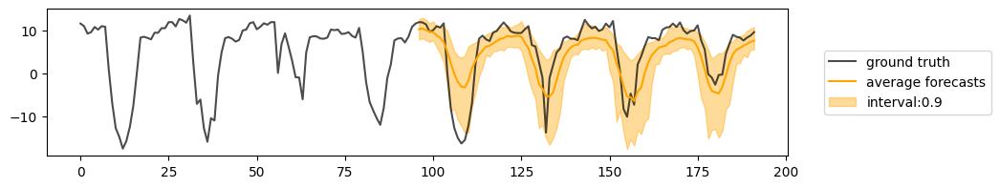

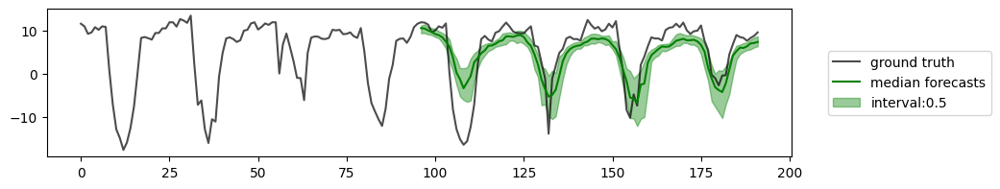

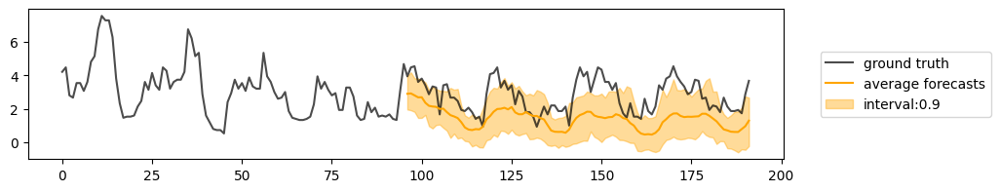

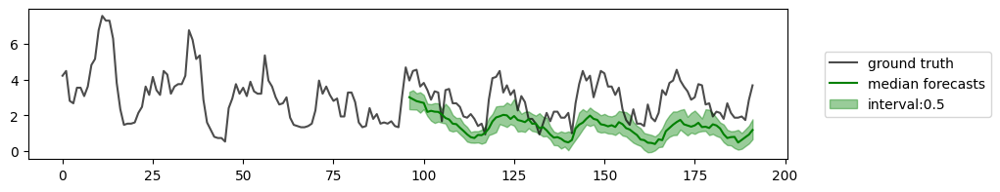

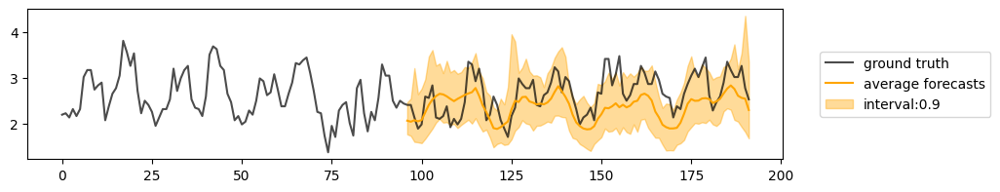

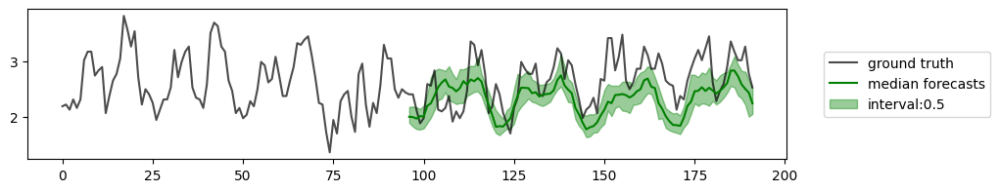

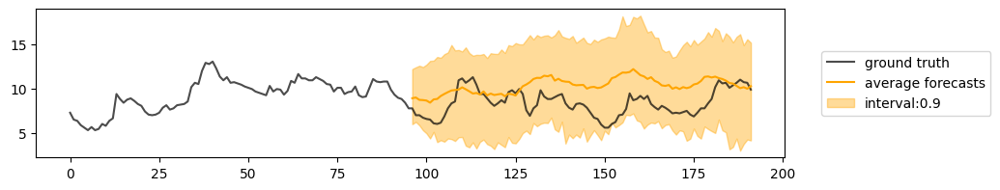

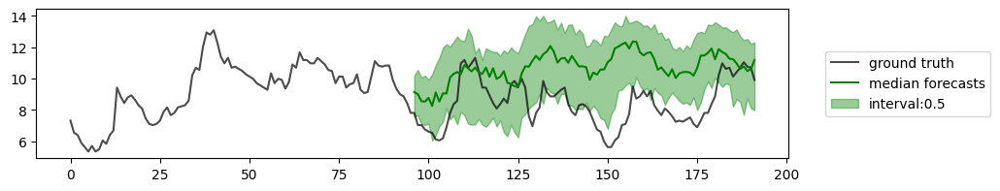

In [65]:
forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)

### Euler

In [66]:
model.scaler = data_manager.scaler
model.forecaster.solver = 'euler'
model.forecaster.solver_num_steps = 15
model.forecaster.solver_schedule = 'linear'

for batch in test_dataloader:
    break

In [67]:
steps = [10, 15, 20, 30, 50, 100]
euler_time = []
for num_steps in tqdm(steps):
    model.forecaster.solver_num_steps = num_steps
    euler_time.append(time_for_forecast(batch, model, n_repeats=1))
euler_time

100%|██████████| 6/6 [00:00<00:00,  6.24it/s]


[0.04749941825866699,
 0.06689977645874023,
 0.08277320861816406,
 0.12434148788452148,
 0.20878911018371582,
 0.4205172061920166]

In [68]:
euler_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=[10, 15, 20, 30, 50, 100])

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:09<00:45,  9.17s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           123.808349609375
    96_test_CRPS-Sum        166.59596252441406
      96_test_MASE           1074.666748046875
       96_test_MSE              1409609.375
     96_test_MSE-Sum            44002432.0
       96_test_ND           161.21800231933594
     96_test_ND-Sum         205.58529663085938
      96_test_NRMSE          257.3551025390625
    96_test_NRMSE-Sum       236.48399353027344
   96_test_weighted_ND      161.21800231933594
 96_test_weighted_ND-Sum    205.58529663085938
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [00:20<00:40, 10.21s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           27.81493377685547
    96_test_CRPS-Sum         40.35372543334961
      96_test_MASE           216.1317138671875
       96_test_MSE             183273.734375
     96_test_MSE-Sum             4954074.5
       96_test_ND           35.510868072509766
     96_test_ND-Sum         54.472694396972656
      96_test_NRMSE          88.85405731201172
    96_test_NRMSE-Sum        76.08021545410156
   96_test_weighted_ND      35.510868072509766
 96_test_weighted_ND-Sum    54.472694396972656
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [00:33<00:34, 11.44s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.3891734480857849
    96_test_CRPS-Sum        0.24751746654510498
      96_test_MASE          3.3088138103485107
       96_test_MSE           671.4136962890625
     96_test_MSE-Sum          4985.7412109375
       96_test_ND           0.5185665488243103
     96_test_ND-Sum         0.3311502933502197
      96_test_NRMSE         1.9203284978866577
    96_test_NRMSE-Sum       0.8518170118331909
   96_test_weighted_ND      0.5185665488243103
 96_test_weighted_ND-Sum    0.3311502933502197
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [00:49<00:26, 13.46s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.3830034136772156
    96_test_CRPS-Sum        0.24456825852394104
      96_test_MASE          3.1571457386016846
       96_test_MSE          14.202195167541504
     96_test_MSE-Sum        133.27198791503906
       96_test_ND           0.5033586025238037
     96_test_ND-Sum         0.3233959674835205
      96_test_NRMSE         0.7932155728340149
    96_test_NRMSE-Sum       0.4021991193294525
   96_test_weighted_ND      0.5033586025238037
 96_test_weighted_ND-Sum    0.3233959674835205
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [01:13<00:17, 17.33s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.3878549039363861
    96_test_CRPS-Sum        0.2494359314441681
      96_test_MASE          3.1398227214813232
       96_test_MSE          14.270930290222168
     96_test_MSE-Sum         138.5320587158203
       96_test_ND            0.501583993434906
     96_test_ND-Sum         0.3284359574317932
      96_test_NRMSE         0.7917903661727905
    96_test_NRMSE-Sum       0.40782028436660767
   96_test_weighted_ND       0.501583993434906
 96_test_weighted_ND-Sum    0.3284359574317932
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [01:56<00:00, 19.37s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.3823930621147156
    96_test_CRPS-Sum        0.2528092861175537
      96_test_MASE          3.0493478775024414
       96_test_MSE          14.237507820129395
     96_test_MSE-Sum         144.3245086669922
       96_test_ND           0.49277952313423157
     96_test_ND-Sum         0.3312602937221527
      96_test_NRMSE         0.7875232100486755
    96_test_NRMSE-Sum       0.41374334692955017
   96_test_weighted_ND      0.49277952313423157
 96_test_weighted_ND-Sum    0.3312602937221527
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [69]:
import pickle
with open("euler_metrics.pkl", "wb") as fp:
   pickle.dump(euler_metrics, fp)

10


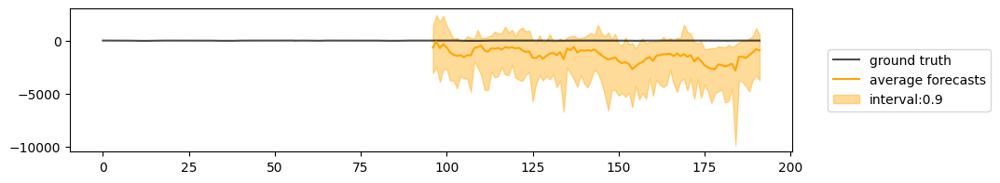

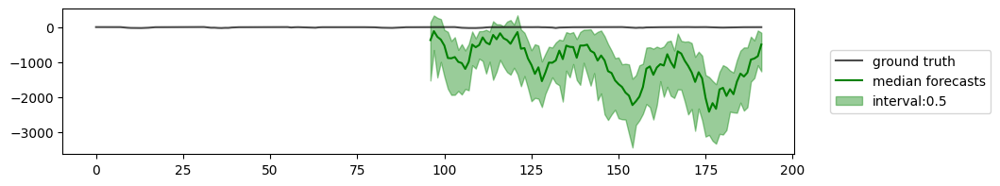

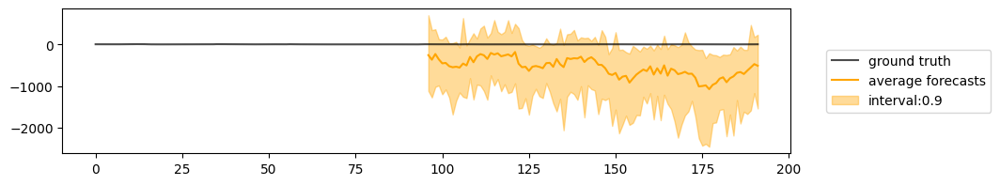

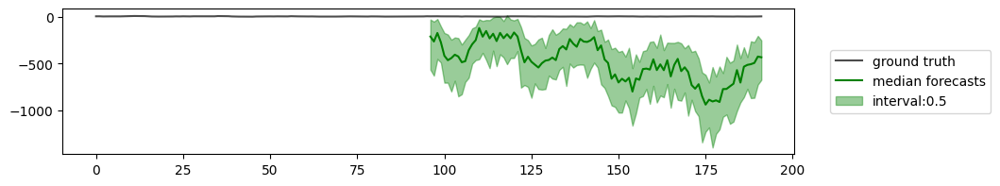

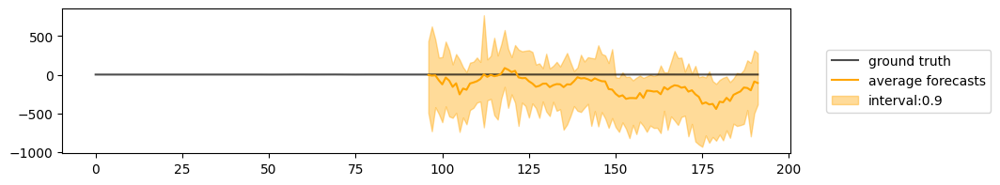

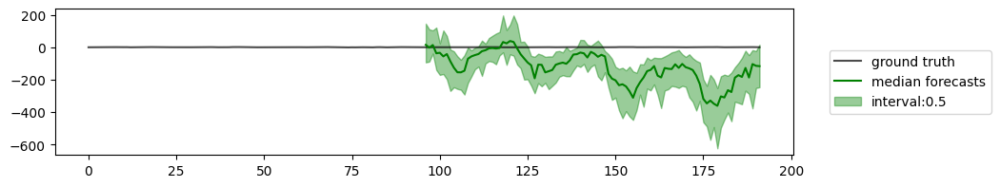

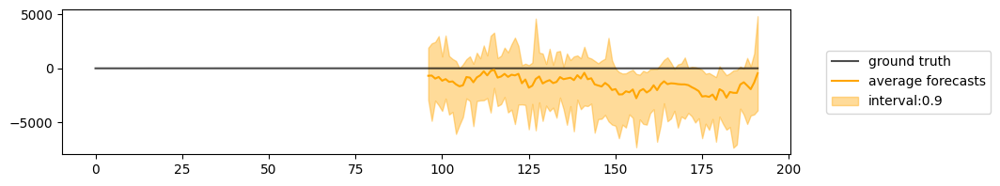

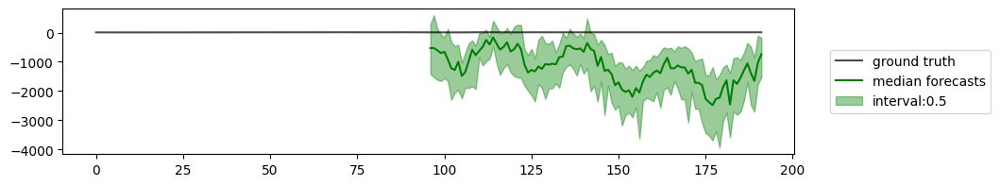

15


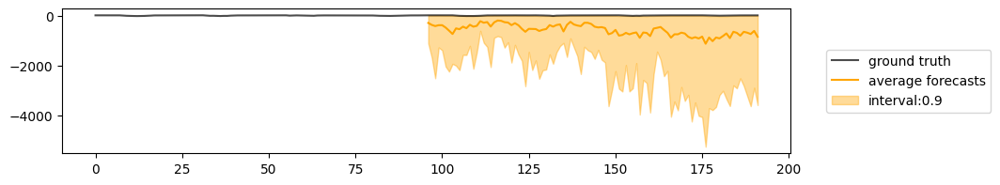

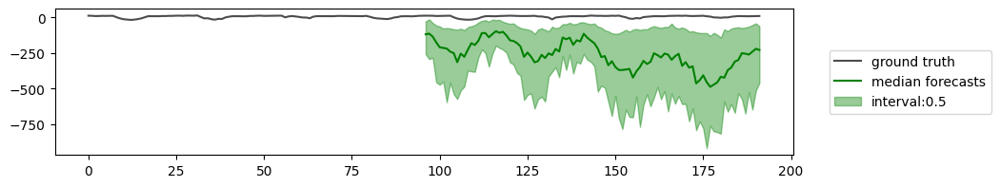

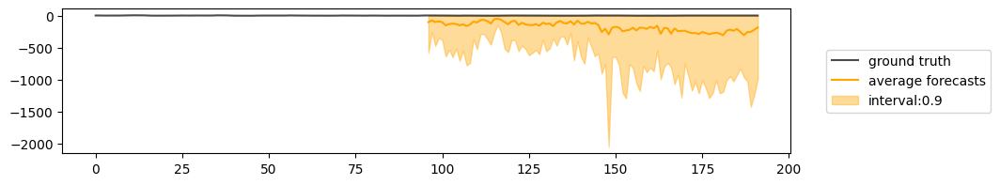

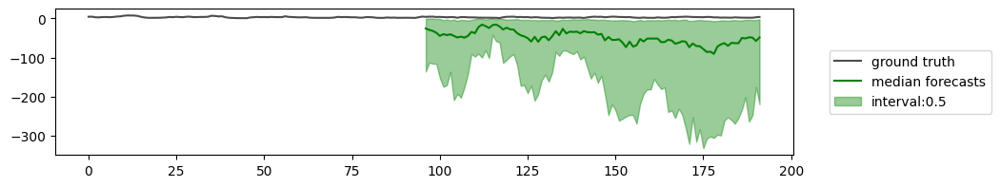

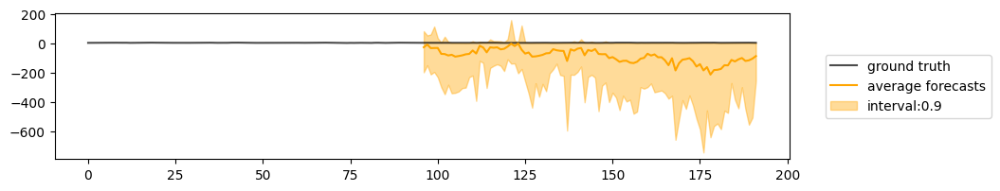

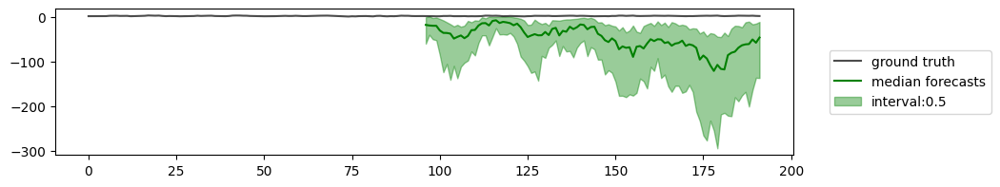

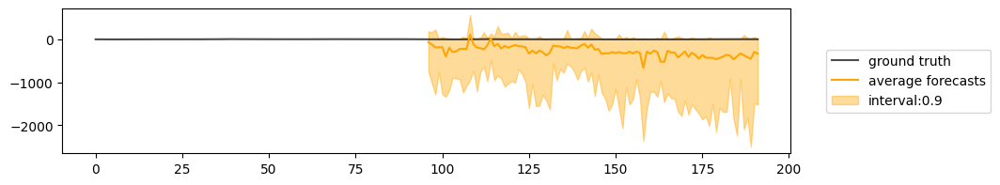

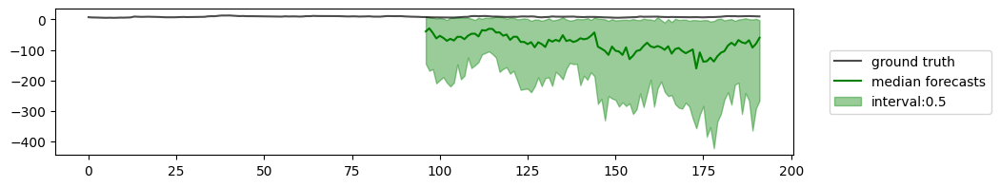

20


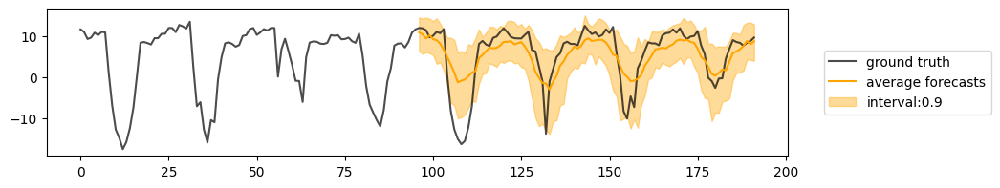

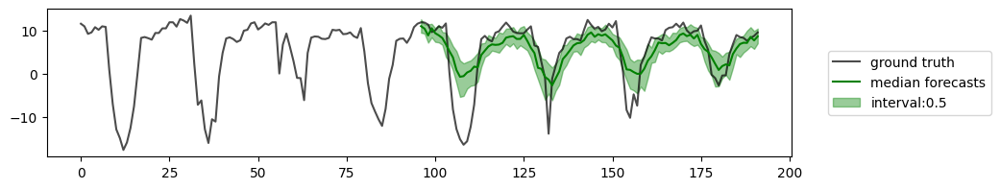

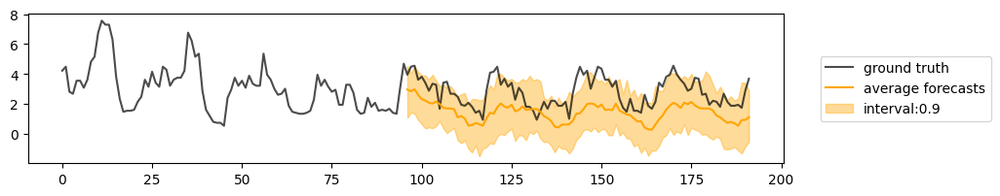

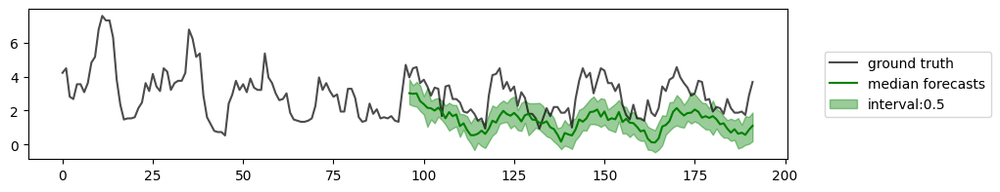

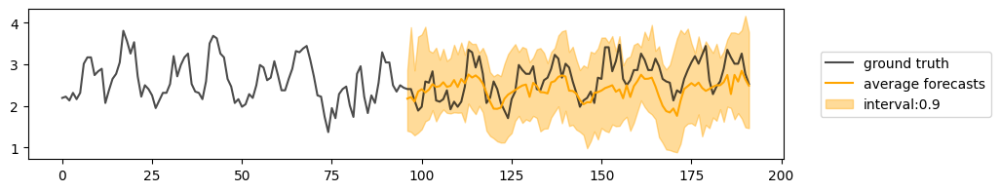

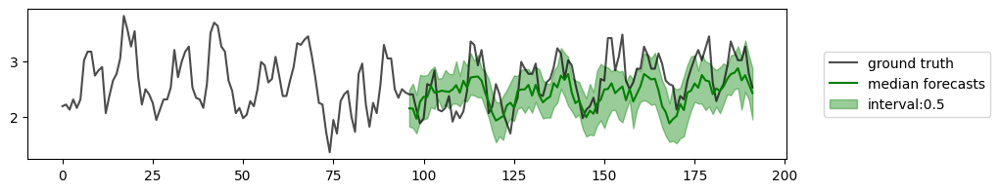

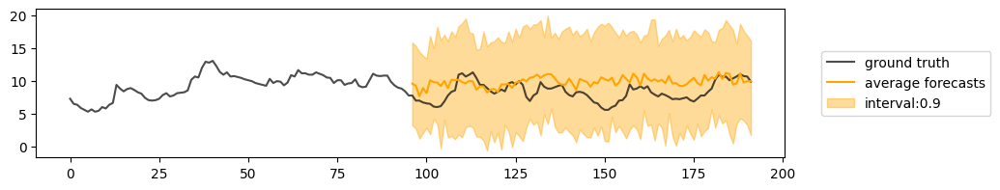

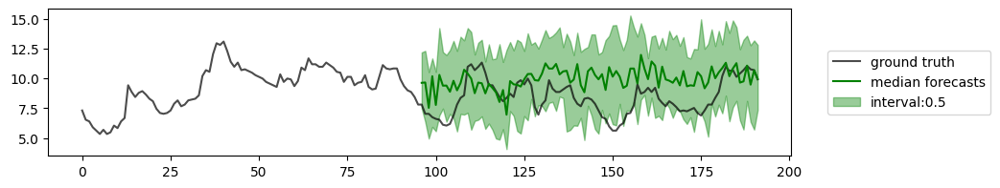

30


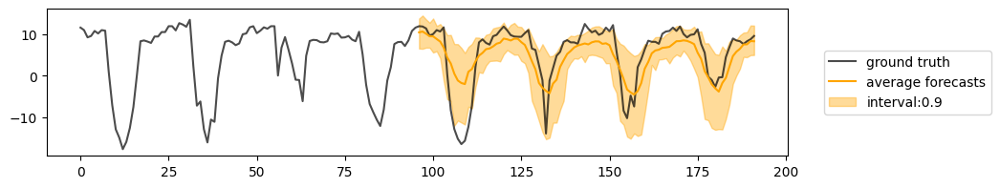

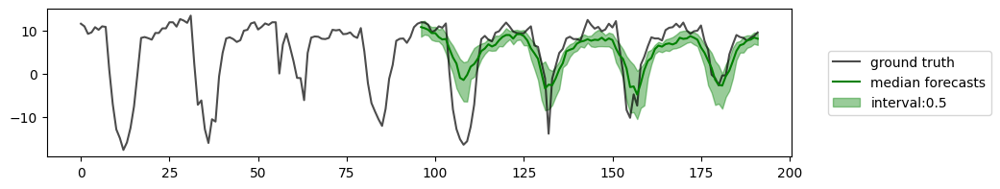

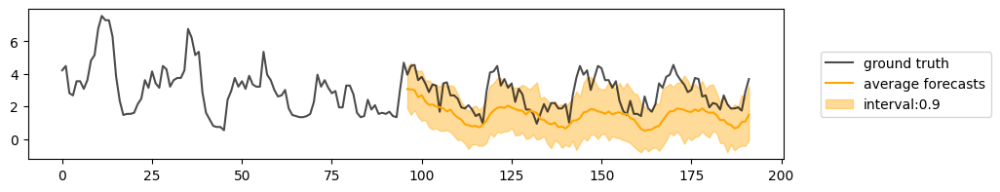

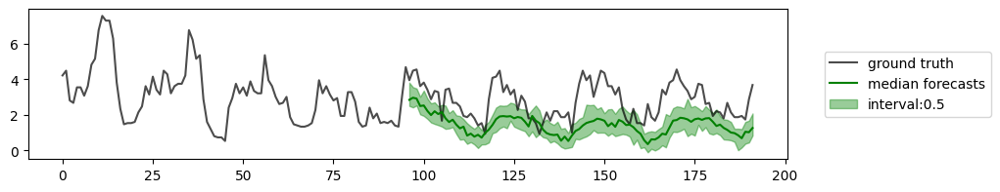

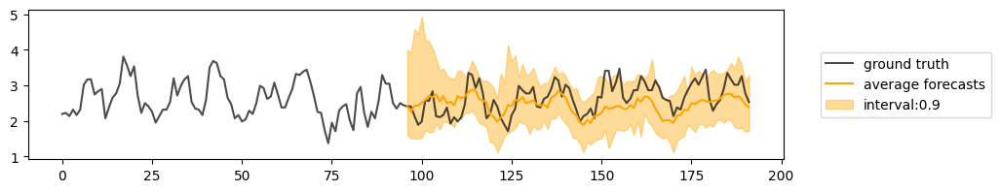

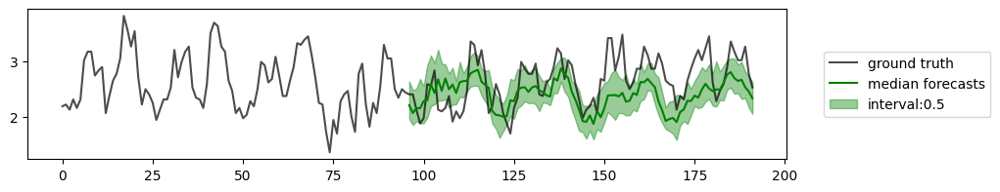

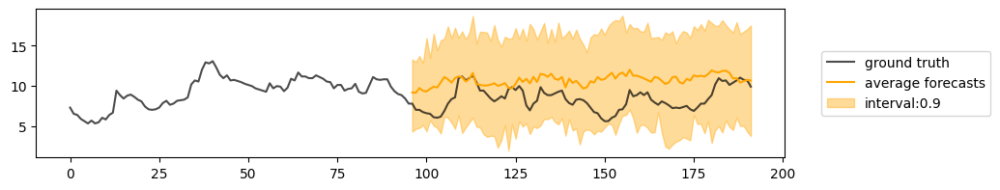

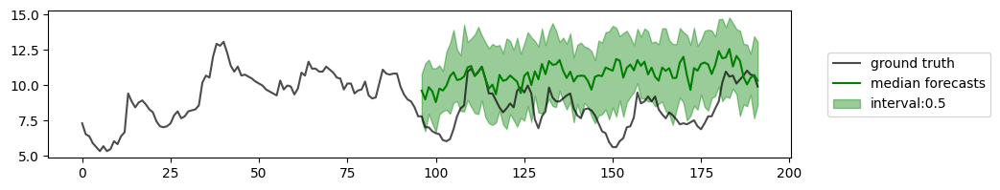

50


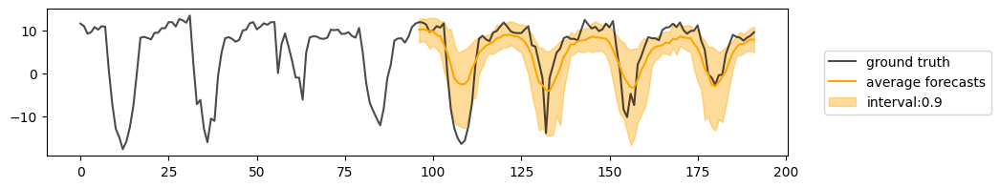

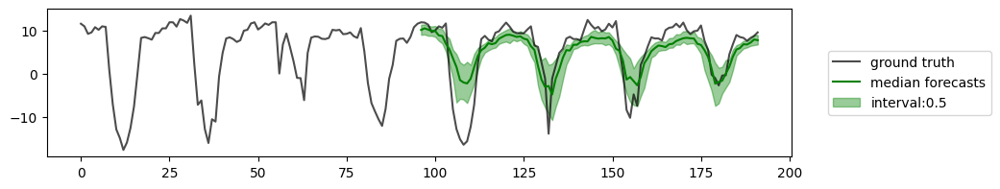

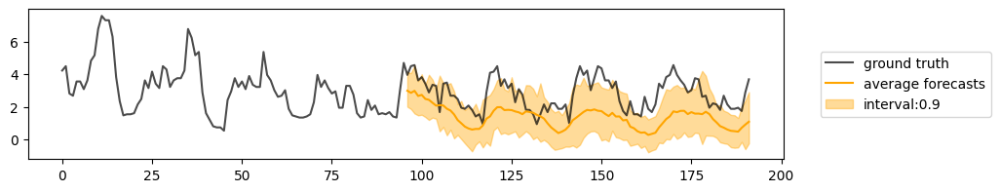

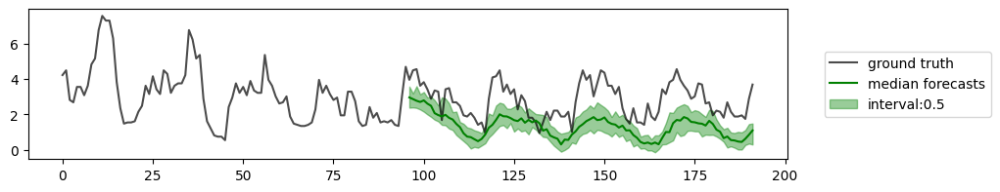

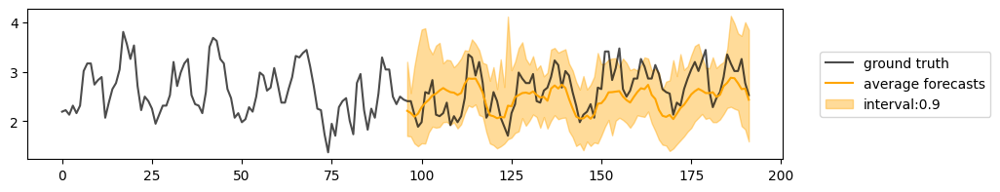

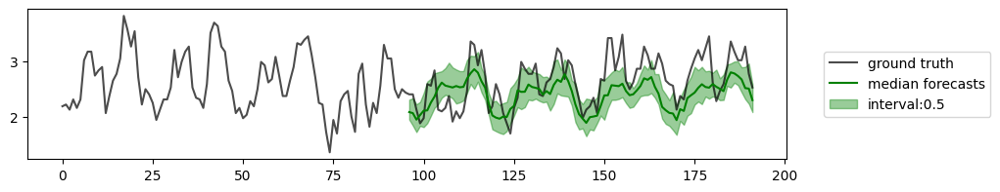

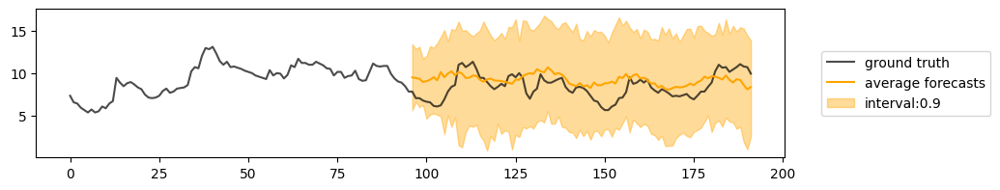

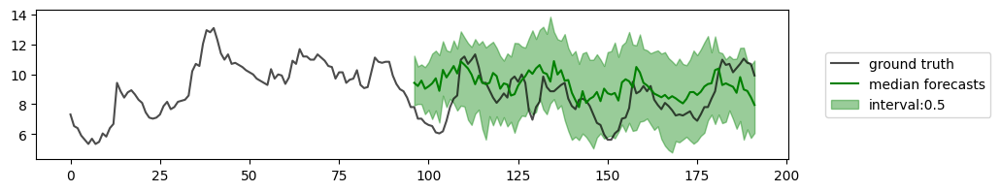

100


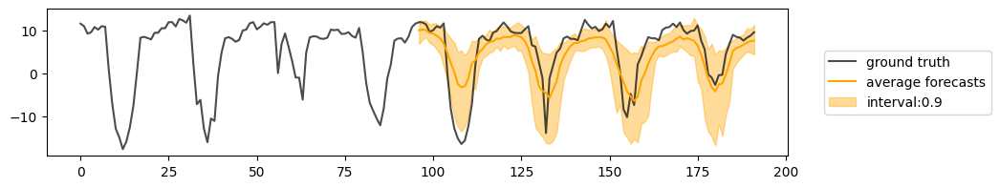

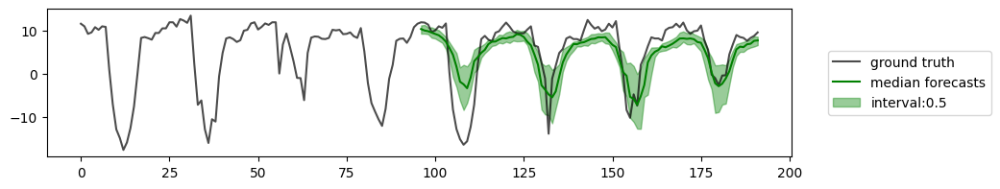

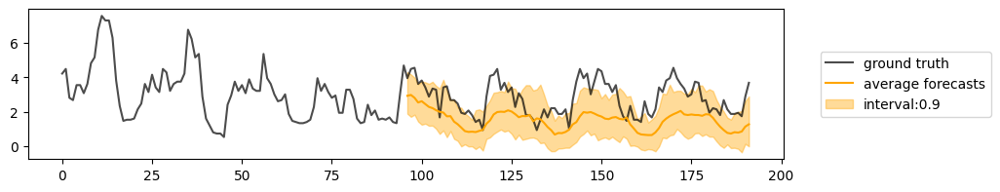

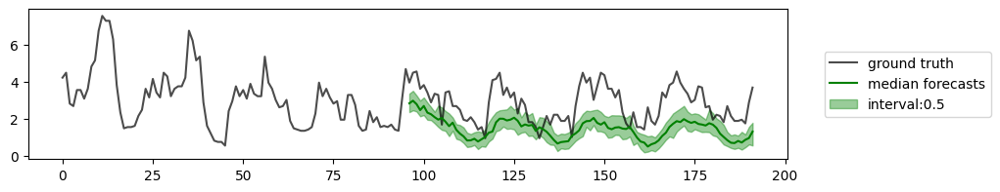

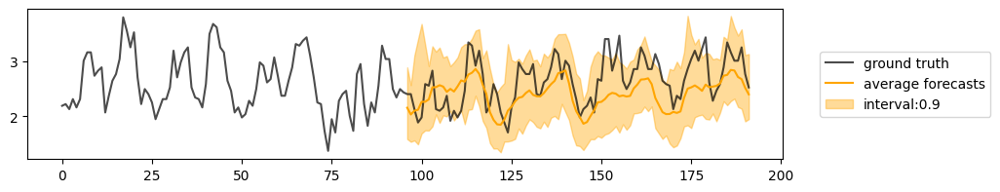

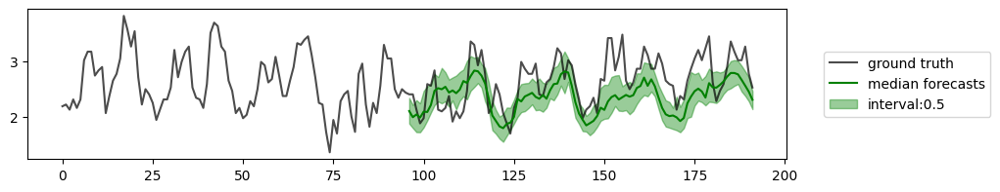

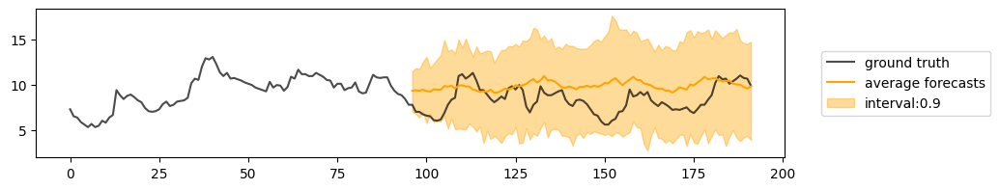

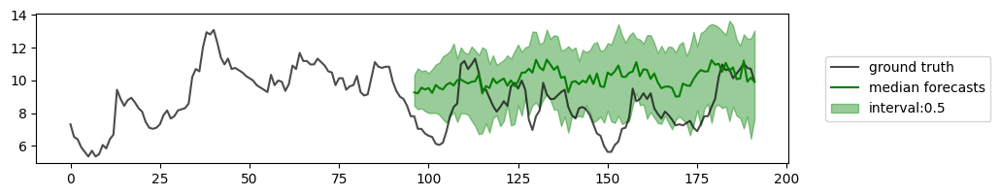

In [70]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)
plt.show()

### Heun

In [71]:
model.forecaster.solver = 'heun'
model.scaler = data_manager.scaler
model.forecaster.solver_num_steps = 15
model.forecaster.solver_schedule = 'linear'
steps = [10, 15, 20, 30, 50, 100]

for batch in test_dataloader:
    break

In [72]:
heun_time = []
for num_steps in tqdm(steps):
    model.forecaster.solver_num_steps = num_steps
    heun_time.append(time_for_forecast(batch, model, n_repeats=1))
heun_time

100%|██████████| 6/6 [00:01<00:00,  3.17it/s]


[0.08542895317077637,
 0.12155795097351074,
 0.16350317001342773,
 0.24721407890319824,
 0.4208214282989502,
 0.8397021293640137]

In [73]:
heun_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=steps)

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:12<01:04, 12.85s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           320.7261657714844
    96_test_CRPS-Sum         449.5220947265625
      96_test_MASE           2585.843505859375
       96_test_MSE              16554806.0
     96_test_MSE-Sum            486317472.0
       96_test_ND            406.1850280761719
     96_test_ND-Sum           574.8310546875
      96_test_NRMSE          866.5791625976562
    96_test_NRMSE-Sum        775.0026245117188
   96_test_weighted_ND       406.1850280761719
 96_test_weighted_ND-Sum      574.8310546875
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [00:28<00:58, 14.72s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.3963390588760376
    96_test_CRPS-Sum        0.27587902545928955
      96_test_MASE          3.2572896480560303
       96_test_MSE            40316.91015625
     96_test_MSE-Sum            234767.125
       96_test_ND           0.5160433053970337
     96_test_ND-Sum         0.33338746428489685
      96_test_NRMSE         22.342079162597656
    96_test_NRMSE-Sum        9.397555351257324
   96_test_weighted_ND      0.5160433053970337
 96_test_weighted_ND-Sum    0.33338746428489685
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [00:48<00:51, 17.09s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.39463695883750916
    96_test_CRPS-Sum        0.2565404176712036
      96_test_MASE          3.2027878761291504
       96_test_MSE             44398.2109375
     96_test_MSE-Sum            311815.9375
       96_test_ND           0.5097888708114624
     96_test_ND-Sum         0.3359502851963043
      96_test_NRMSE          9.015419006347656
    96_test_NRMSE-Sum          4.3310546875
   96_test_weighted_ND      0.5097888708114624
 96_test_weighted_ND-Sum    0.3359502851963043
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [01:16<00:42, 21.12s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.3840501308441162
    96_test_CRPS-Sum        0.25162485241889954
      96_test_MASE          3.0737721920013428
       96_test_MSE          14.221565246582031
     96_test_MSE-Sum         140.5477294921875
       96_test_ND            0.497266560792923
     96_test_ND-Sum         0.33093512058258057
      96_test_NRMSE         0.7910532355308533
    96_test_NRMSE-Sum       0.4104342460632324
   96_test_weighted_ND       0.497266560792923
 96_test_weighted_ND-Sum    0.33093512058258057
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [01:58<00:28, 28.70s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.3856070935726166
    96_test_CRPS-Sum        0.2554144561290741
      96_test_MASE          3.0524203777313232
       96_test_MSE           14.09730339050293
     96_test_MSE-Sum         144.8516387939453
       96_test_ND           0.4963339567184448
     96_test_ND-Sum         0.3337630033493042
      96_test_NRMSE         0.7896566390991211
    96_test_NRMSE-Sum       0.4159424901008606
   96_test_weighted_ND      0.4963339567184448
 96_test_weighted_ND-Sum    0.3337630033493042
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [03:17<00:00, 32.88s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.3846200704574585
    96_test_CRPS-Sum        0.2610936760902405
      96_test_MASE           3.016671657562256
       96_test_MSE           22.25921630859375
     96_test_MSE-Sum         205.9852752685547
       96_test_ND           0.4981757402420044
     96_test_ND-Sum         0.3418053388595581
      96_test_NRMSE         0.8928574323654175
    96_test_NRMSE-Sum       0.46508076786994934
   96_test_weighted_ND      0.4981757402420044
 96_test_weighted_ND-Sum    0.3418053388595581
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [74]:
import pickle
with open("heun_metrics.pkl", "wb") as fp:
   pickle.dump(heun_metrics, fp)

10


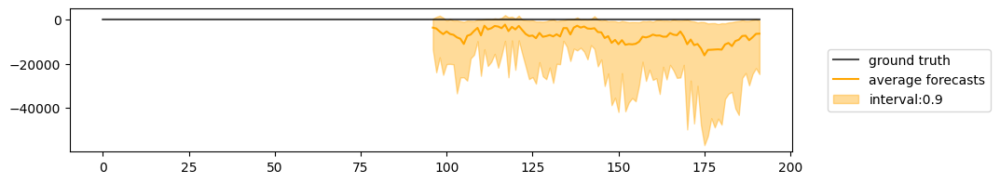

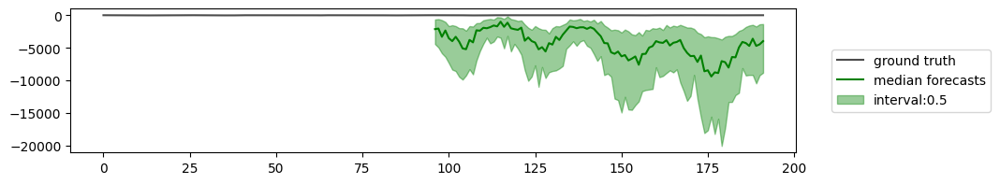

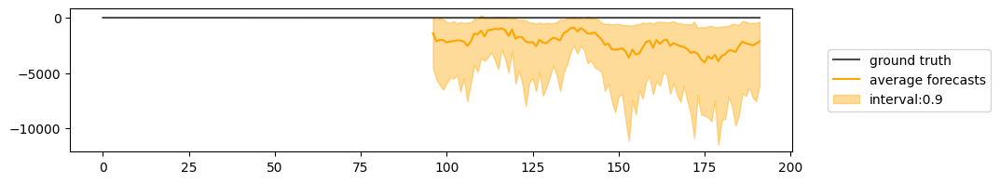

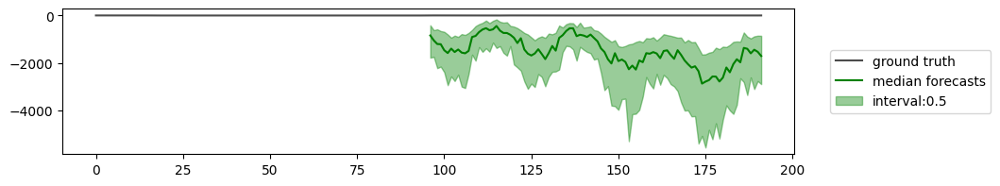

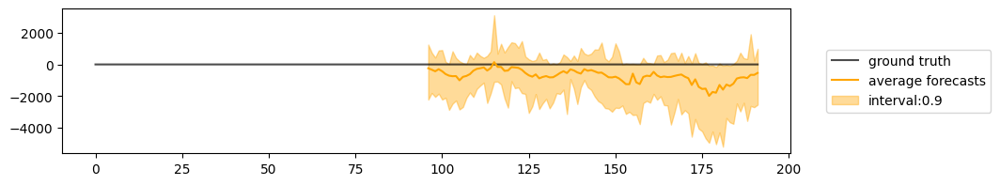

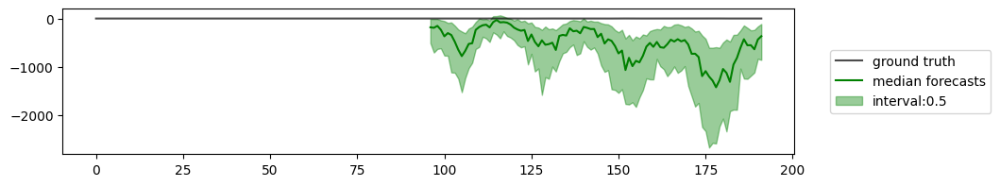

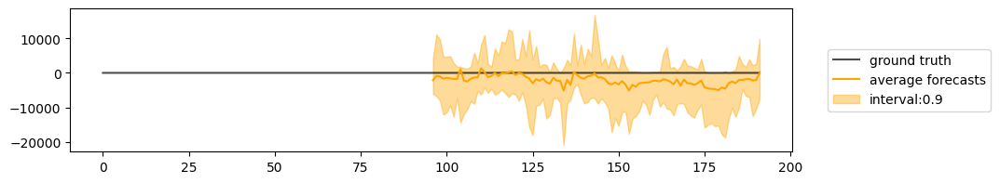

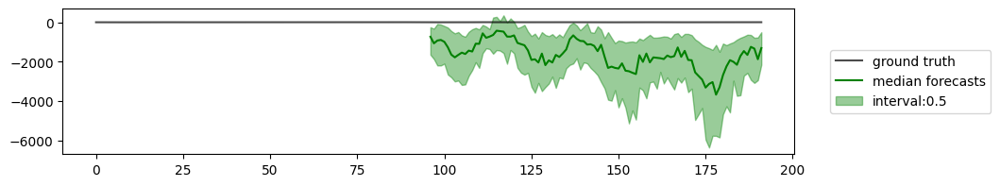

15


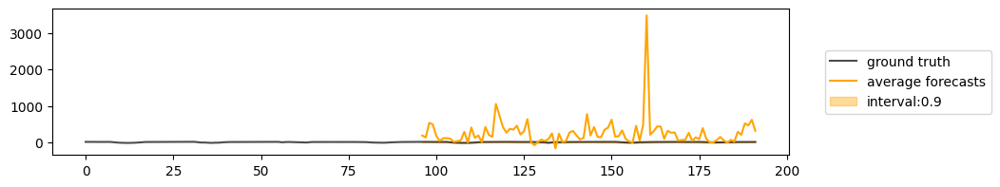

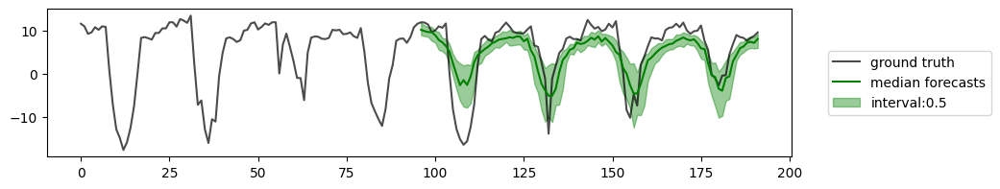

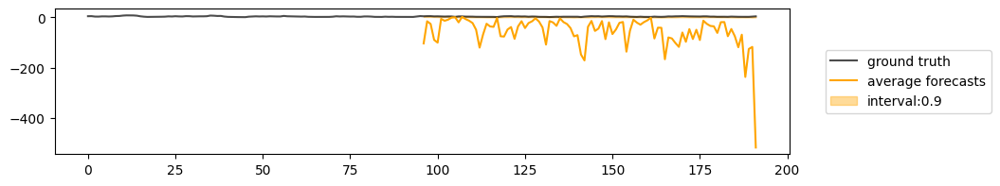

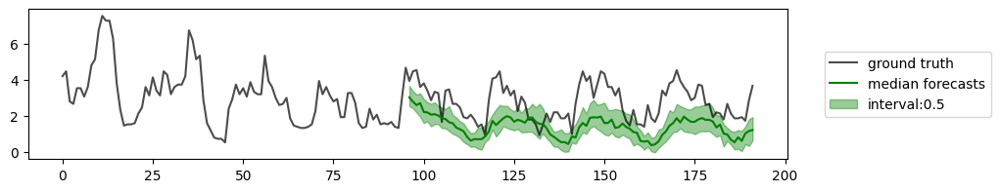

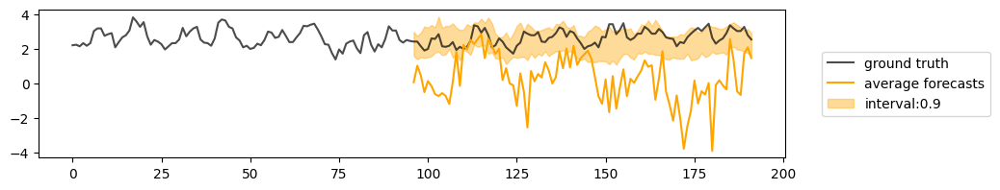

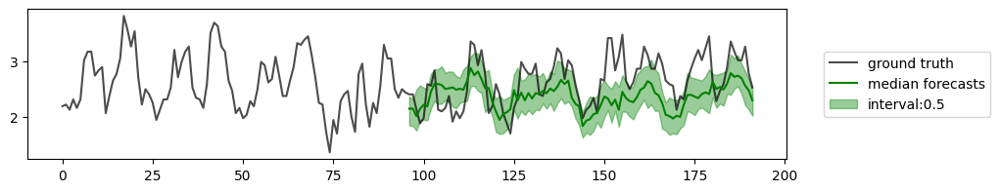

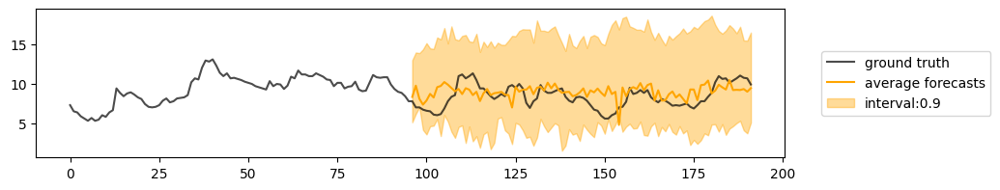

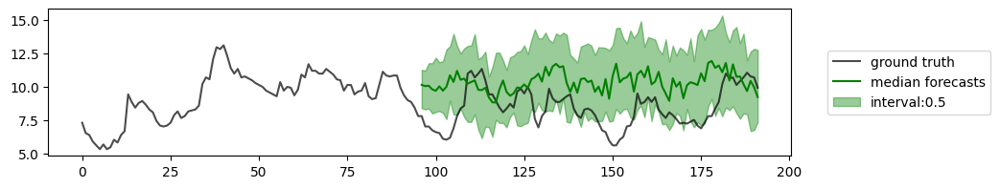

20


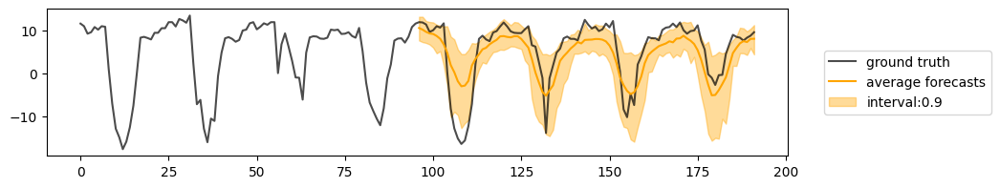

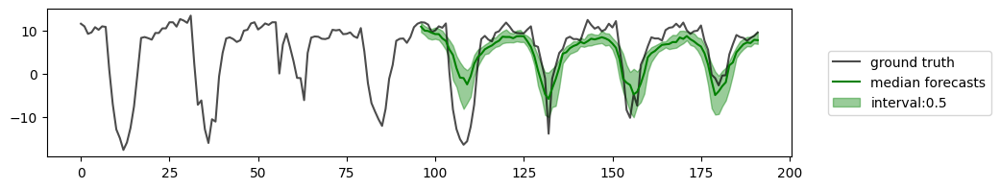

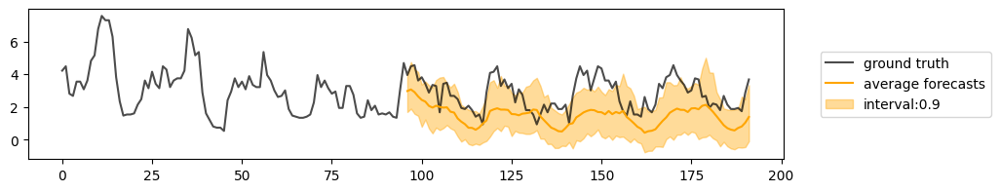

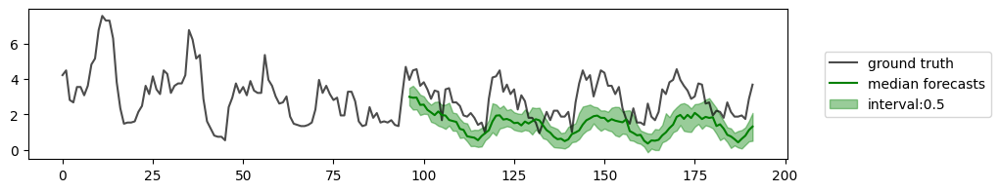

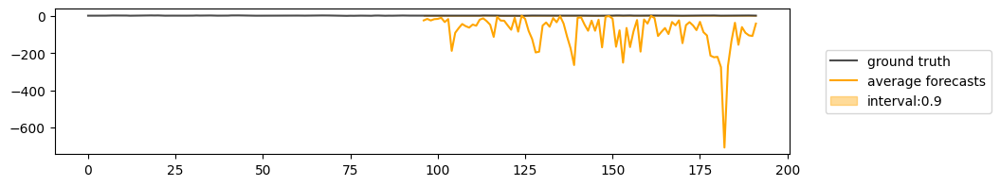

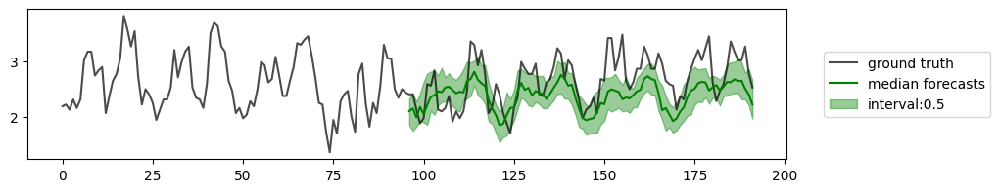

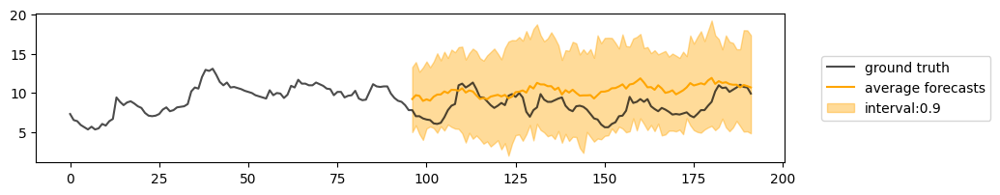

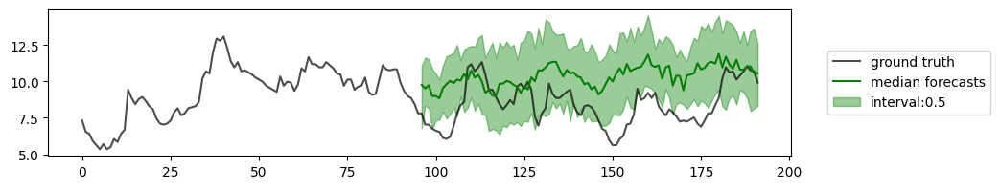

30


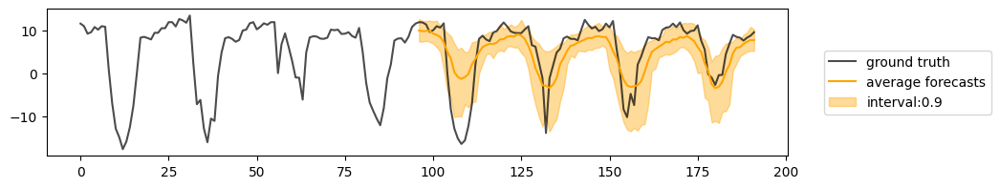

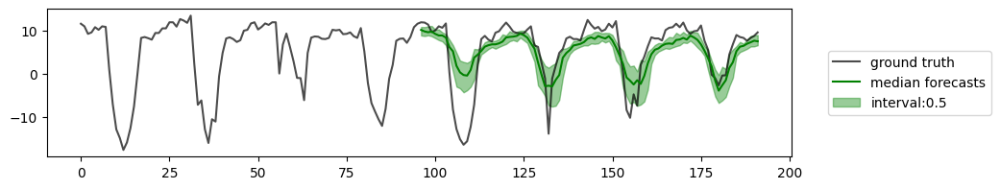

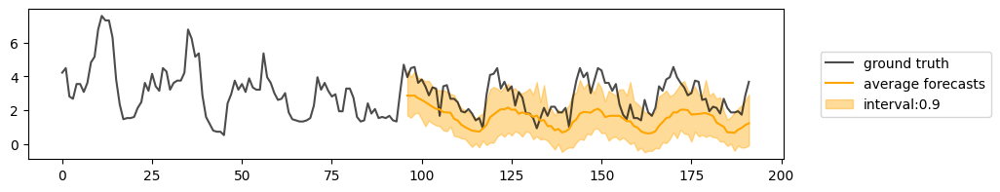

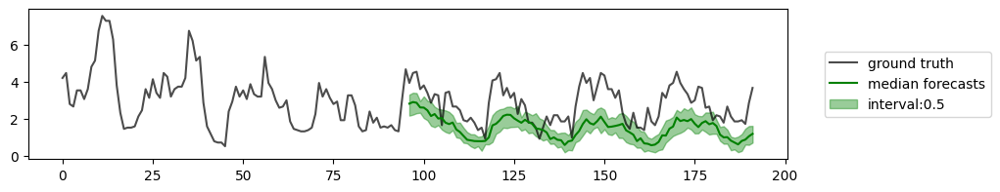

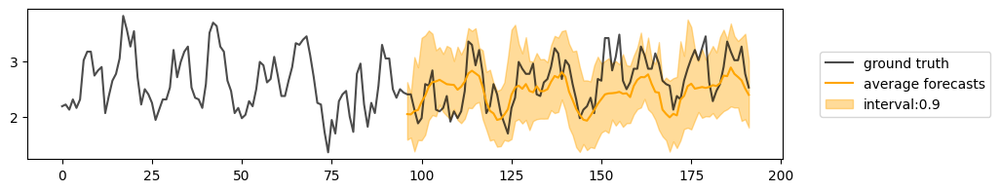

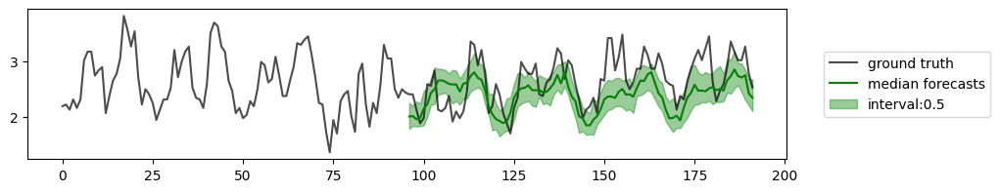

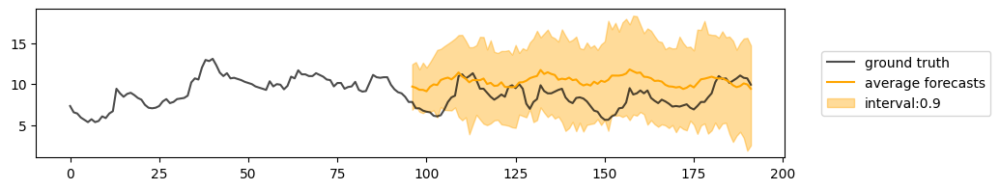

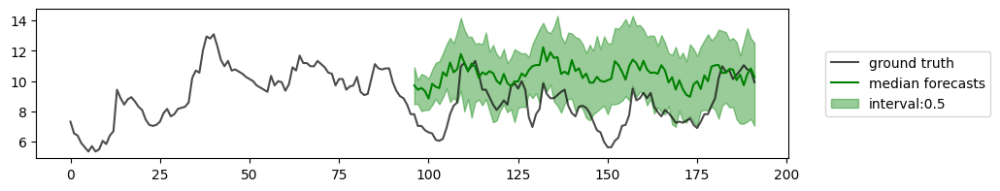

50


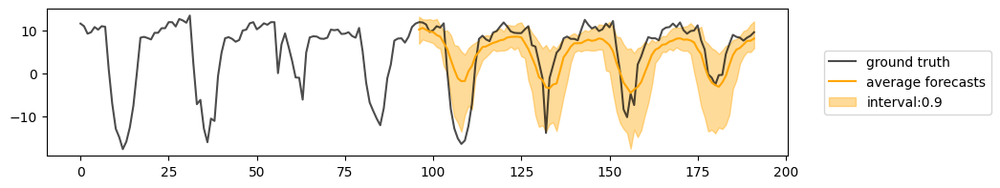

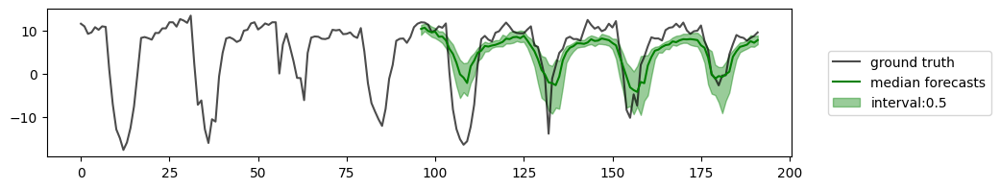

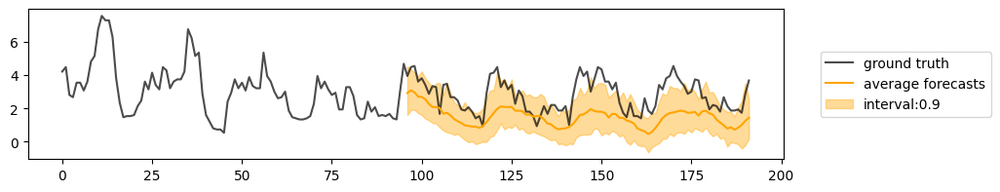

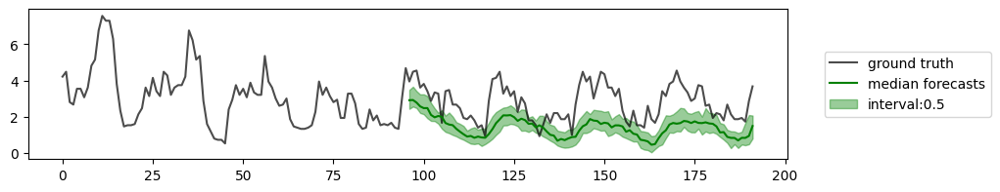

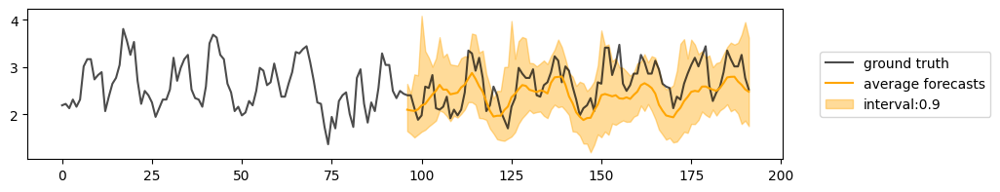

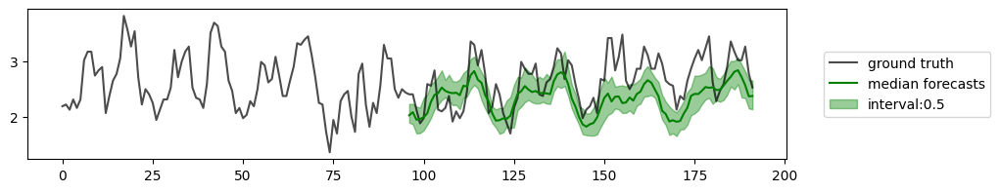

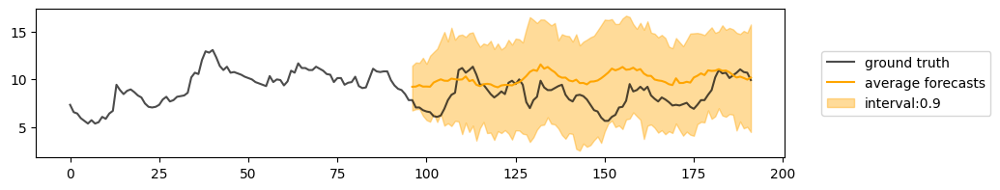

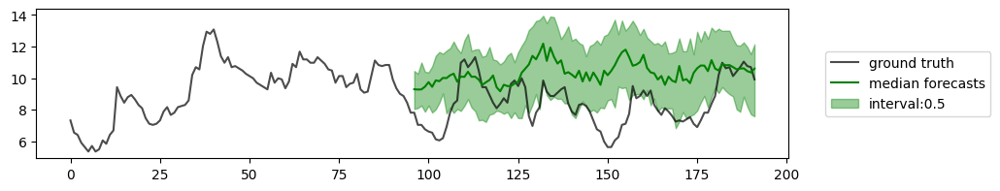

100


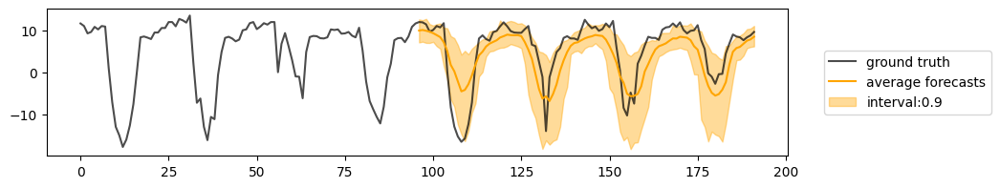

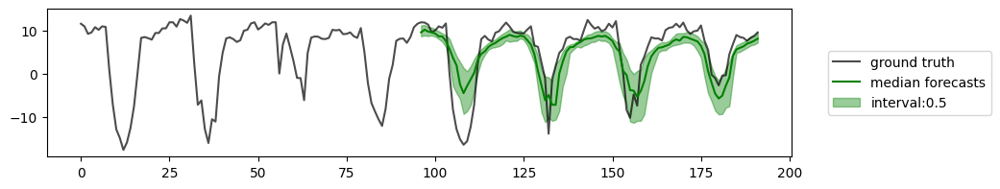

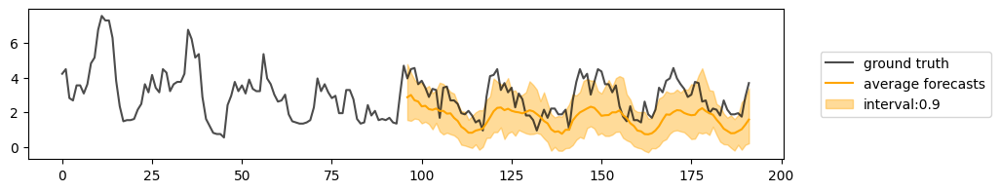

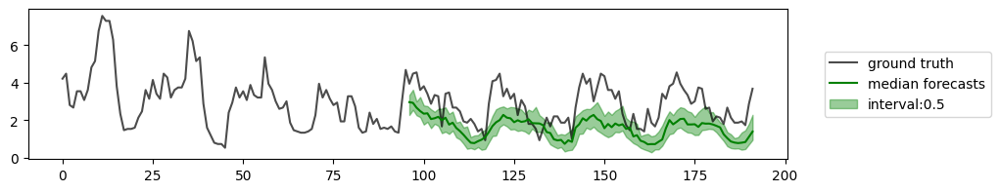

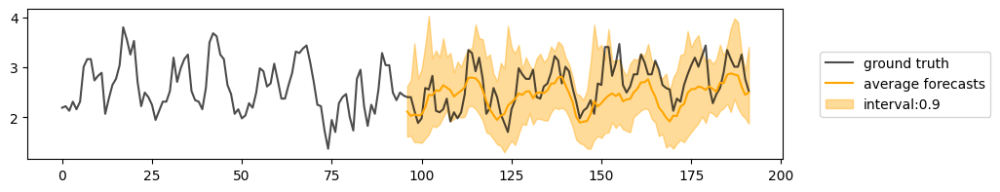

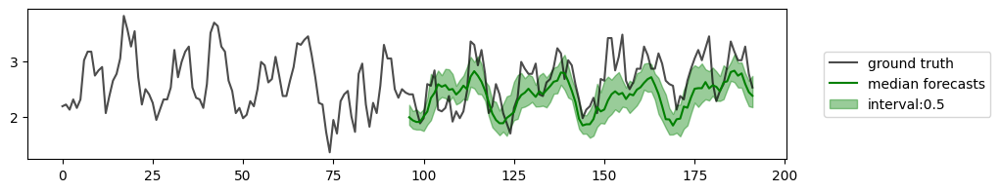

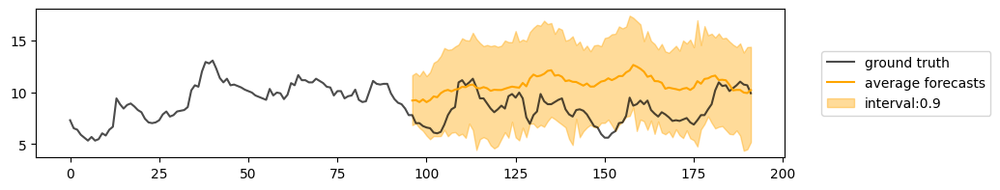

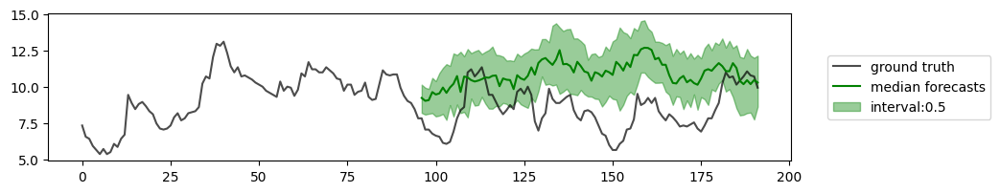

In [75]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)
    plt.show()

### DDIM, quad

In [76]:
model.forecaster.solver = 'ddim'
model.forecaster.solver_schedule = 'quad'
for batch in test_dataloader:
    break

In [77]:
ddim_time = []
for num_steps in tqdm(steps):
    model.forecaster.solver_num_steps = num_steps
    ddim_time.append(time_for_forecast(batch, model, n_repeats=1))
ddim_time

100%|██████████| 6/6 [00:00<00:00,  6.33it/s]


[0.04207181930541992,
 0.06068301200866699,
 0.08177566528320312,
 0.12328720092773438,
 0.2078239917755127,
 0.4205484390258789]

In [78]:
ddim_quad_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=steps)

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:09<00:47,  9.48s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           422.087646484375
    96_test_CRPS-Sum         530.6586303710938
      96_test_MASE           3627.567138671875
       96_test_MSE              10651995.0
     96_test_MSE-Sum            344770016.0
       96_test_ND            520.421630859375
     96_test_ND-Sum          621.8373413085938
      96_test_NRMSE          697.5812377929688
    96_test_NRMSE-Sum        655.4344482421875
   96_test_weighted_ND       520.421630859375
 96_test_weighted_ND-Sum     621.8373413085938
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [00:20<00:41, 10.28s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           80.48064422607422
    96_test_CRPS-Sum        103.91494750976562
      96_test_MASE           681.2889404296875
       96_test_MSE              620751.6875
     96_test_MSE-Sum            19016770.0
       96_test_ND           101.04796600341797
     96_test_ND-Sum         128.64114379882812
      96_test_NRMSE             167.734375
    96_test_NRMSE-Sum       152.83169555664062
   96_test_weighted_ND      101.04796600341797
 96_test_weighted_ND-Sum    128.64114379882812
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [00:32<00:34, 11.36s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          21.716392517089844
    96_test_CRPS-Sum        28.459020614624023
      96_test_MASE          161.65013122558594
       96_test_MSE             105673.90625
     96_test_MSE-Sum             2552296.0
       96_test_ND           26.719388961791992
     96_test_ND-Sum          35.33814239501953
      96_test_NRMSE          65.12538146972656
    96_test_NRMSE-Sum        54.55780792236328
   96_test_weighted_ND      26.719388961791992
 96_test_weighted_ND-Sum     35.33814239501953
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [00:49<00:26, 13.31s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           4.626341819763184
    96_test_CRPS-Sum         6.200074195861816
      96_test_MASE          32.590423583984375
       96_test_MSE            37386.35546875
     96_test_MSE-Sum            433712.9375
       96_test_ND            5.346741199493408
     96_test_ND-Sum          7.256223678588867
      96_test_NRMSE         32.306549072265625
    96_test_NRMSE-Sum        20.30067253112793
   96_test_weighted_ND       5.346741199493408
 96_test_weighted_ND-Sum     7.256223678588867
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [01:12<00:17, 17.04s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           2.183474540710449
    96_test_CRPS-Sum        2.8590259552001953
      96_test_MASE          15.407673835754395
       96_test_MSE            9553.193359375
     96_test_MSE-Sum           101073.15625
       96_test_ND           2.5331852436065674
     96_test_ND-Sum          3.317016124725342
      96_test_NRMSE         16.308086395263672
    96_test_NRMSE-Sum        9.76788330078125
   96_test_weighted_ND      2.5331852436065674
 96_test_weighted_ND-Sum     3.317016124725342
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [01:55<00:00, 19.18s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           1.270943284034729
    96_test_CRPS-Sum        1.5541609525680542
      96_test_MASE           9.742806434631348
       96_test_MSE            9712.1845703125
     96_test_MSE-Sum           81981.4296875
       96_test_ND           1.5406949520111084
     96_test_ND-Sum         1.8479710817337036
      96_test_NRMSE         14.286665916442871
    96_test_NRMSE-Sum        7.340028762817383
   96_test_weighted_ND      1.5406949520111084
 96_test_weighted_ND-Sum    1.8479710817337036
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [79]:
with open("ddim_quad_metrics.pkl", "wb") as fp:
   pickle.dump(ddim_quad_metrics, fp)

10


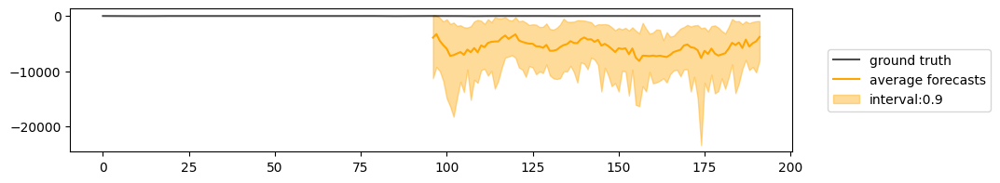

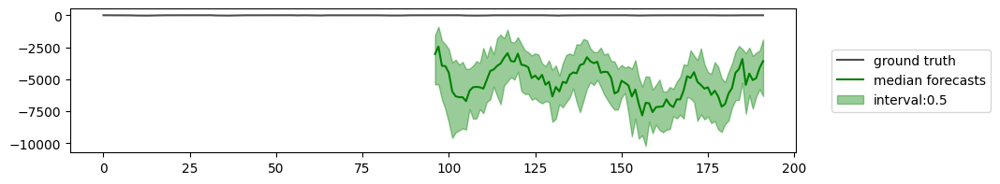

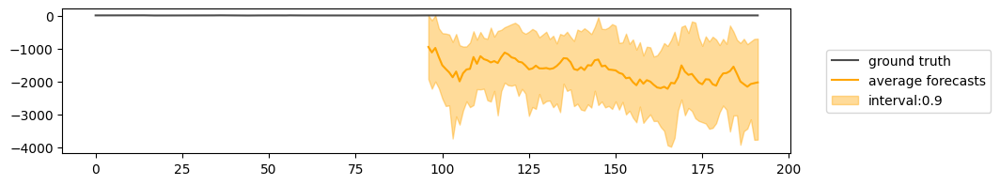

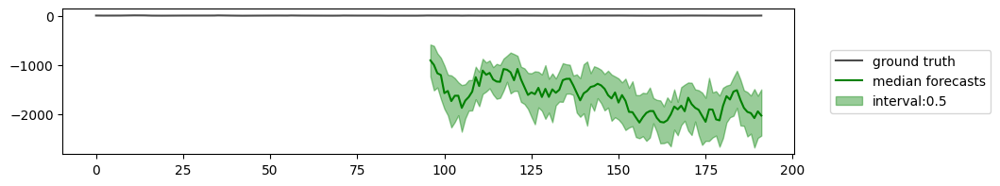

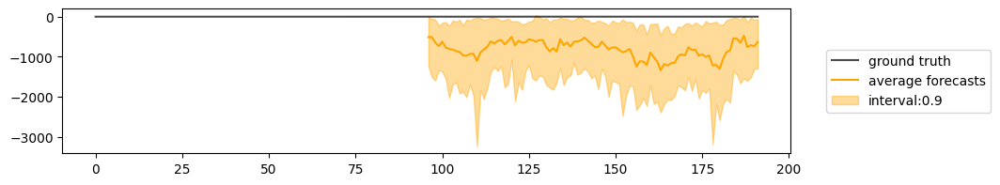

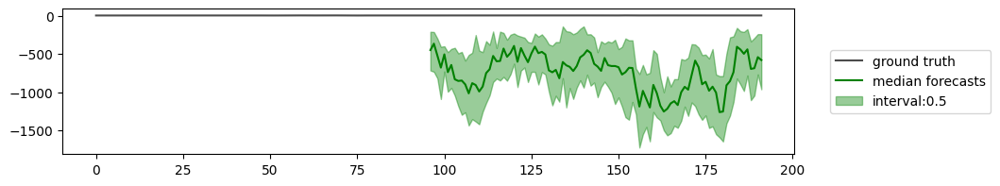

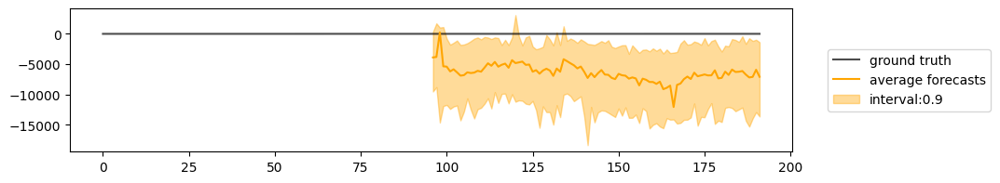

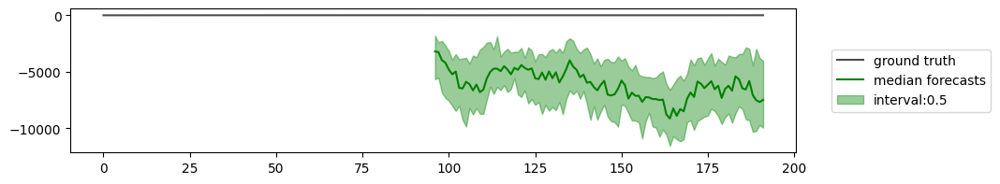

15


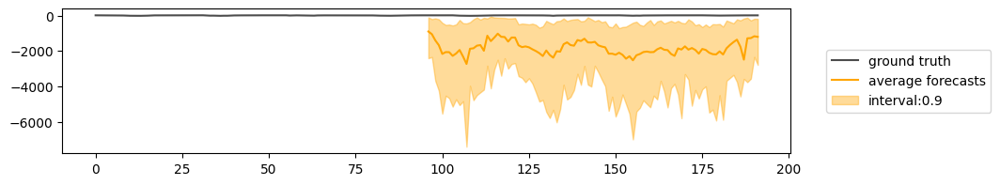

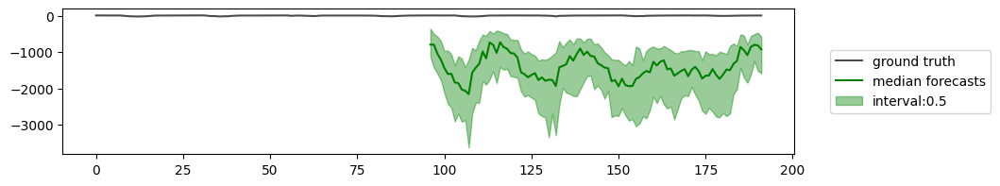

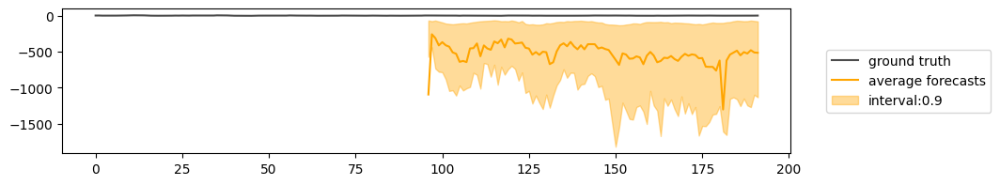

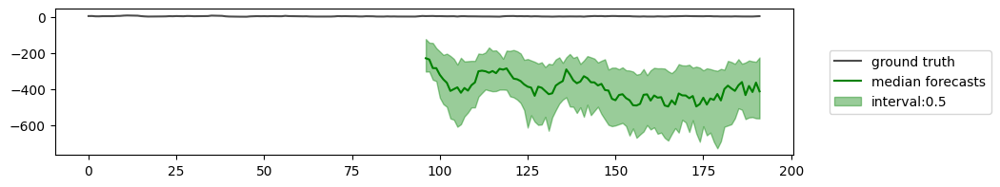

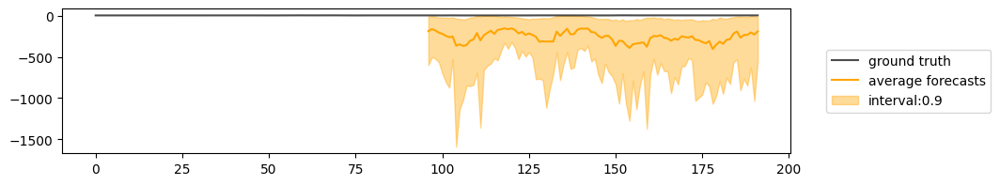

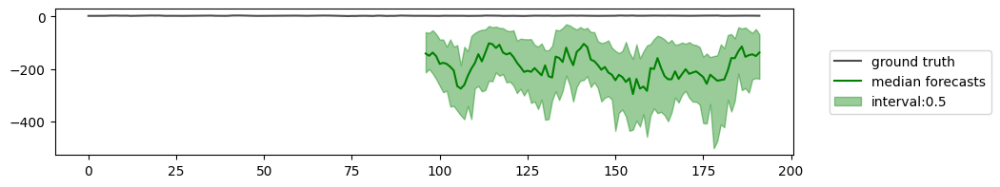

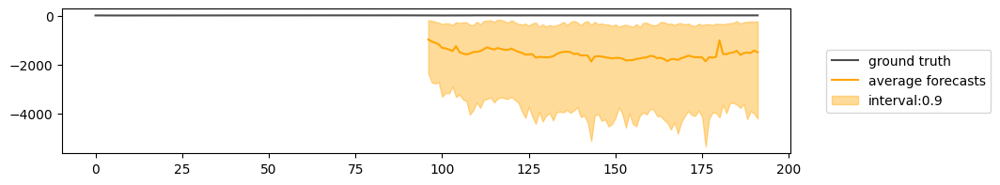

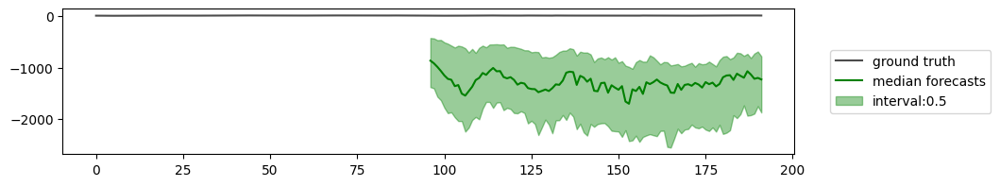

20


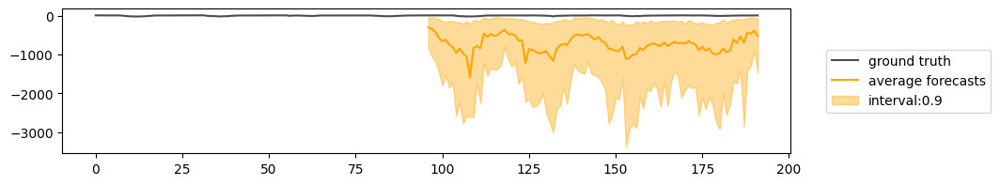

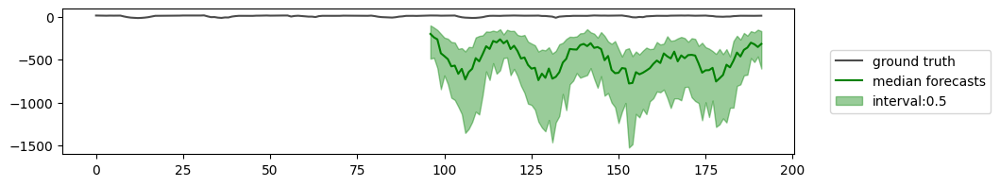

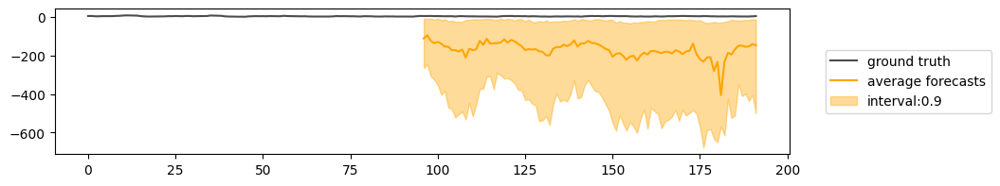

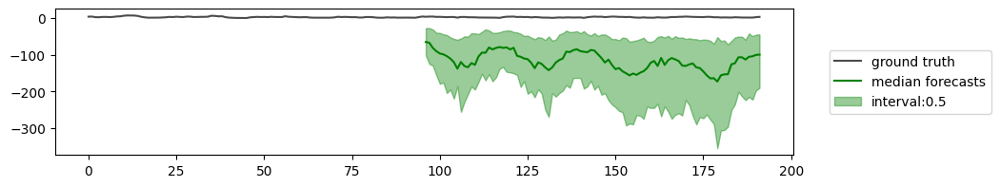

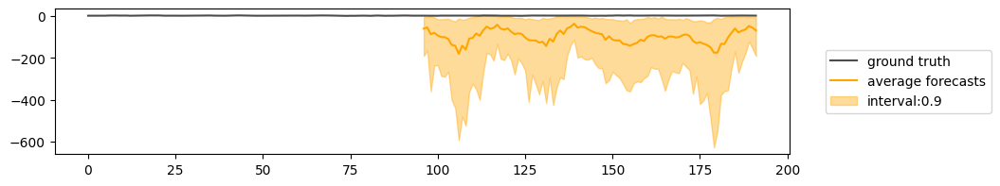

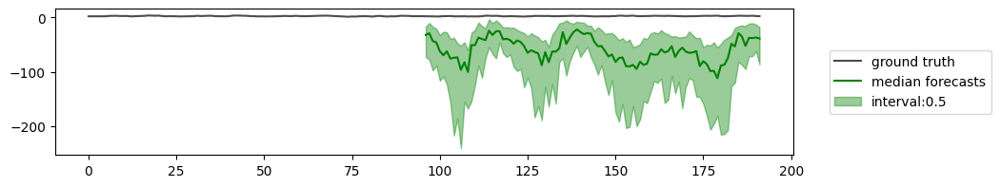

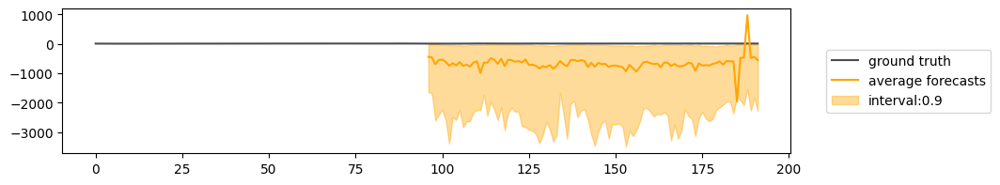

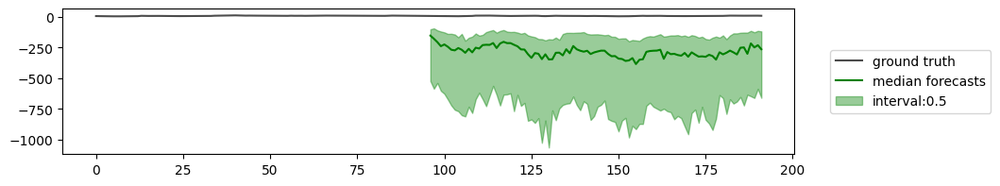

30


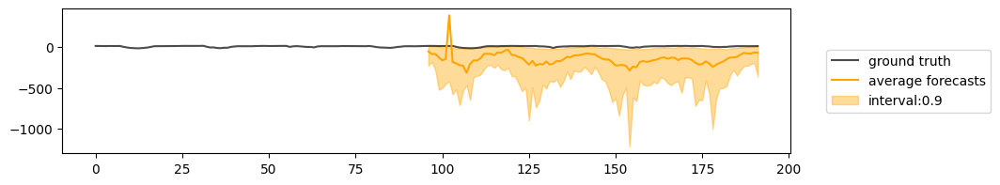

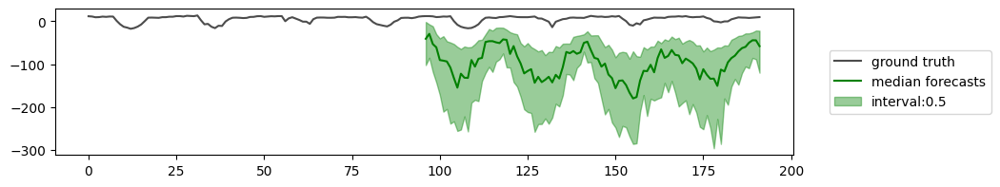

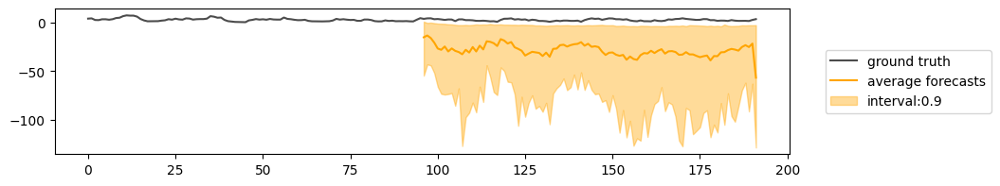

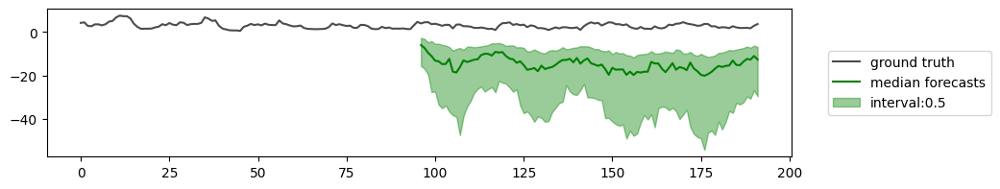

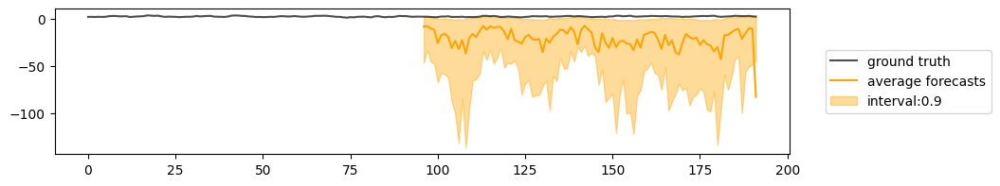

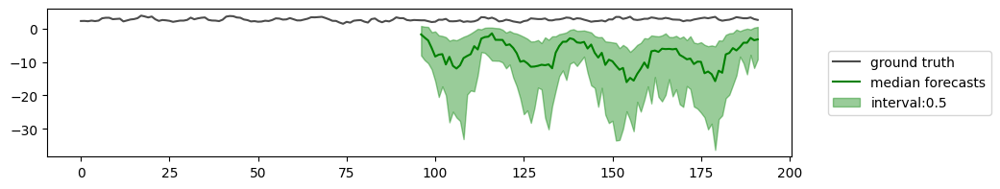

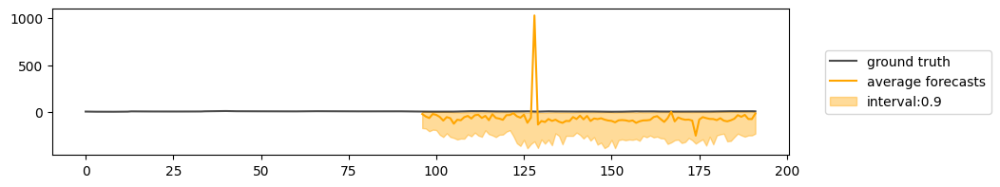

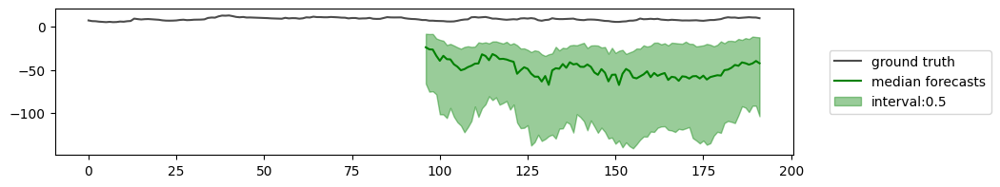

50


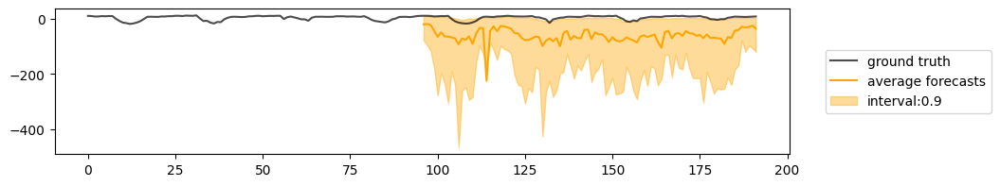

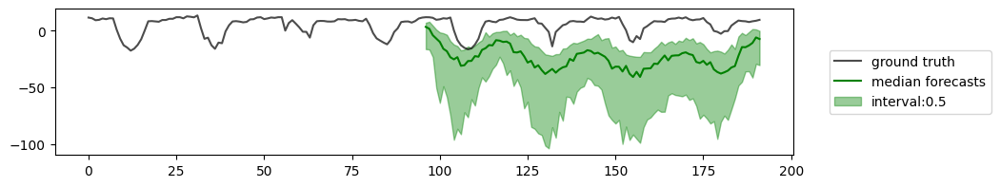

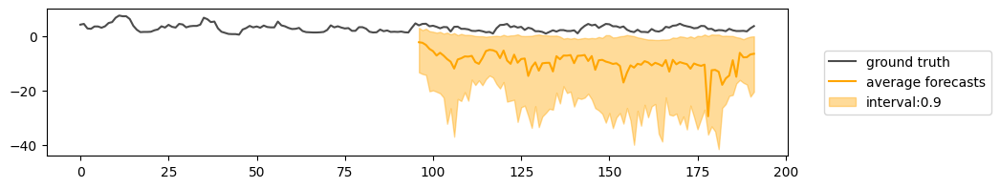

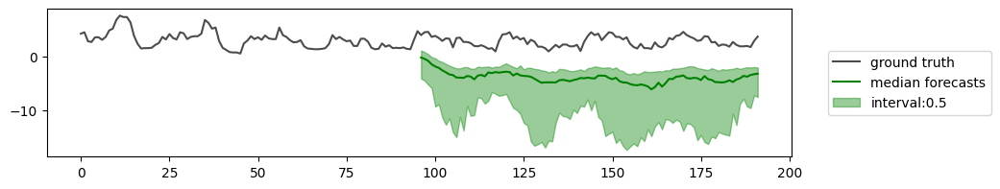

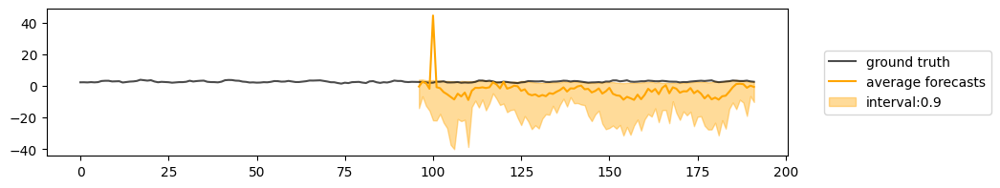

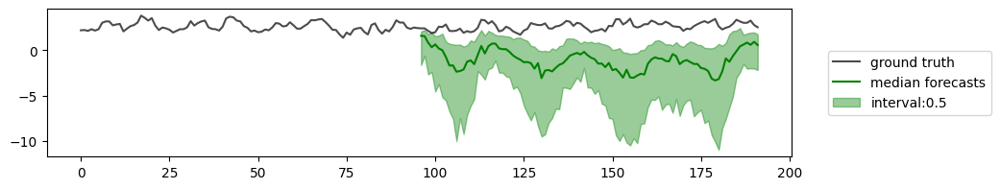

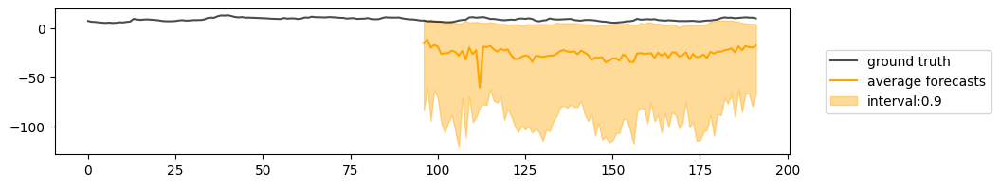

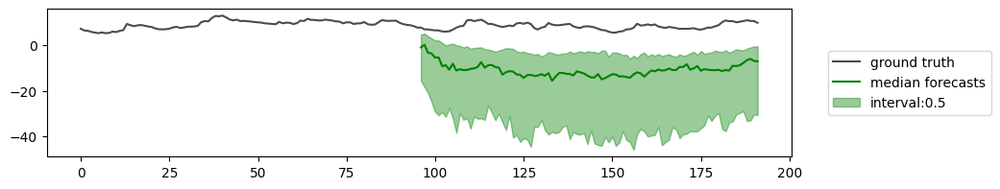

100


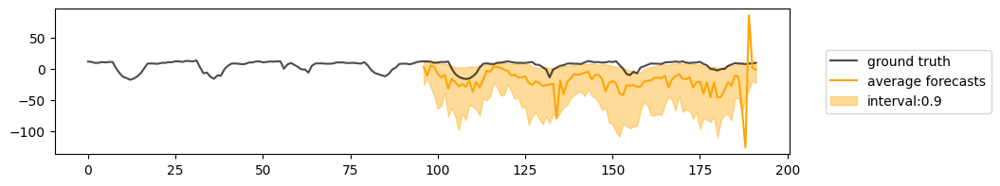

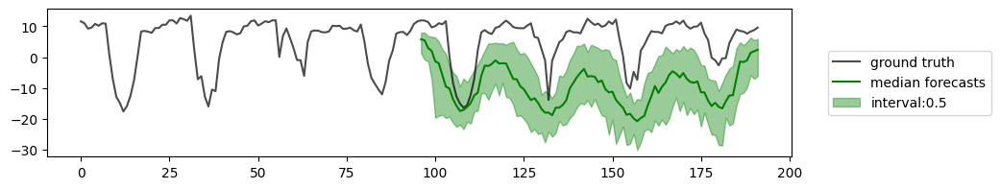

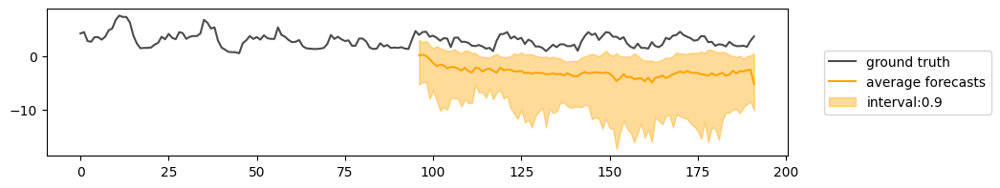

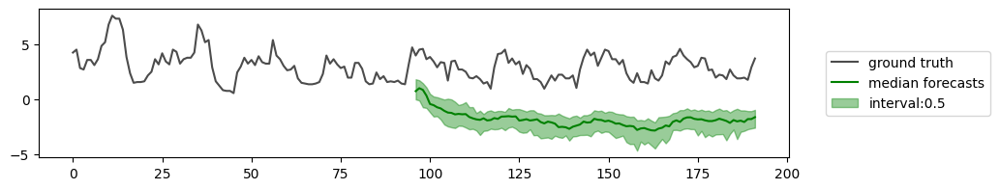

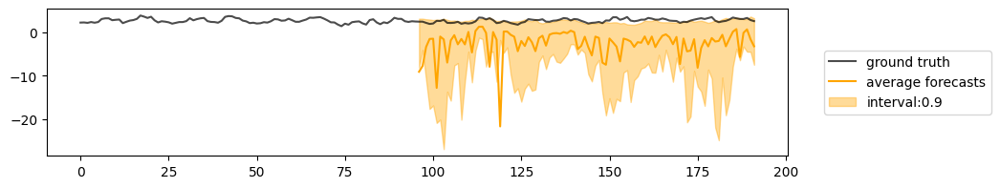

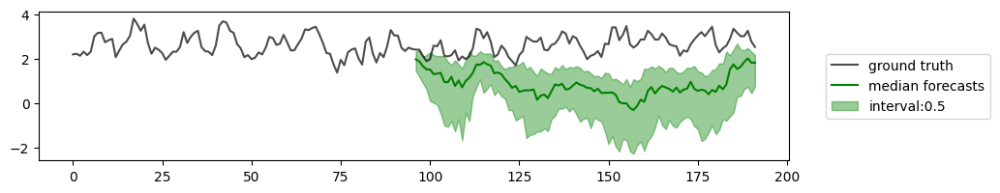

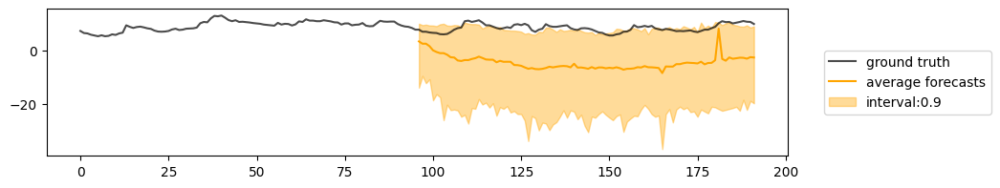

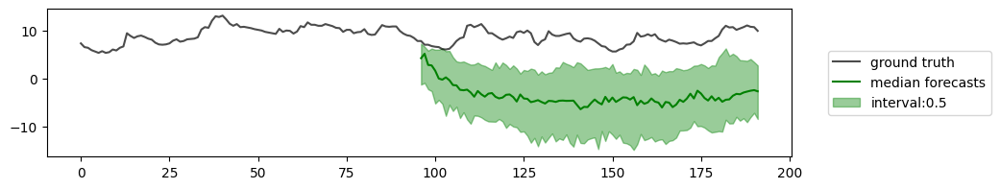

In [80]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)
    plt.show()

### DDIM, linear

10


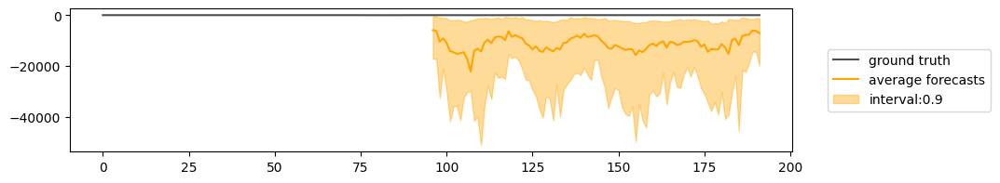

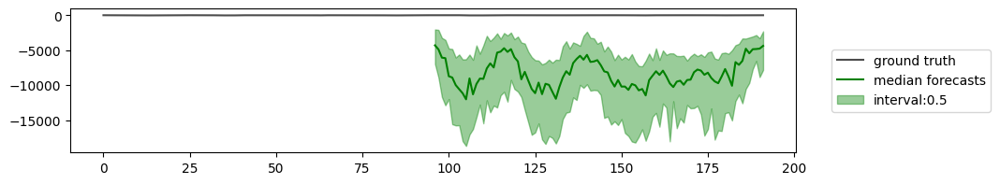

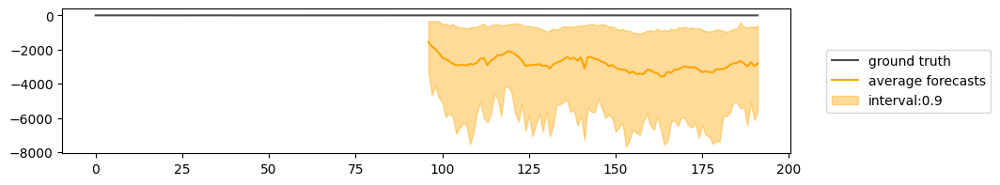

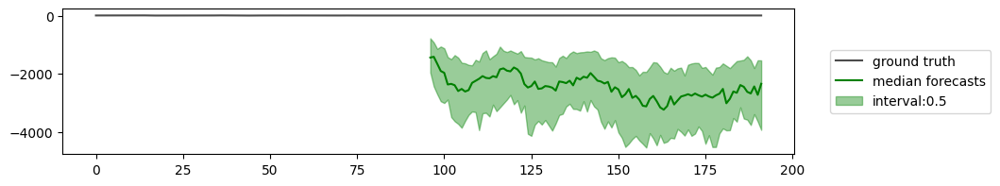

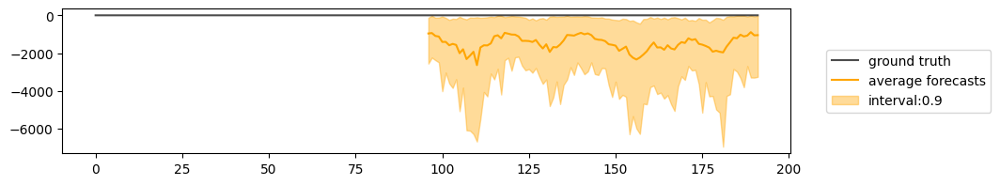

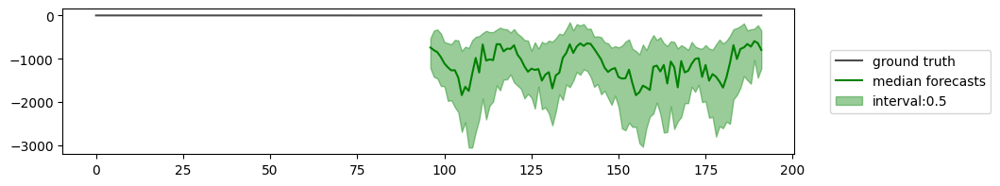

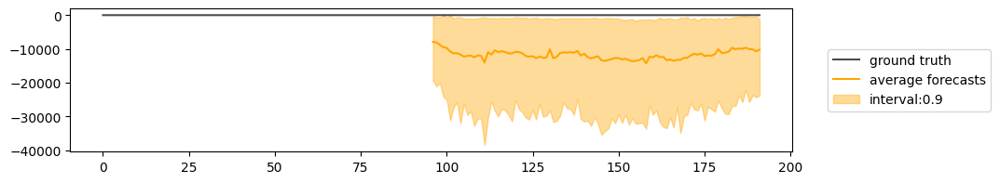

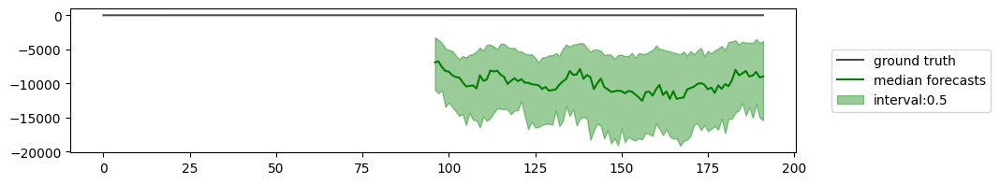

15


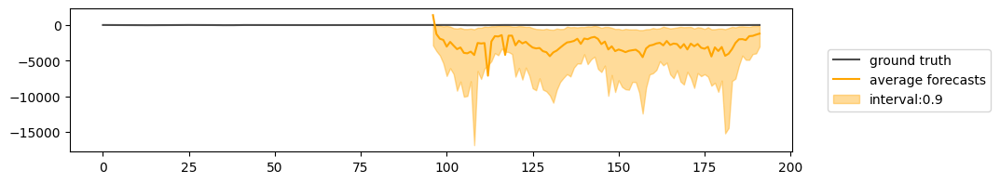

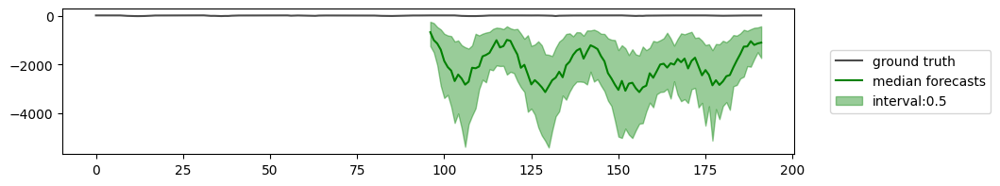

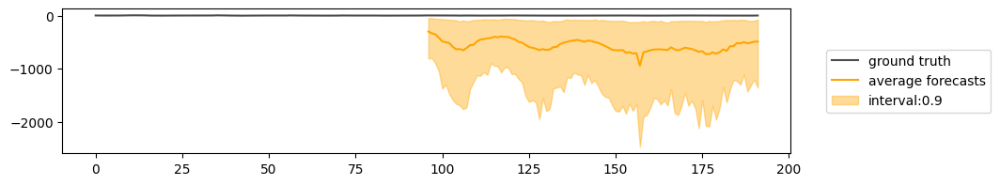

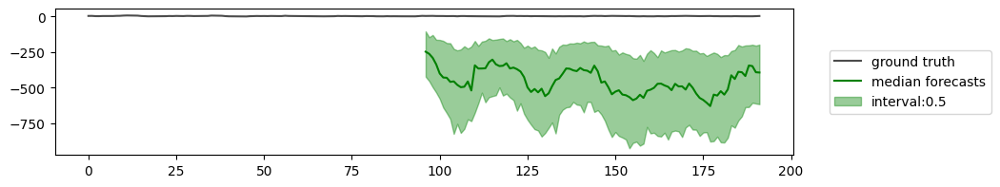

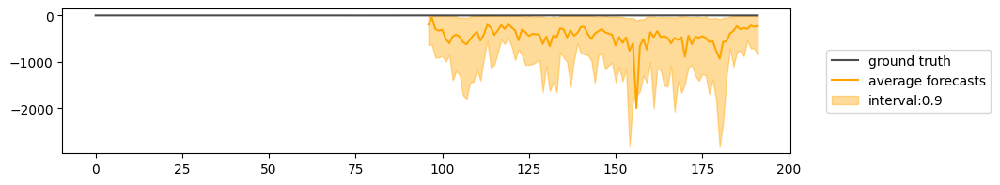

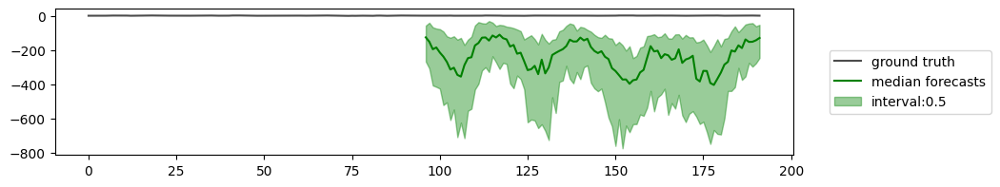

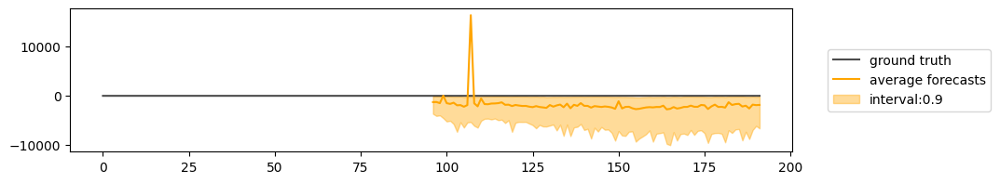

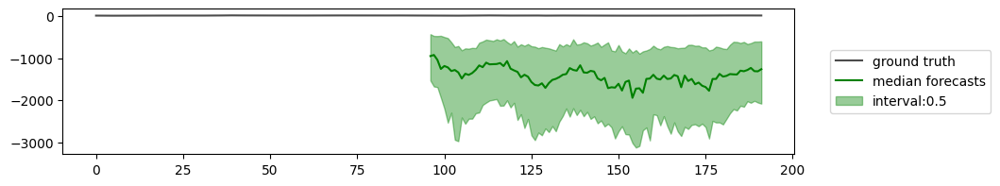

20


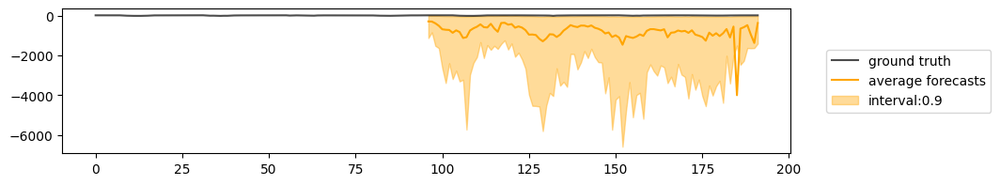

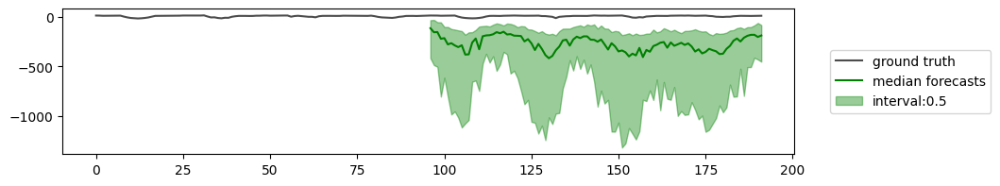

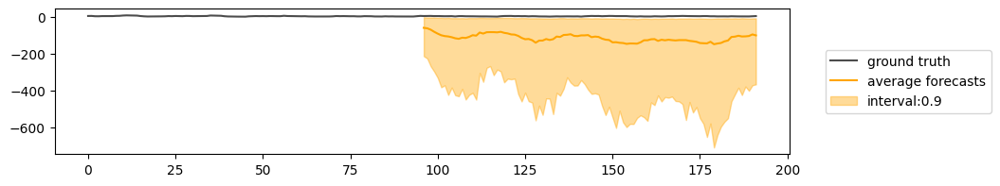

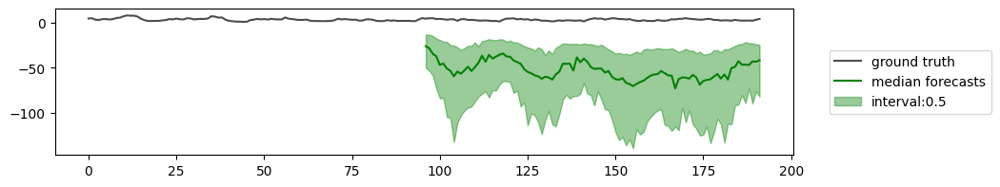

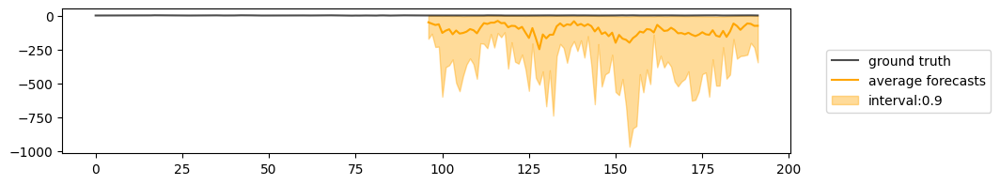

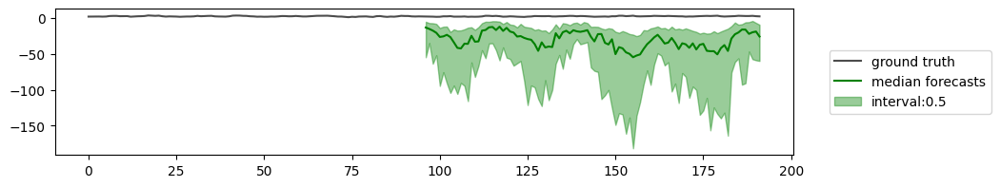

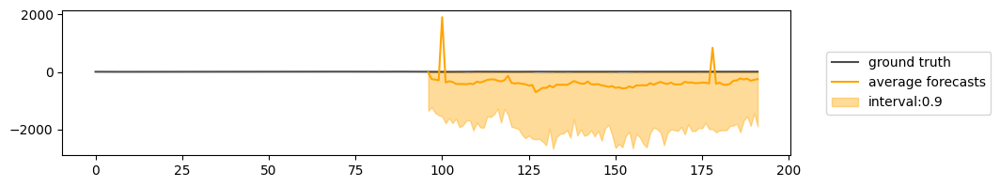

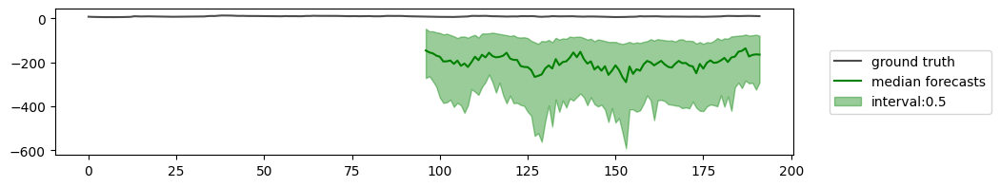

30


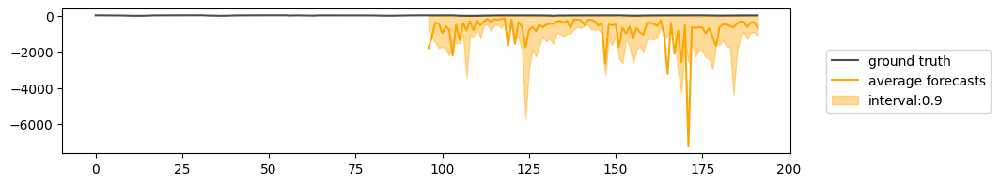

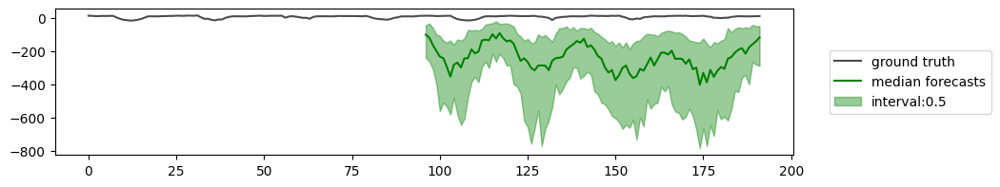

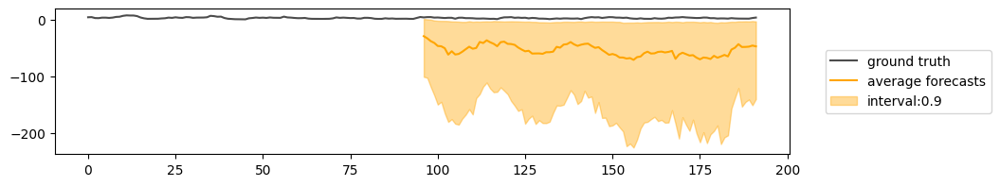

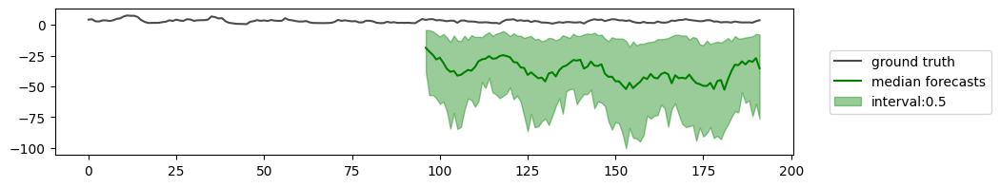

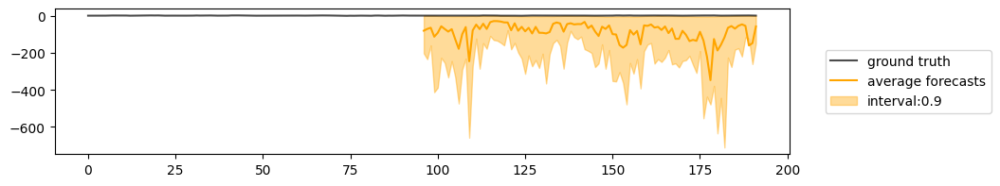

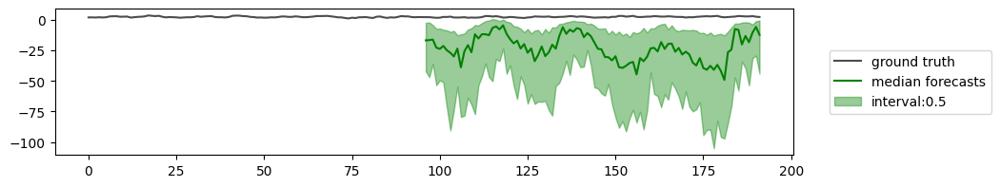

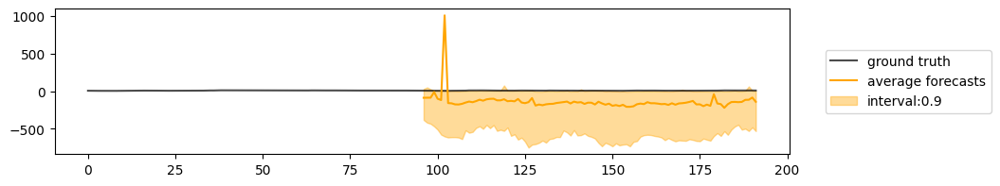

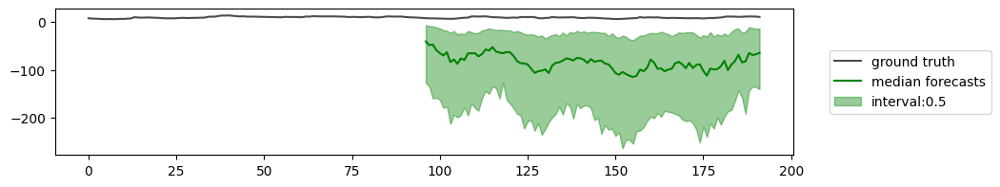

50


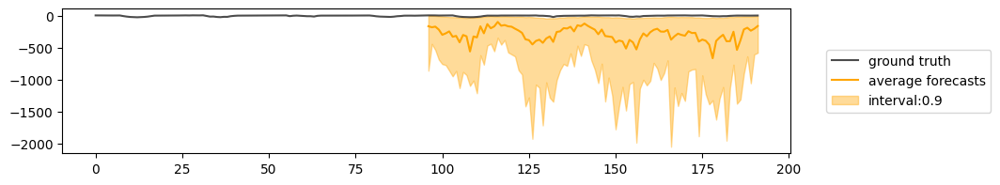

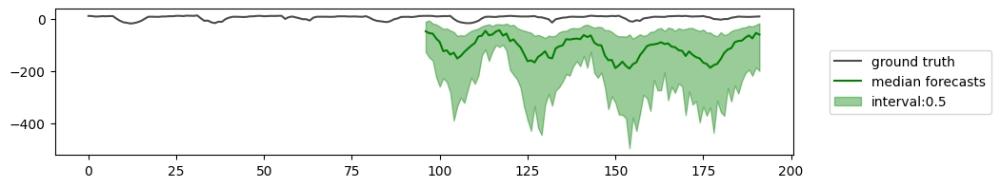

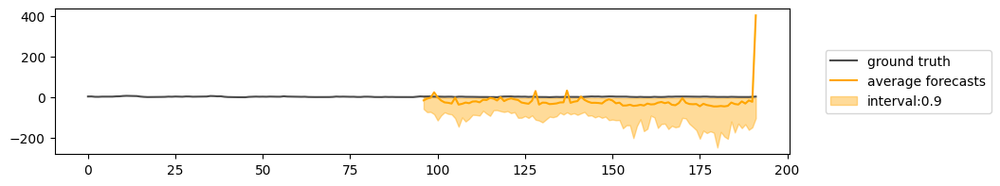

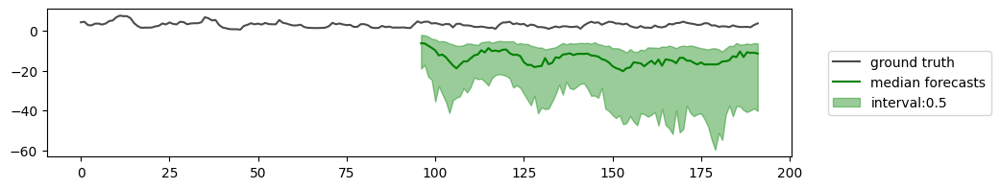

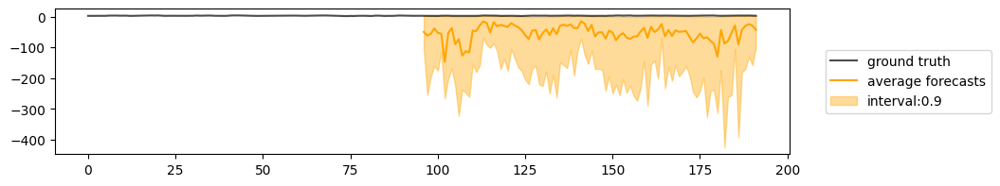

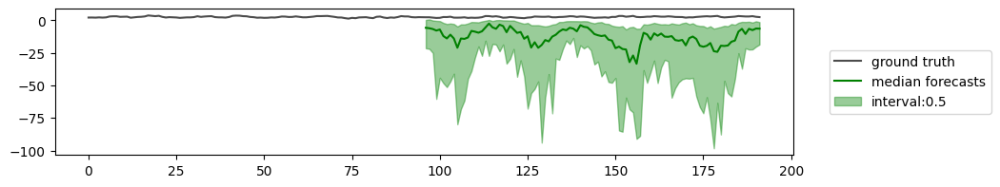

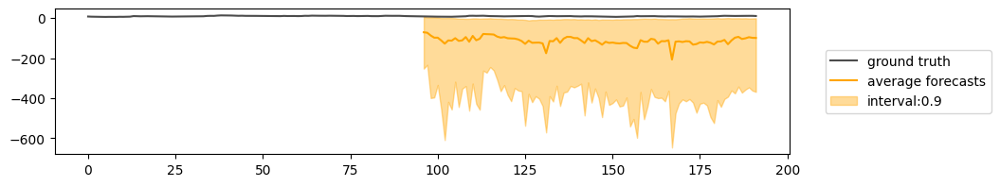

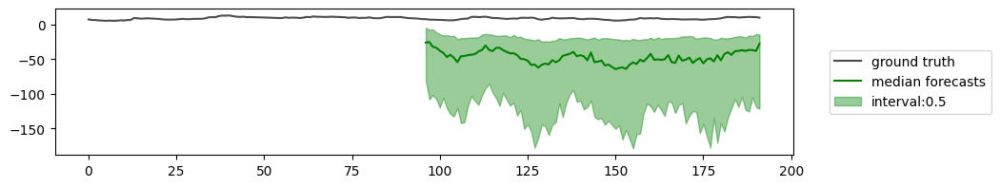

100


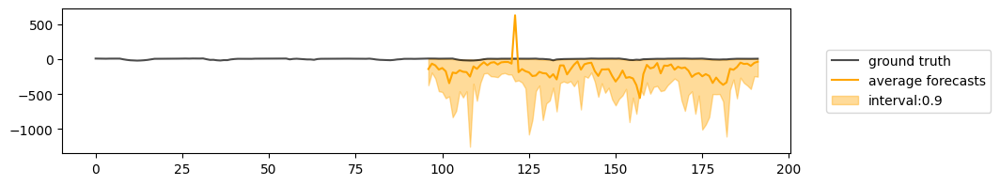

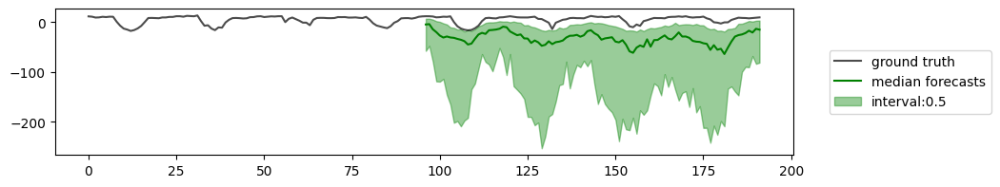

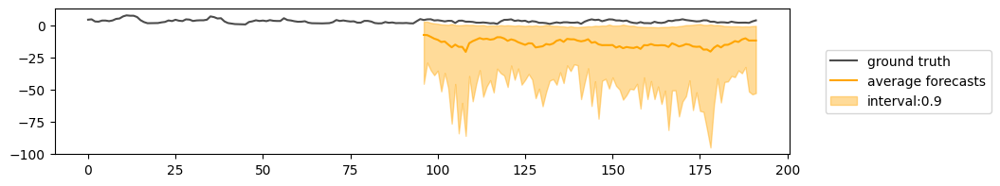

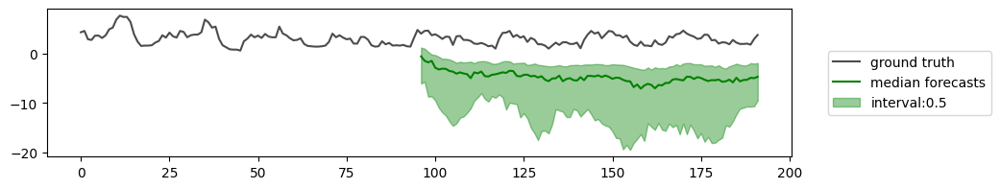

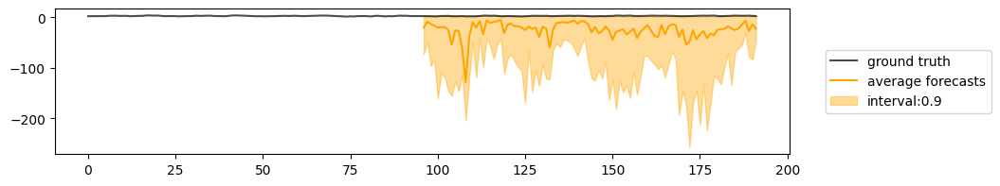

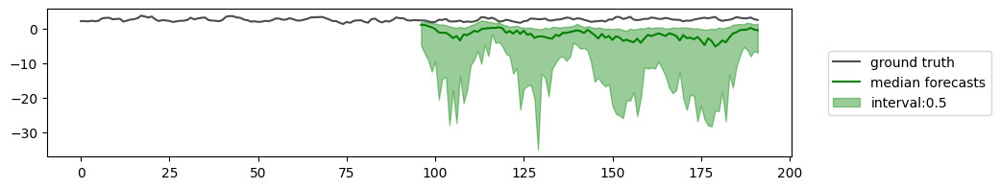

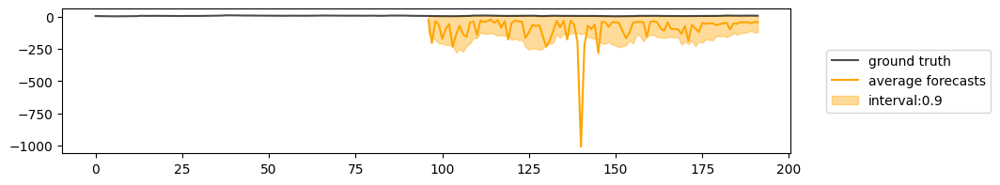

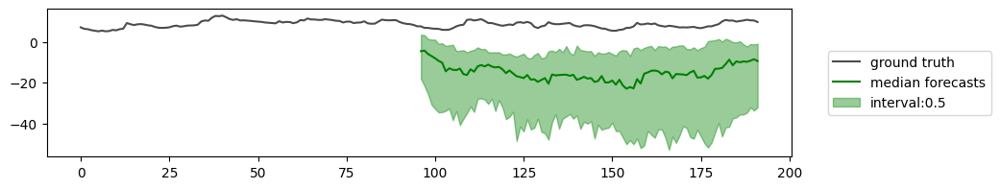

In [81]:
model.forecaster.solver_schedule = 'linear'

for num_steps in steps:
    print(num_steps)
    model.forecaster.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)
    plt.show()

In [82]:
ddim_linear_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=steps)

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:08<00:44,  8.94s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           591.7642822265625
    96_test_CRPS-Sum         750.5492553710938
      96_test_MASE            4879.365234375
       96_test_MSE              31969802.0
     96_test_MSE-Sum            978075200.0
       96_test_ND            745.5320434570312
     96_test_ND-Sum          934.653564453125
      96_test_NRMSE          1203.025146484375
    96_test_NRMSE-Sum       1098.5843505859375
   96_test_weighted_ND       745.5320434570312
 96_test_weighted_ND-Sum     934.653564453125
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [00:19<00:39,  9.97s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           87.8453598022461
    96_test_CRPS-Sum         114.8448257446289
      96_test_MASE            668.84619140625
       96_test_MSE               2391616.5
     96_test_MSE-Sum            49959024.0
       96_test_ND           107.56546020507812
     96_test_ND-Sum           142.59912109375
      96_test_NRMSE          304.495849609375
    96_test_NRMSE-Sum       239.39080810546875
   96_test_weighted_ND      107.56546020507812
 96_test_weighted_ND-Sum      142.59912109375
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [00:32<00:34, 11.38s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          20.337358474731445
    96_test_CRPS-Sum        28.305408477783203
      96_test_MASE           139.9949493408203
       96_test_MSE              995352.9375
     96_test_MSE-Sum            12060194.0
       96_test_ND           23.039033889770508
     96_test_ND-Sum          33.37721252441406
      96_test_NRMSE          162.9476318359375
    96_test_NRMSE-Sum       107.16343688964844
   96_test_weighted_ND      23.039033889770508
 96_test_weighted_ND-Sum     33.37721252441406
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [00:48<00:26, 13.29s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          10.170817375183105
    96_test_CRPS-Sum        13.931073188781738
      96_test_MASE           65.74483489990234
       96_test_MSE               2003324.5
     96_test_MSE-Sum            15801966.0
       96_test_ND           11.388365745544434
     96_test_ND-Sum         16.071434020996094
      96_test_NRMSE         148.73728942871094
    96_test_NRMSE-Sum        83.28662872314453
   96_test_weighted_ND      11.388365745544434
 96_test_weighted_ND-Sum    16.071434020996094
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [01:12<00:16, 16.99s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           4.783688545227051
    96_test_CRPS-Sum        6.8023552894592285
      96_test_MASE          31.098373413085938
       96_test_MSE              1123409.25
     96_test_MSE-Sum             8601352.0
       96_test_ND            5.167496204376221
     96_test_ND-Sum          7.367331027984619
      96_test_NRMSE         132.20016479492188
    96_test_NRMSE-Sum        62.41929244995117
   96_test_weighted_ND       5.167496204376221
 96_test_weighted_ND-Sum     7.367331027984619
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [01:54<00:00, 19.08s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          2.6351094245910645
    96_test_CRPS-Sum         3.925013303756714
      96_test_MASE          16.663002014160156
       96_test_MSE              1101559.375
     96_test_MSE-Sum             8135353.5
       96_test_ND            2.702899932861328
     96_test_ND-Sum         3.5710675716400146
      96_test_NRMSE         119.36143493652344
    96_test_NRMSE-Sum        58.03654098510742
   96_test_weighted_ND       2.702899932861328
 96_test_weighted_ND-Sum    3.5710675716400146
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [83]:
with open("ddim_linear_metrics.pkl", "wb") as fp:
   pickle.dump(ddim_linear_metrics, fp)

### DPM-Solver-1

In [84]:
model.forecaster.solver = 'dpm1'
model.forecaster.solver_schedule = 'linear'

for batch in test_dataloader:
    break

In [85]:
dpm_time = []
for num_steps in tqdm(steps):
    model.forecaster.solver_num_steps = num_steps
    dpm_time.append(time_for_forecast(batch, model, n_repeats=1))
dpm_time

100%|██████████| 6/6 [00:00<00:00,  6.34it/s]


[0.04284811019897461,
 0.0601963996887207,
 0.08600735664367676,
 0.12236690521240234,
 0.20570707321166992,
 0.4156668186187744]

In [86]:
dpm1_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=steps)

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:08<00:44,  8.93s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           591.2420654296875
    96_test_CRPS-Sum         749.1765747070312
      96_test_MASE           4818.89208984375
       96_test_MSE              33655072.0
     96_test_MSE-Sum            996329792.0
       96_test_ND            738.4990844726562
     96_test_ND-Sum          924.5451049804688
      96_test_NRMSE         1228.5841064453125
    96_test_NRMSE-Sum       1106.4803466796875
   96_test_weighted_ND       738.4990844726562
 96_test_weighted_ND-Sum     924.5451049804688
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [00:19<00:40, 10.19s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           90.60582733154297
    96_test_CRPS-Sum        117.16967010498047
      96_test_MASE           705.6168212890625
       96_test_MSE              2096604.625
     96_test_MSE-Sum            51081520.0
       96_test_ND            111.5728530883789
     96_test_ND-Sum          146.3567657470703
      96_test_NRMSE          300.1641540527344
    96_test_NRMSE-Sum       246.58880615234375
   96_test_weighted_ND       111.5728530883789
 96_test_weighted_ND-Sum     146.3567657470703
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [00:32<00:33, 11.28s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           21.43406105041504
    96_test_CRPS-Sum         29.18144416809082
      96_test_MASE          147.17115783691406
       96_test_MSE              855695.6875
     96_test_MSE-Sum            10448649.0
       96_test_ND           23.968385696411133
     96_test_ND-Sum          33.61433029174805
      96_test_NRMSE         166.29856872558594
    96_test_NRMSE-Sum        104.5118179321289
   96_test_weighted_ND      23.968385696411133
 96_test_weighted_ND-Sum     33.61433029174805
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [00:48<00:26, 13.23s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          10.580849647521973
    96_test_CRPS-Sum        14.840993881225586
      96_test_MASE           68.18130493164062
       96_test_MSE              763826.875
     96_test_MSE-Sum             6805179.0
       96_test_ND           11.863836288452148
     96_test_ND-Sum         17.256046295166016
      96_test_NRMSE         125.04801940917969
    96_test_NRMSE-Sum        71.09196472167969
   96_test_weighted_ND      11.863836288452148
 96_test_weighted_ND-Sum    17.256046295166016
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [01:12<00:16, 16.94s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           4.902765274047852
    96_test_CRPS-Sum         6.836730480194092
      96_test_MASE          31.182592391967773
       96_test_MSE              882950.125
     96_test_MSE-Sum             6995862.0
       96_test_ND            5.137853622436523
     96_test_ND-Sum          7.042487621307373
      96_test_NRMSE         120.26348876953125
    96_test_NRMSE-Sum       61.318477630615234
   96_test_weighted_ND       5.137853622436523
 96_test_weighted_ND-Sum     7.042487621307373
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [01:54<00:00, 19.04s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          2.5611257553100586
    96_test_CRPS-Sum         3.561518430709839
      96_test_MASE          17.032756805419922
       96_test_MSE             364143.28125
     96_test_MSE-Sum             2784029.0
       96_test_ND            2.831850528717041
     96_test_ND-Sum         3.7706258296966553
      96_test_NRMSE          90.24050903320312
    96_test_NRMSE-Sum        41.42795181274414
   96_test_weighted_ND       2.831850528717041
 96_test_weighted_ND-Sum    3.7706258296966553
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [87]:
with open("dpm1_metrics.pkl", "wb") as fp:
   pickle.dump(dpm1_metrics, fp)

10


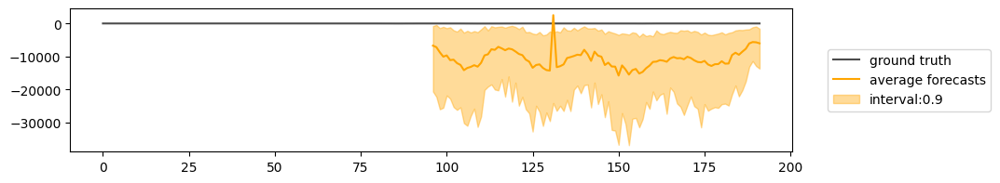

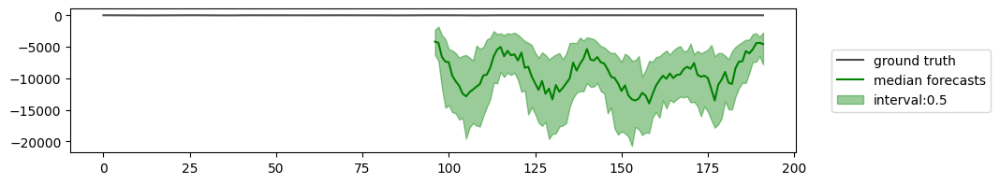

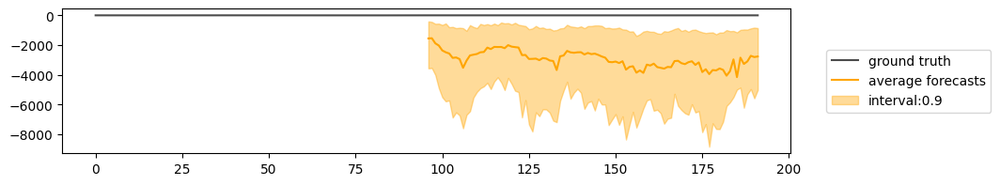

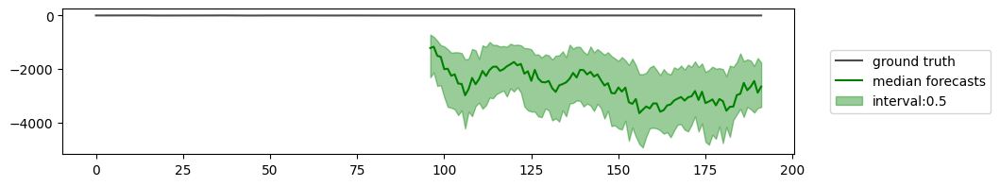

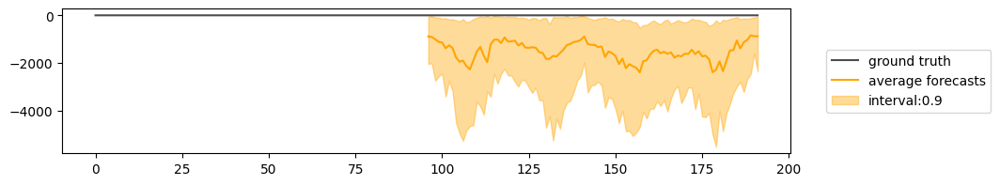

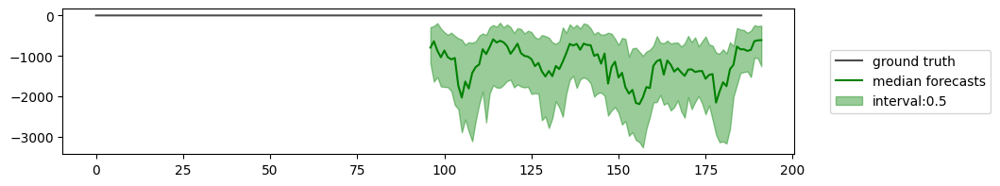

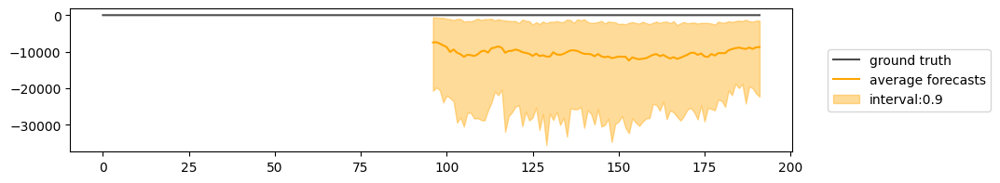

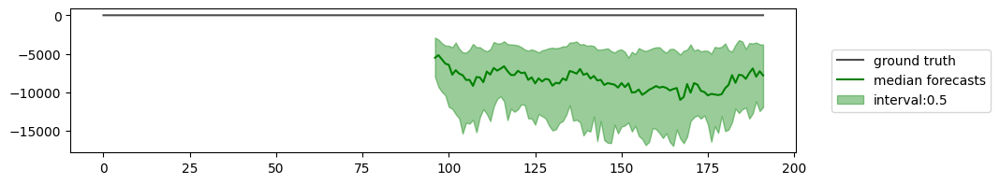

15


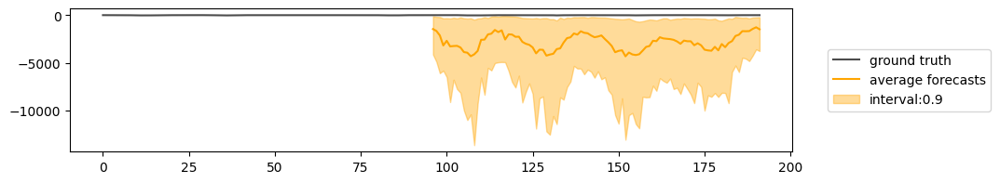

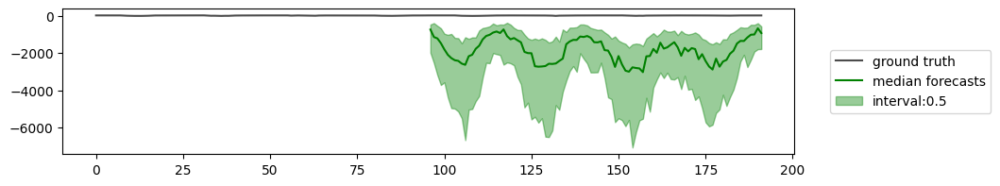

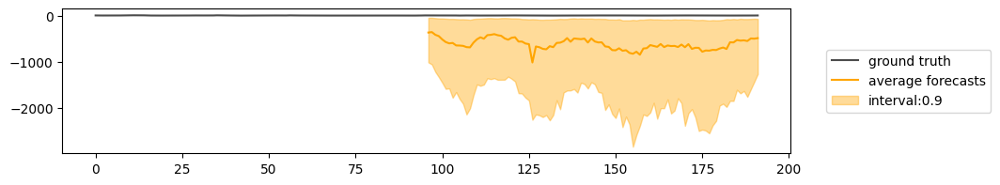

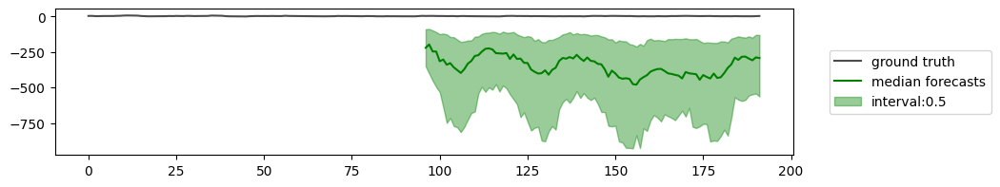

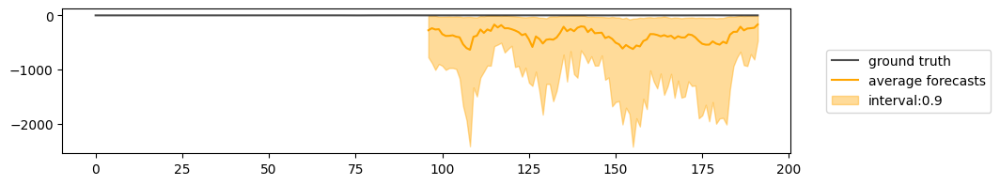

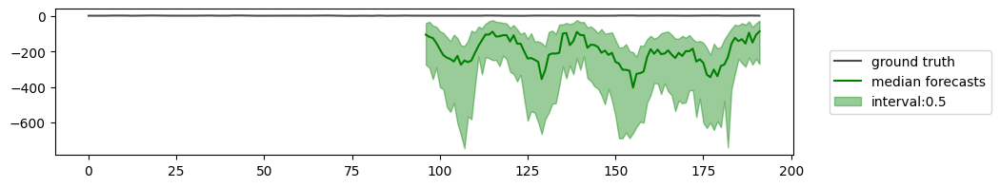

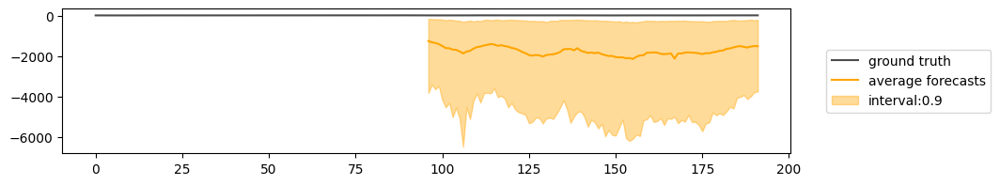

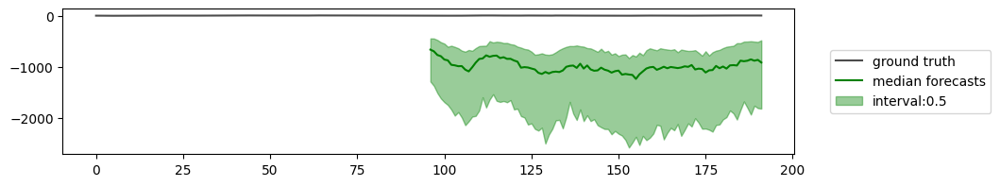

20


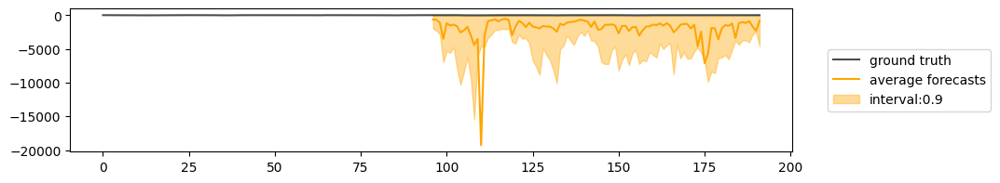

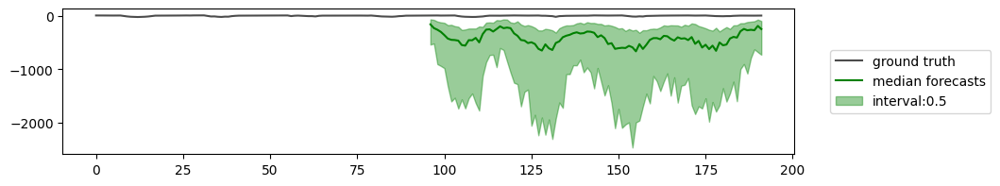

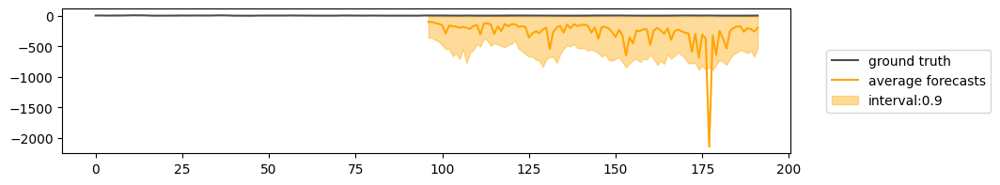

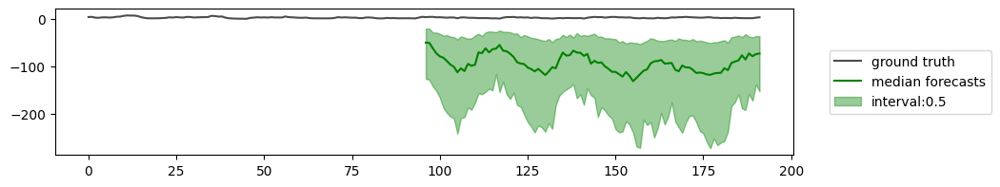

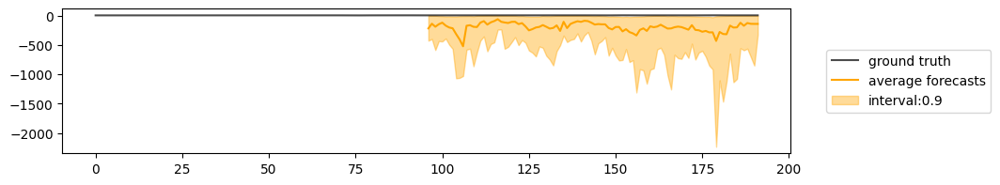

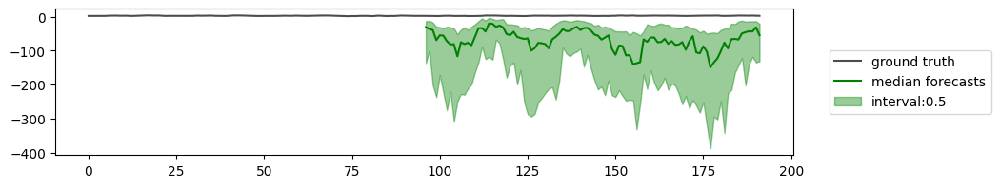

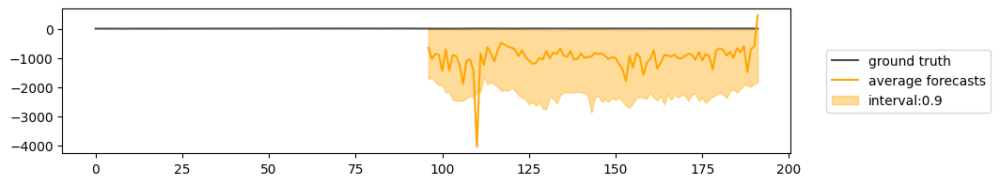

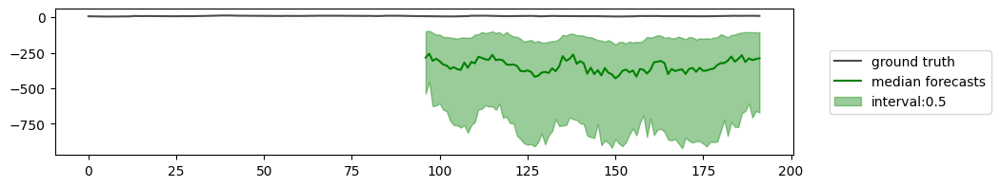

30


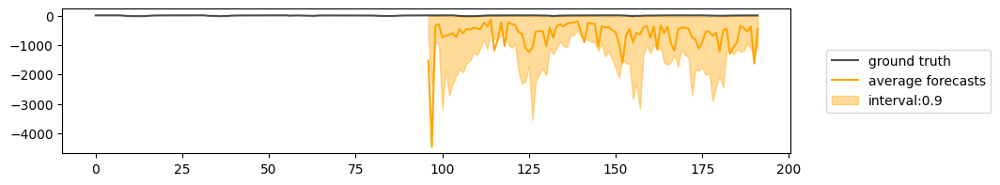

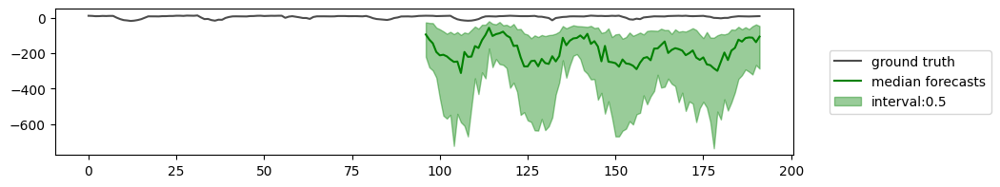

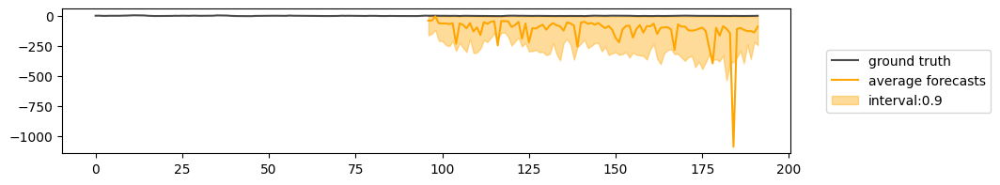

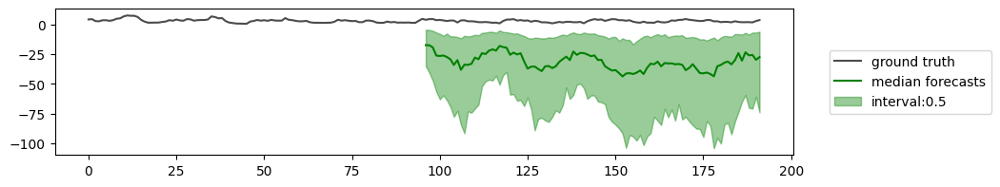

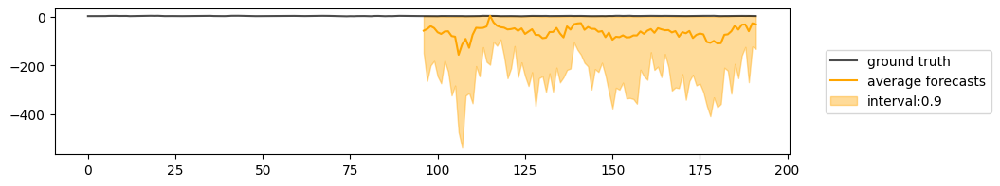

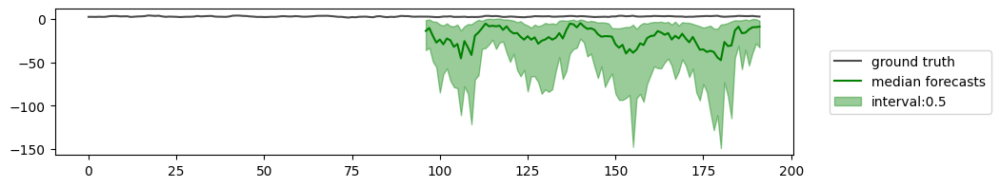

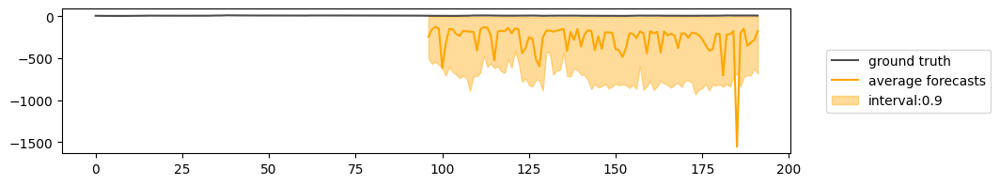

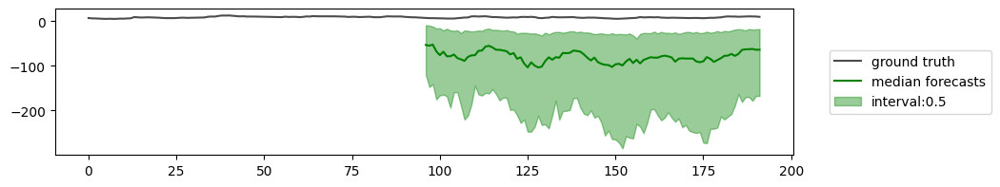

50


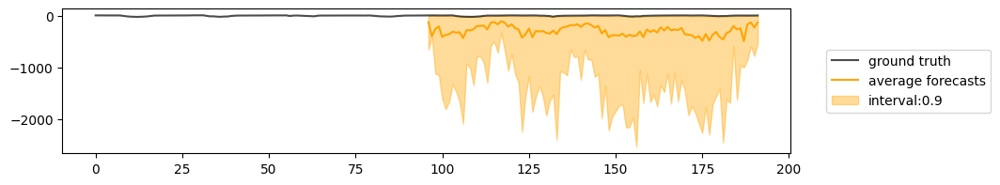

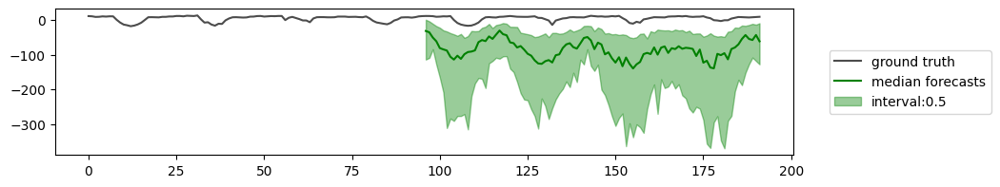

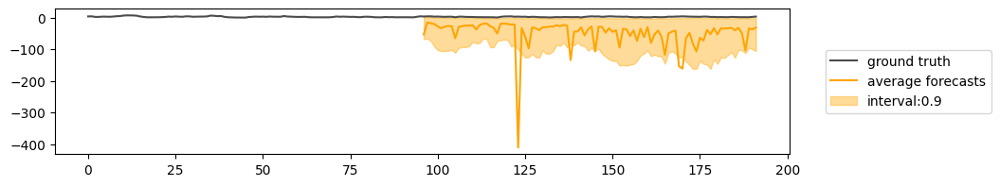

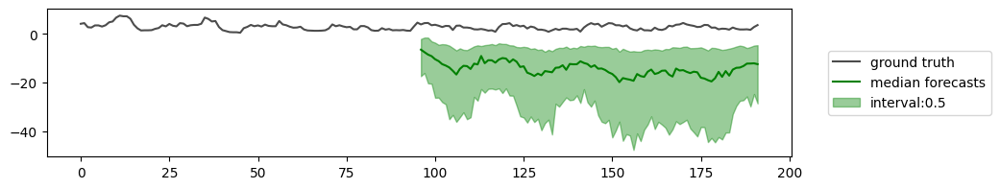

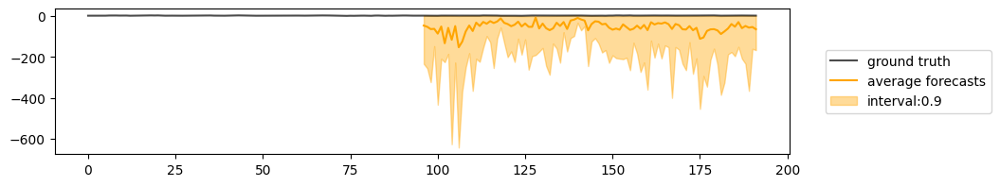

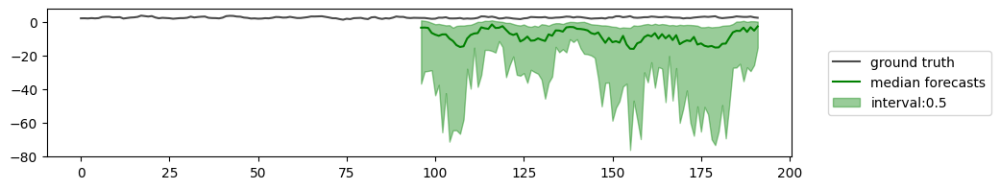

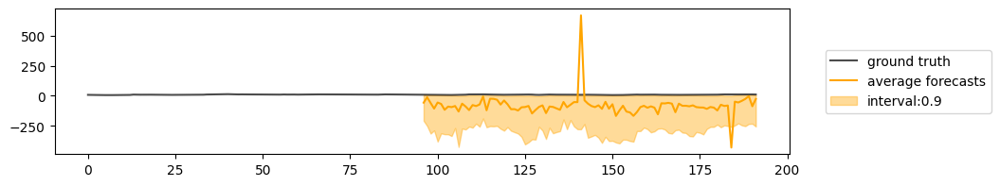

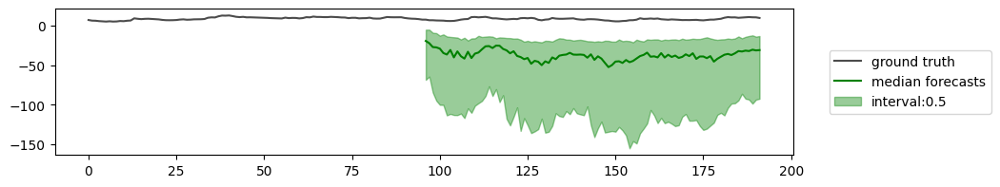

100


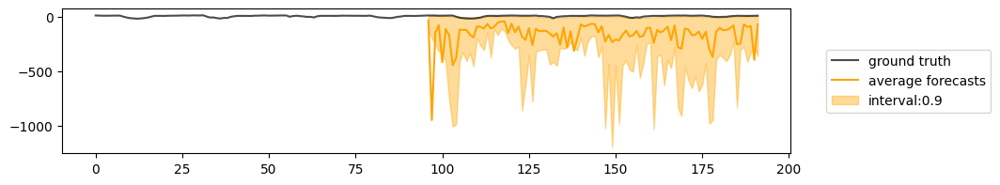

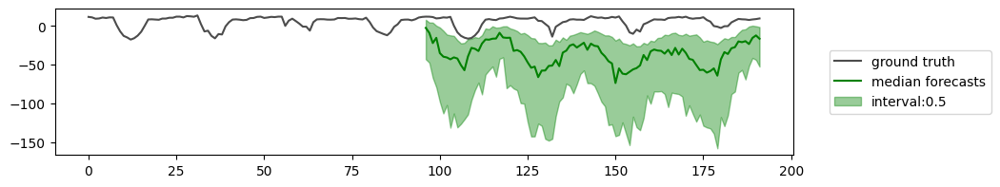

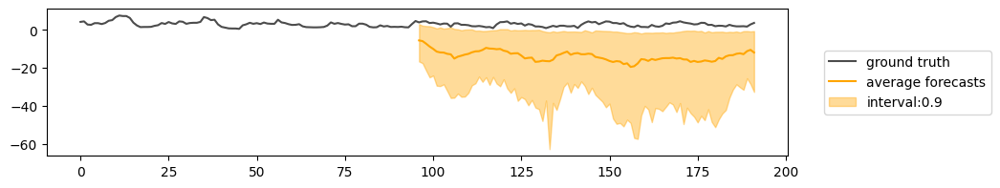

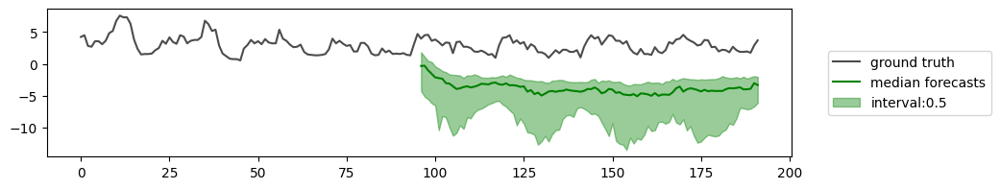

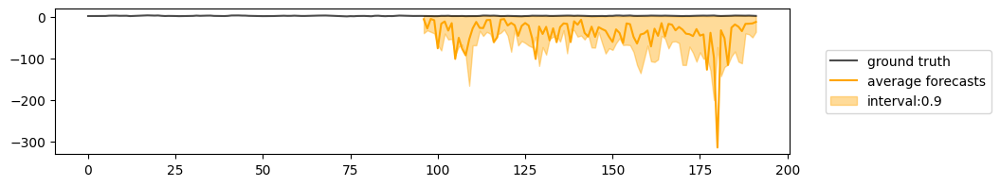

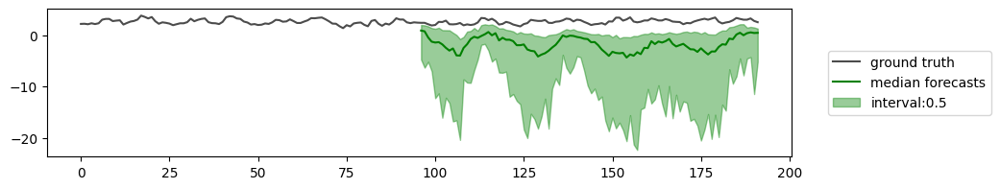

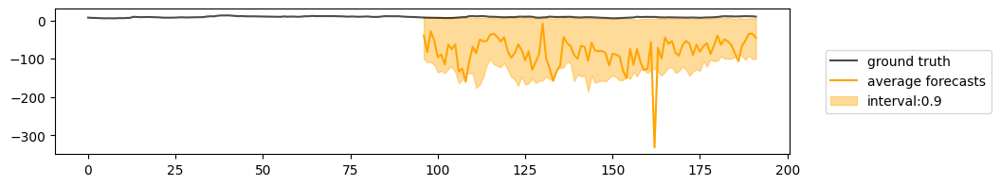

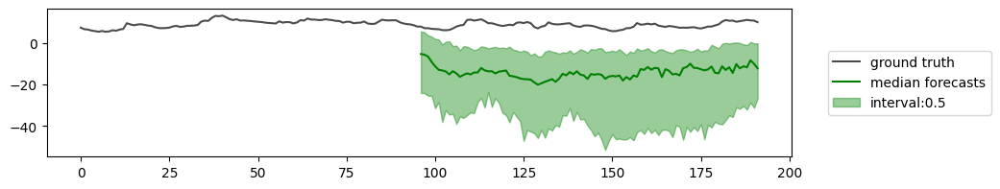

In [89]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)
    plt.show()

### DPM-Solver-2

In [90]:
model.forecaster.solver = 'dpm2'
model.forecaster.solver_schedule = 'linear'
model.scaler = data_manager.scaler
model.forecaster.solver_num_steps = 15

steps = [10, 15, 20, 30, 50, 100]
for batch in test_dataloader:
    break

In [91]:
dpm_time = []
for num_steps in tqdm(steps):
    model.forecaster.solver_num_steps = num_steps
    dpm_time.append(time_for_forecast(batch, model, n_repeats=1))
dpm_time

100%|██████████| 6/6 [00:01<00:00,  3.15it/s]


[0.08178138732910156,
 0.12253761291503906,
 0.16552209854125977,
 0.25088953971862793,
 0.42184901237487793,
 0.8485276699066162]

In [92]:
dpm2_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=steps)

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:12<01:04, 12.86s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.7456781268119812
    96_test_CRPS-Sum         1.663459300994873
      96_test_MASE           5.327722549438477
       96_test_MSE              970696.0625
     96_test_MSE-Sum             6746619.5
       96_test_ND           0.6693060994148254
     96_test_ND-Sum         0.6470677852630615
      96_test_NRMSE         158.62998962402344
    96_test_NRMSE-Sum        69.3590087890625
   96_test_weighted_ND      0.6693060994148254
 96_test_weighted_ND-Sum    0.6470677852630615
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [00:28<00:58, 14.74s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.48436641693115234
    96_test_CRPS-Sum        0.5920892357826233
      96_test_MASE           3.361689329147339
       96_test_MSE              744691.625
     96_test_MSE-Sum             5167098.0
       96_test_ND           0.5724745392799377
     96_test_ND-Sum         0.5255869626998901
      96_test_NRMSE          85.09481048583984
    96_test_NRMSE-Sum       37.556182861328125
   96_test_weighted_ND      0.5724745392799377
 96_test_weighted_ND-Sum    0.5255869626998901
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [00:48<00:50, 16.98s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          1.8199361562728882
    96_test_CRPS-Sum         4.825456142425537
      96_test_MASE           6.71204948425293
       96_test_MSE               795660.0
     96_test_MSE-Sum             7046883.0
       96_test_ND           1.1817351579666138
     96_test_ND-Sum         1.7174432277679443
      96_test_NRMSE         156.86524963378906
    96_test_NRMSE-Sum        77.18887329101562
   96_test_weighted_ND      1.1817351579666138
 96_test_weighted_ND-Sum    1.7174432277679443
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [01:15<00:41, 20.95s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.9690905213356018
    96_test_CRPS-Sum        1.1866271495819092
      96_test_MASE           7.627874851226807
       96_test_MSE            16586.099609375
     96_test_MSE-Sum          115499.5859375
       96_test_ND           1.1684730052947998
     96_test_ND-Sum         1.3512051105499268
      96_test_NRMSE         15.844359397888184
    96_test_NRMSE-Sum       7.7783732414245605
   96_test_weighted_ND      1.1684730052947998
 96_test_weighted_ND-Sum    1.3512051105499268
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [01:57<00:28, 28.49s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          1.3377145528793335
    96_test_CRPS-Sum        1.6064776182174683
      96_test_MASE          11.174837112426758
       96_test_MSE             187114.78125
     96_test_MSE-Sum            1306816.625
       96_test_ND           1.5974968671798706
     96_test_ND-Sum         1.8375427722930908
      96_test_NRMSE         30.501094818115234
    96_test_NRMSE-Sum       14.199152946472168
   96_test_weighted_ND      1.5974968671798706
 96_test_weighted_ND-Sum    1.8375427722930908
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [03:17<00:00, 32.96s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          2.8664605617523193
    96_test_CRPS-Sum        3.3687236309051514
      96_test_MASE          25.056324005126953
       96_test_MSE             4682.80078125
     96_test_MSE-Sum           43150.5390625
       96_test_ND            3.321397304534912
     96_test_ND-Sum          3.841156244277954
      96_test_NRMSE          9.28225040435791
    96_test_NRMSE-Sum        5.595911979675293
   96_test_weighted_ND       3.321397304534912
 96_test_weighted_ND-Sum     3.841156244277954
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [93]:
import pickle
with open("dpm2_metrics.pkl", "wb") as fp:
   pickle.dump(dpm2_metrics, fp)

10


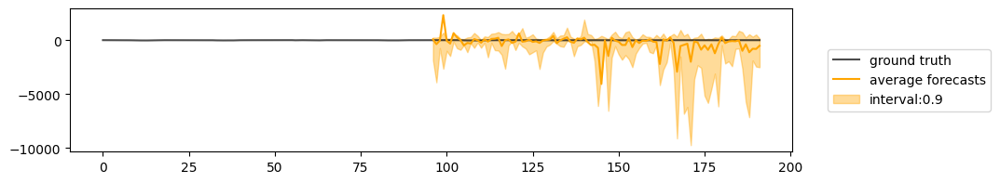

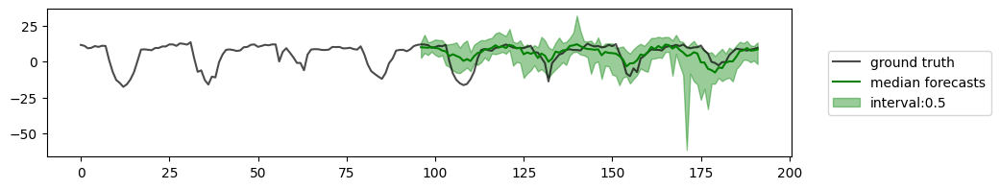

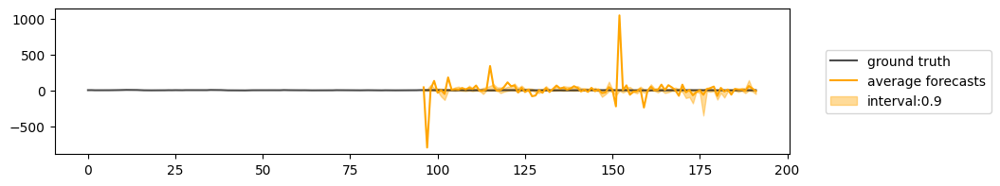

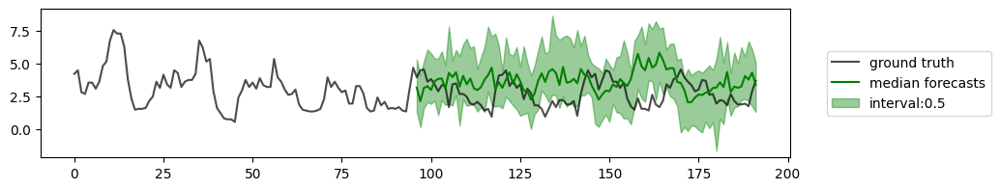

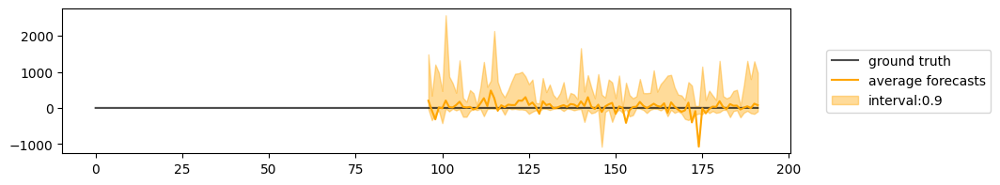

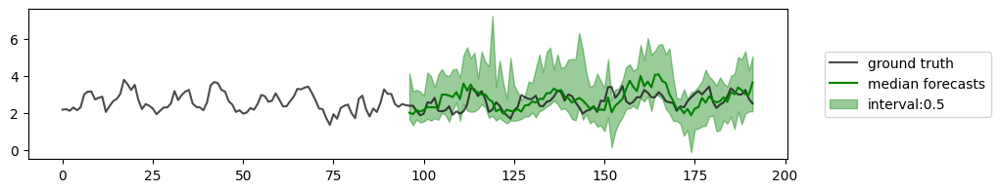

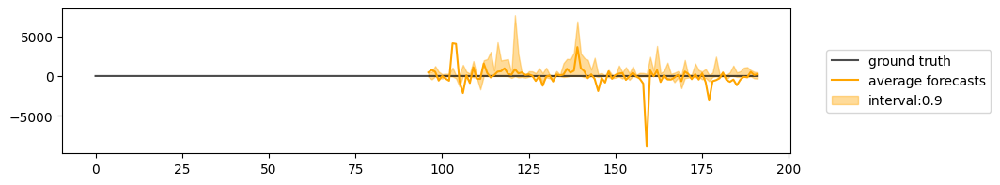

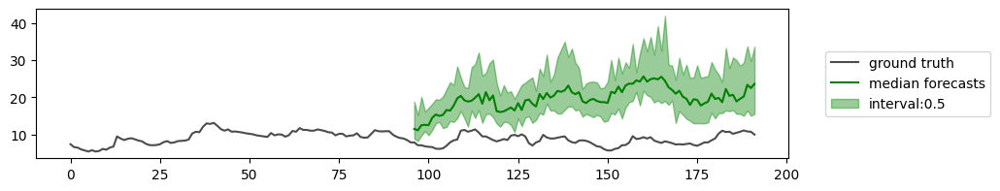

15


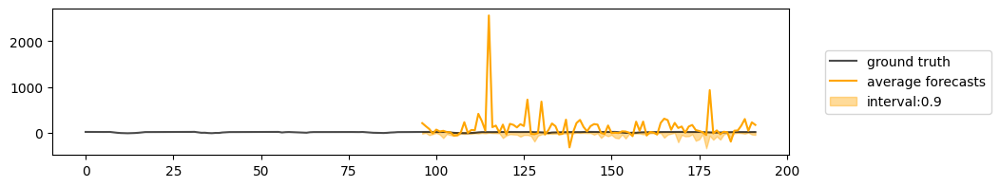

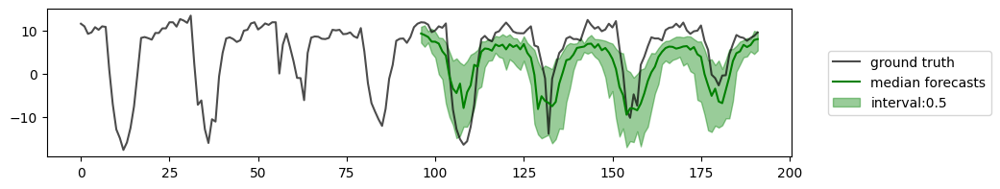

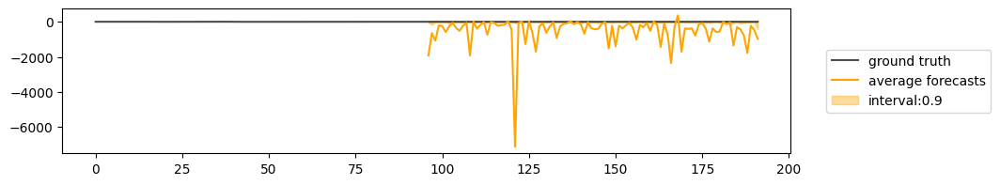

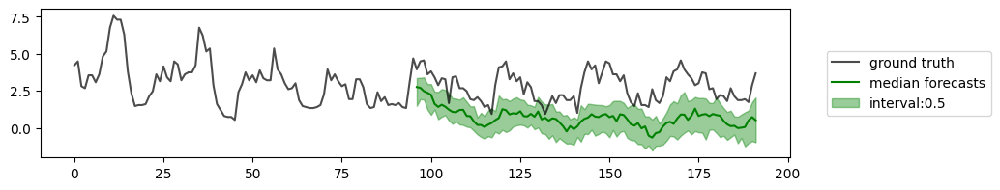

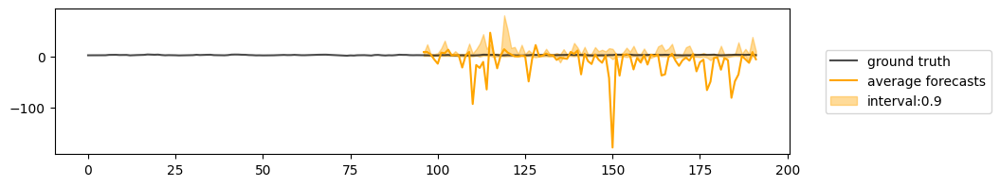

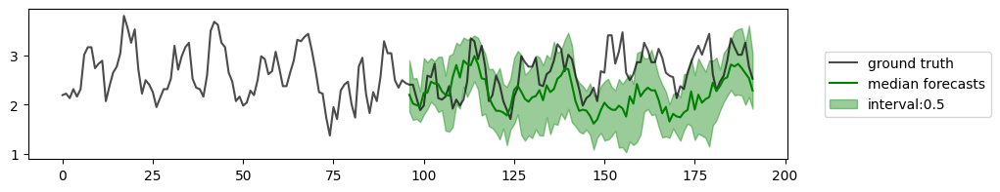

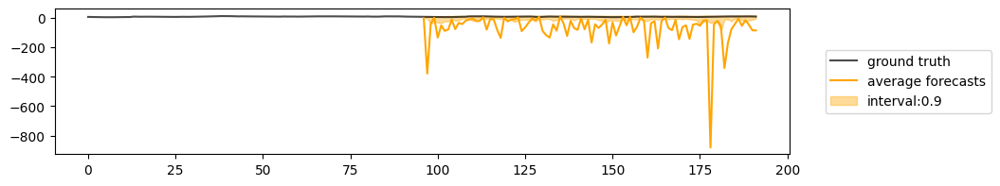

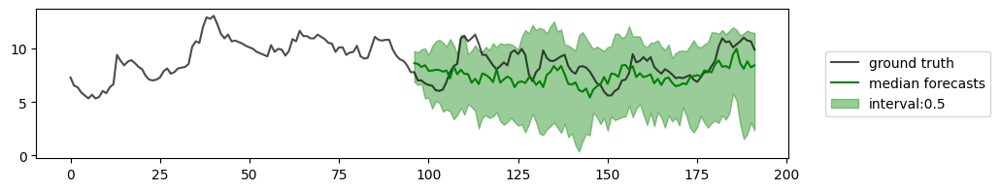

20


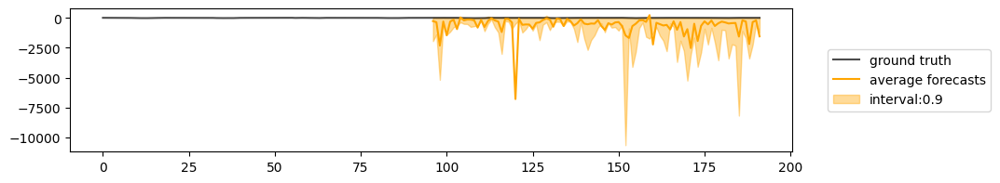

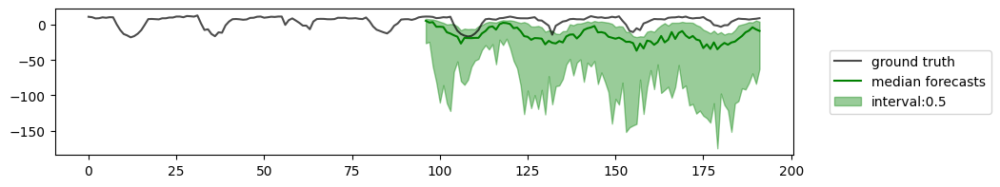

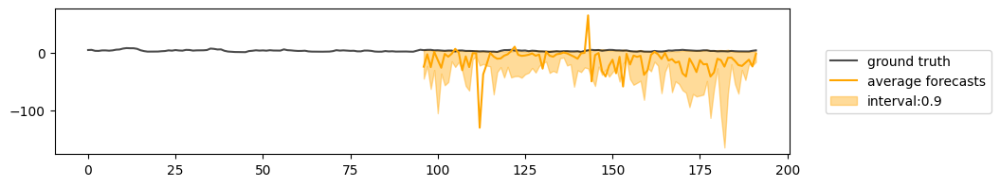

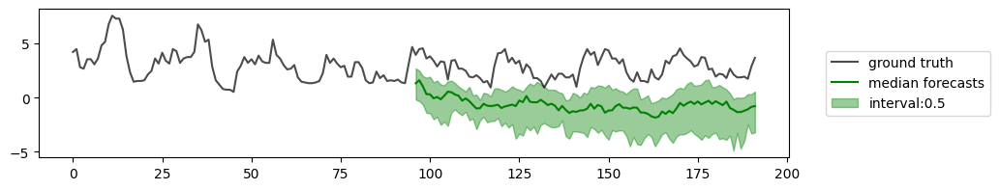

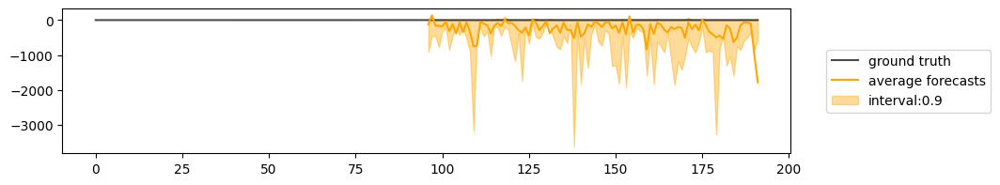

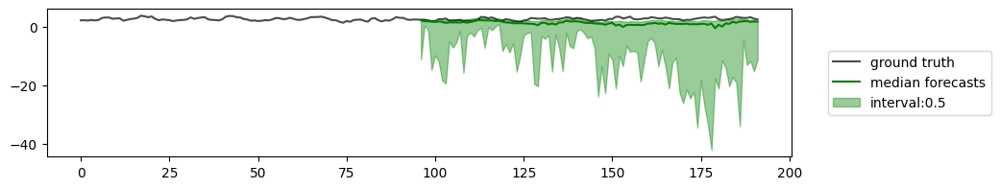

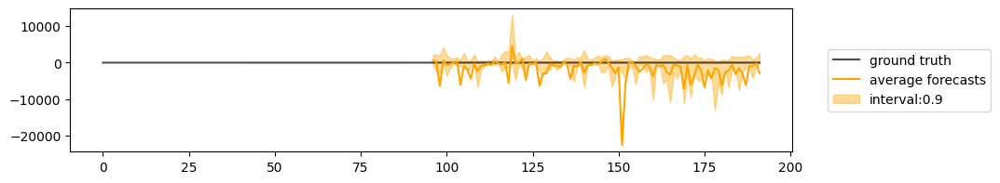

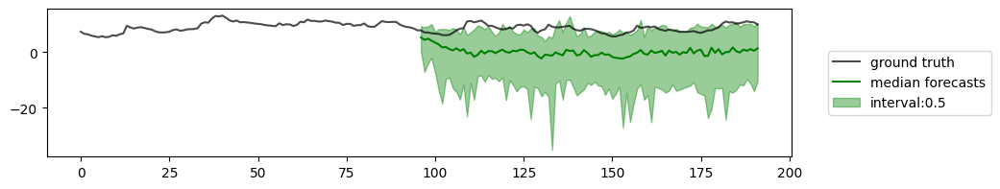

30


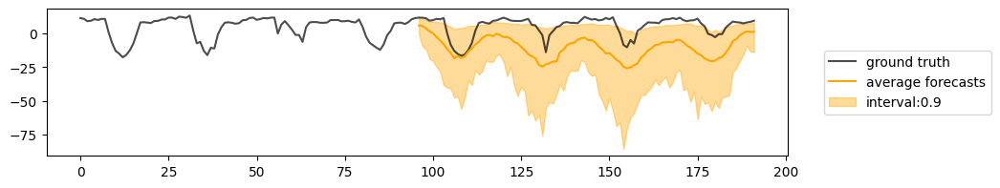

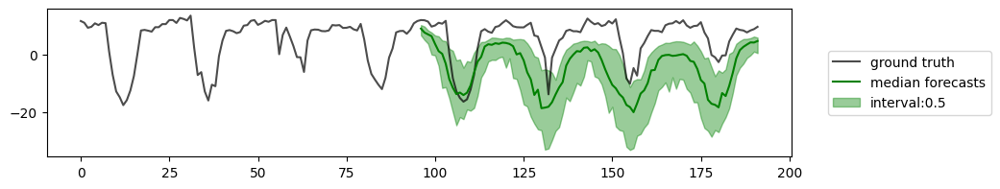

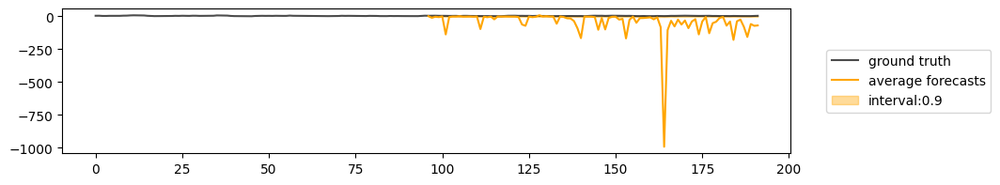

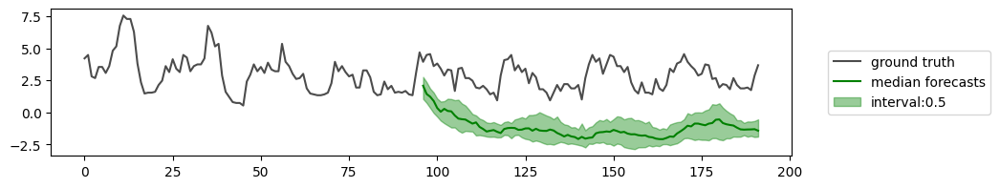

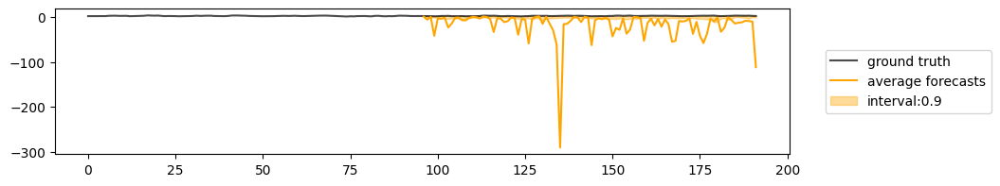

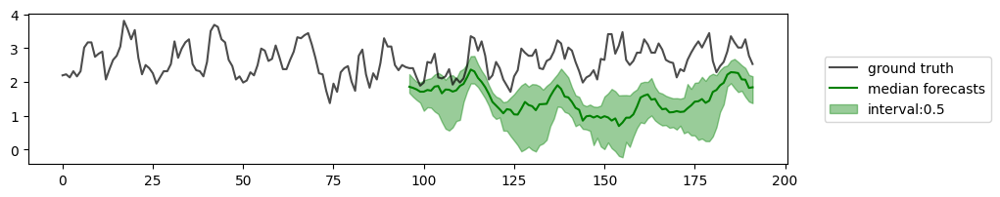

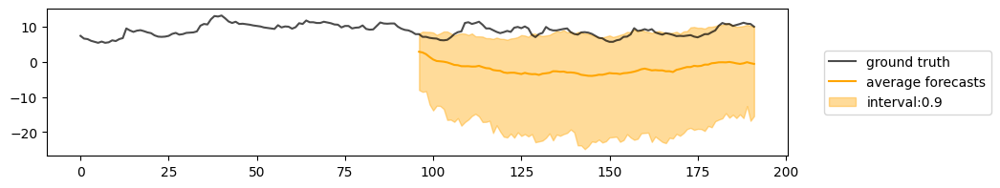

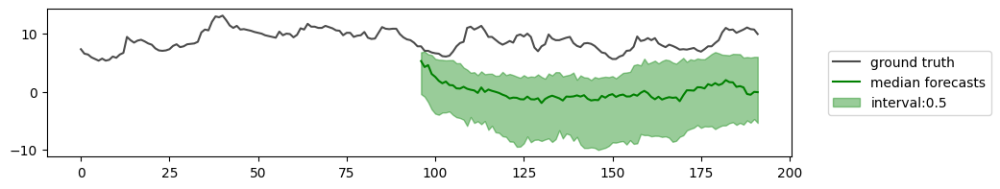

50


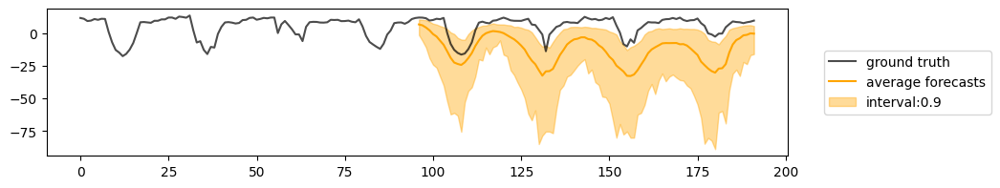

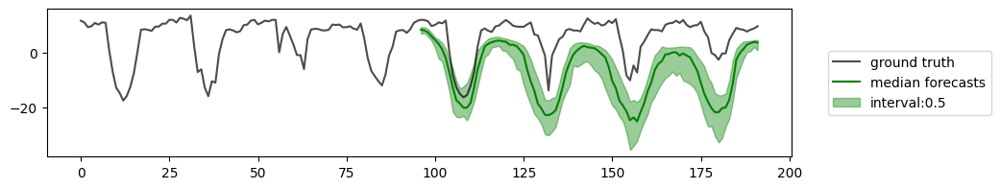

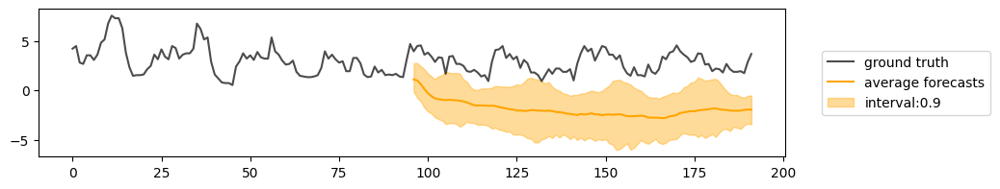

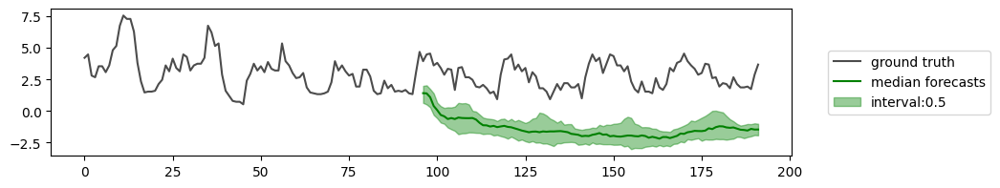

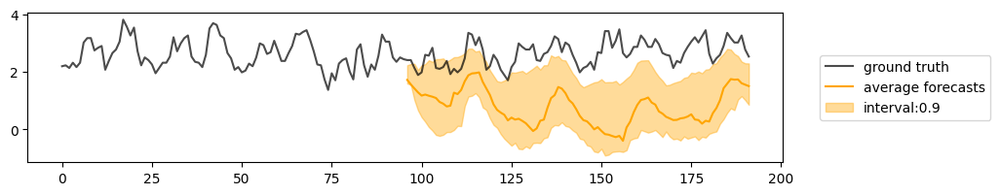

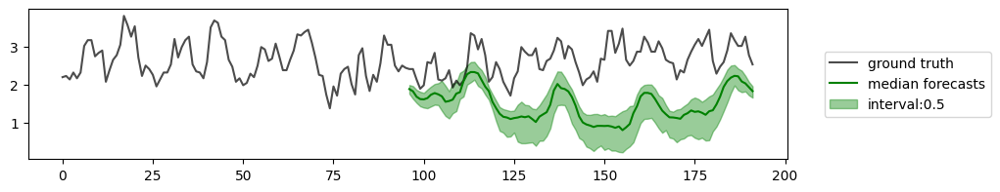

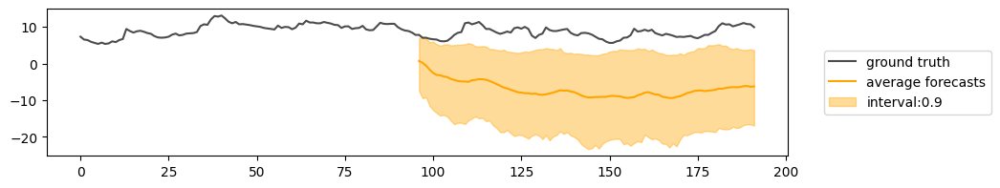

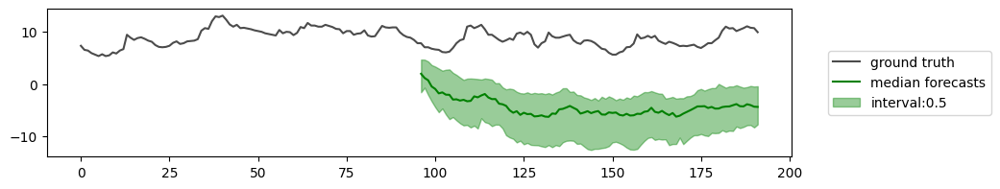

100


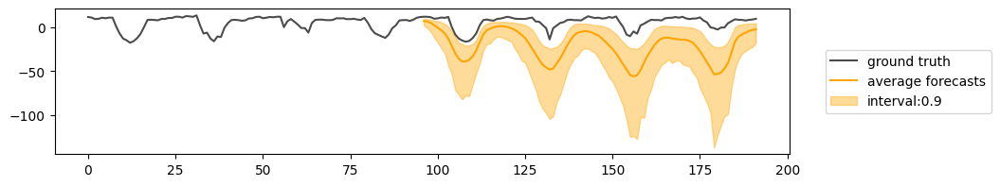

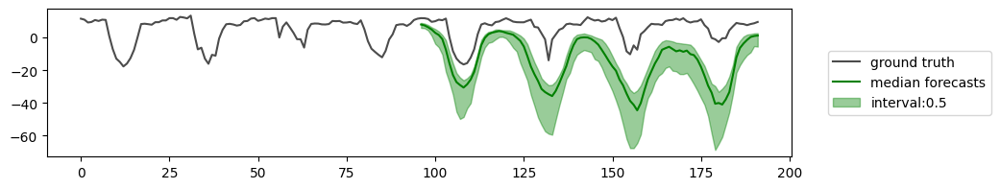

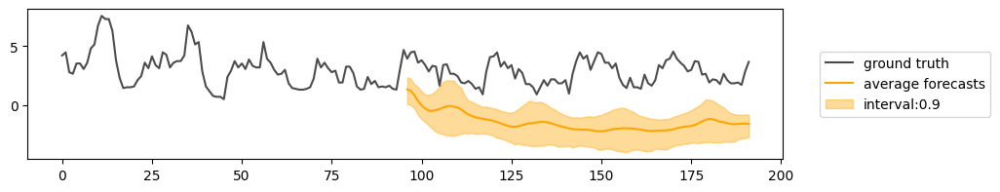

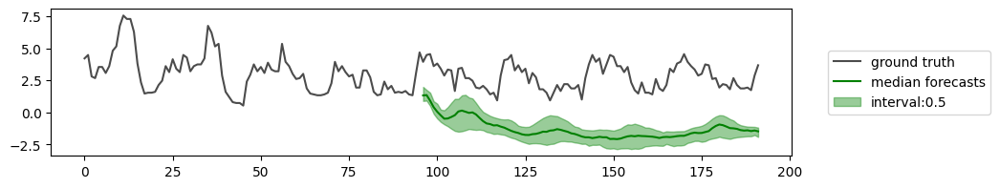

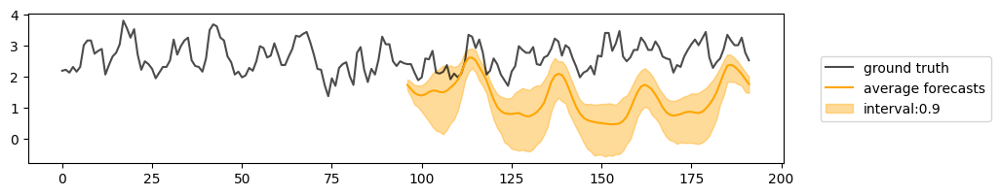

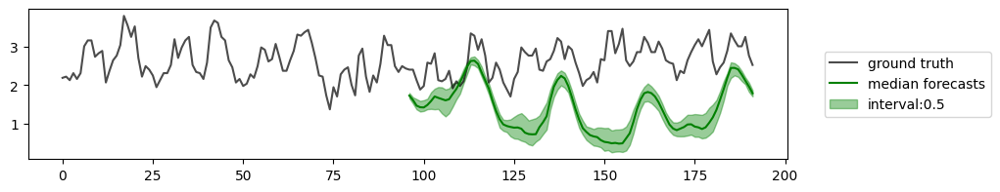

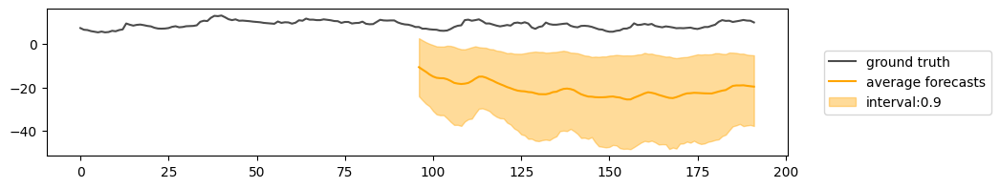

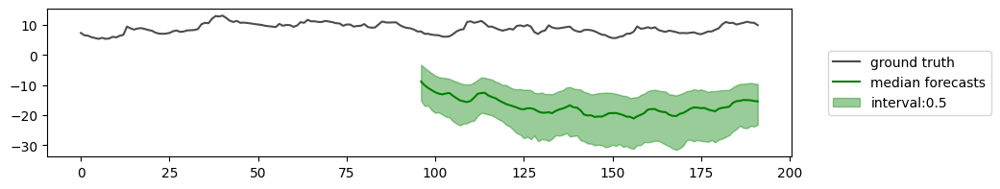

In [94]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)
    plt.show()

### Plot results

In [103]:
import pickle
import os

metrics = {}
samplers_name = ['DDIM, linear', 'DDIM, quad', 'DPM-Solver-1', 'DPM-Solver-2', 'Euler', 'Heun']
for i, file in enumerate(sorted(os.listdir("samplers_res/"))):
    with open(f"samplers_res/{file}", "rb") as fp:
        metrics[samplers_name[i]] = pickle.load(fp)

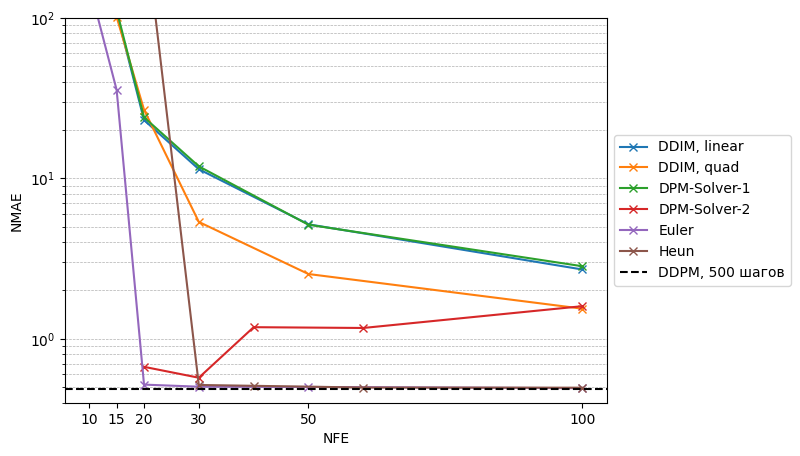

In [107]:
import matplotlib.pyplot as plt
import numpy as np

nfe = [10, 15, 20, 30, 50, 100]
nfe_2_ord = [2 * x for x in nfe][:-1]
plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    nmae = [run['96_test_ND'] for run in runs]
    if sampler in ['Heun', 'DPM-Solver-2']:
        plt.plot(nfe_2_ord, nmae[:-1], marker='x', linestyle='-', label=sampler)
    else:
        plt.plot(nfe, nmae, marker='x', linestyle='-', label=sampler)
    
plt.axhline(y=0.4880618155002594 , linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('NFE')
plt.xticks(nfe)
plt.ylabel('NMAE')
# plt.yticks(np.arange(0.1, 0.31, 0.05))
plt.ylim(0.4, 100)
plt.yscale('log')
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')
# plt.grid(True, which='minor', ls="--", linewidth=0.5)

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

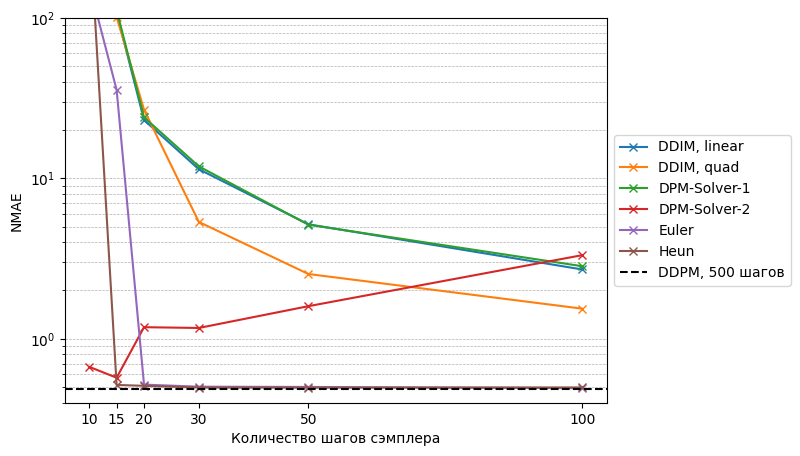

In [108]:
solver_steps = [10, 15, 20, 30, 50, 100]

plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    nmae = [run['96_test_ND'] for run in runs]
    plt.plot(solver_steps, nmae, marker='x', linestyle='-', label=sampler)
    
plt.axhline(y=0.4880618155002594 , linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('Количество шагов сэмплера')
plt.xticks(nfe)
plt.ylabel('NMAE')
plt.ylim(0.4, 100)
plt.yscale('log')
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

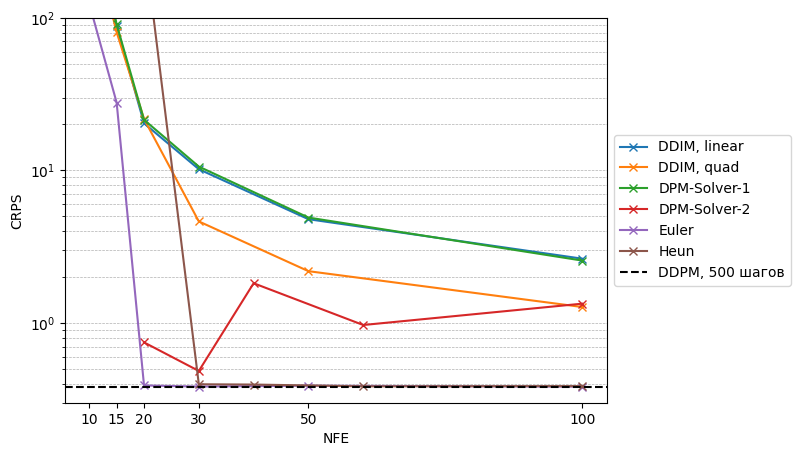

In [110]:
import matplotlib.pyplot as plt
import numpy as np

nfe = [10, 15, 20, 30, 50, 100]
plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    crps = [run['96_test_CRPS'] for run in runs]
    if sampler in ['Heun', 'DPM-Solver-2']:
        plt.plot(nfe_2_ord, crps[:-1], marker='x', linestyle='-', label=sampler)
    else:
        plt.plot(nfe, crps, marker='x', linestyle='-', label=sampler)

plt.axhline(y=0.3804873824119568, linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('NFE')
plt.xticks(nfe)
plt.ylabel('CRPS')
plt.ylim(0.3, 100)
plt.yscale('log')
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

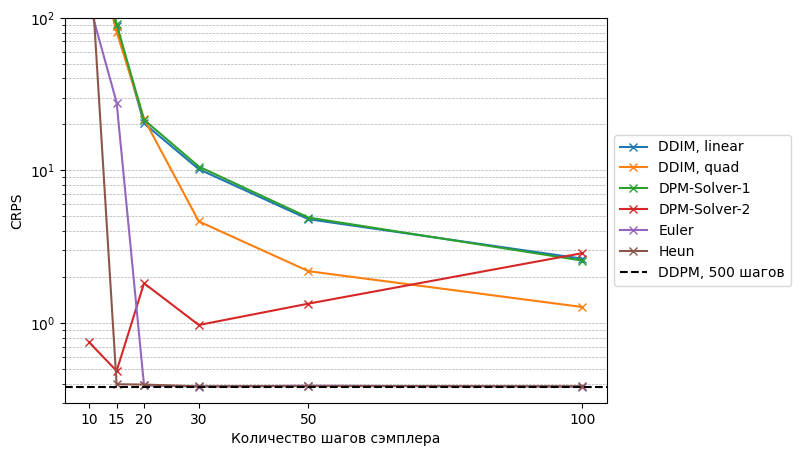

In [111]:
import matplotlib.pyplot as plt
import numpy as np

nfe = [10, 15, 20, 30, 50, 100]
plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    crps = [run['96_test_CRPS'] for run in runs]
    plt.plot(solver_steps, crps, marker='x', linestyle='-', label=sampler)

plt.axhline(y=0.3804873824119568, linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('Количество шагов сэмплера')
plt.xticks(nfe)
plt.ylabel('CRPS')
plt.ylim(0.3, 100)
plt.yscale('log')
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));